In [1]:
import clean, residual, run
import numpy as np
import matplotlib.pylab as plt
import re
import csv
from tables import open_file
from statistics import median, mode
from scipy.optimize import curve_fit, minimize
from math import acos, degrees, log
from matplotlib.colors import LogNorm

In [8]:
import imp
imp.reload(residual)
imp.reload(clean)
imp.reload(run)

<module 'run' from '/Users/MatthewMan/Desktop/UofA/Attenuation, Absorption, & Scattering/Analysis/run.py'>

# ---------------------------------------------------
# sDOM1 POSEIDON 20V

In [5]:
filename = '20190426_090222_UTC_SDOM1_FLASH_POSEIDON1_P2_blue_both_2500Hz_20V_60s_19116090232.hld_up.hdf5'
a = clean.clean(filename)

percentage of high jumps in the file - 6.304246990162356


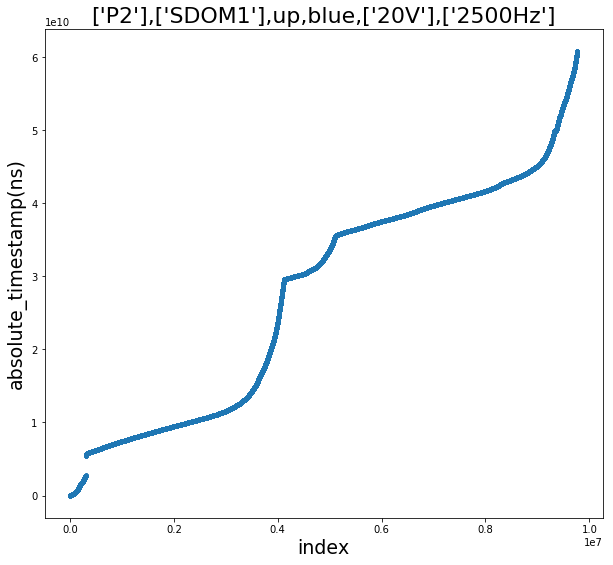

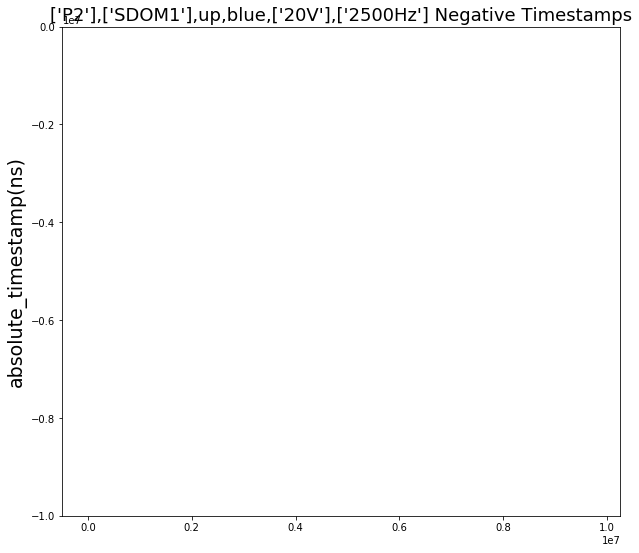

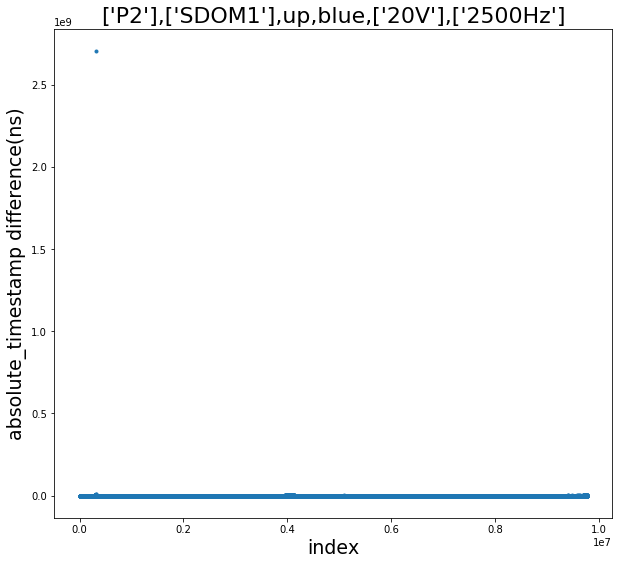

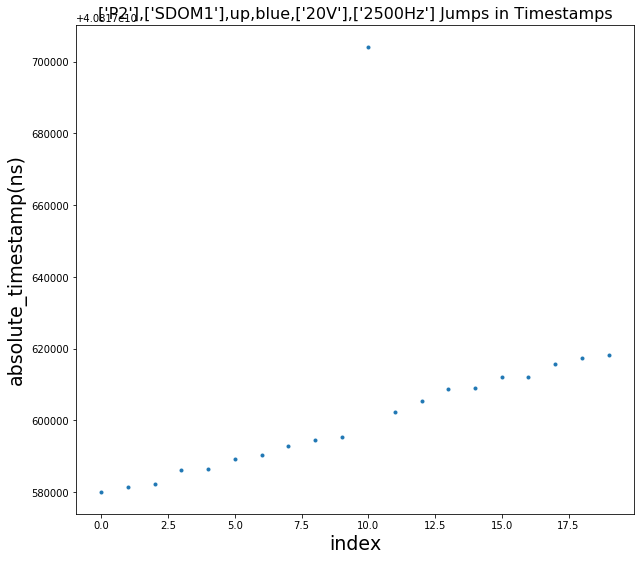

[2285063. 2285064. 2396360. 2486711. 2486712. 2486713. 2486714. 2486715.
 2486716. 2554923. 2554924. 2554925. 2554926. 2554927. 2554928. 2564097.
 2564098. 2564099. 2564100. 2570945. 2570946. 2570947. 2570948. 2570949.
 2570950. 2638697. 2638698. 2638699. 2638700. 2653410. 2653411. 2653412.
 4124052. 4370902. 4410773. 4410774. 4410775. 4415243. 4432239. 4432240.
 4432241. 4432242. 4432243. 4597859. 4597860. 4597861. 4597862. 4597863.
 4597864. 4597865. 5334240. 5334241. 5334242. 5373085. 5403866. 5403867.
 5419450. 5419451. 5419452. 5419453. 5419454. 5419455. 5517931. 5517932.
 5517933. 5665456. 5665457. 5884362. 5884363. 5884364. 5885925. 5885926.
 5885927. 5885928. 5917080. 5917081. 5917082. 5929869. 5929870. 5929871.
 5929872. 5936579. 5936580. 5936581. 5936582. 5936583. 5936584. 5936585.
 6109698. 6109699. 6109700. 6109701. 6134111. 6134112. 6134113. 6400376.
 6400377. 6401376. 6401377. 6401378. 6455683. 6455684. 6496921. 6496922.
 6496923. 7575835. 7575836. 7575837. 7575838. 75758

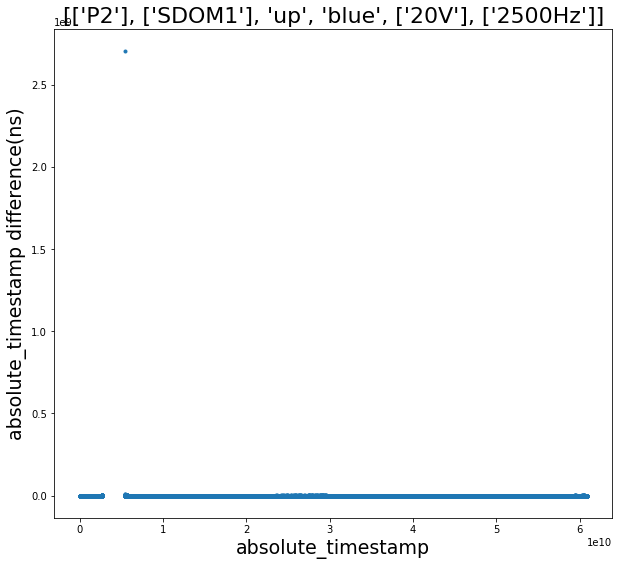

0.2504088968397463


In [7]:
(abs_elim_3, rising_0_elim_3, rising_1_elim_3, rising_2_elim_3, rising_3_elim_3,
 falling_0_elim_3, falling_1_elim_3, falling_2_elim_3, falling_3_elim_3, POCAM_num, values,
atstamp, p_jumps, dt_mean, f_r, file_path, SDOM_num, PMT,sub_time_elim_3,sub_id_elim_3) = a.P_S_used()

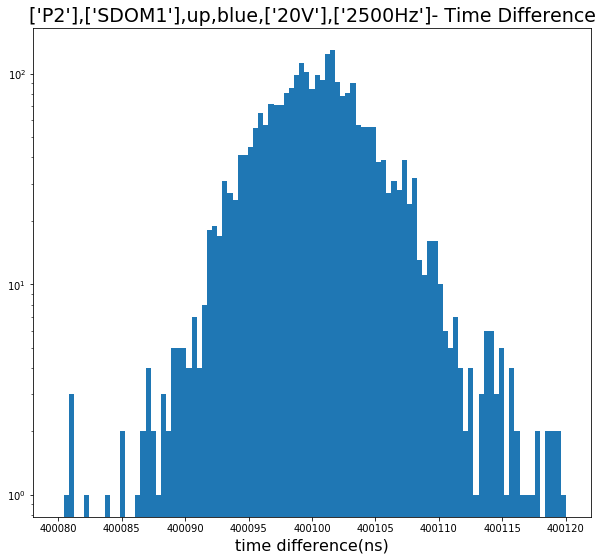

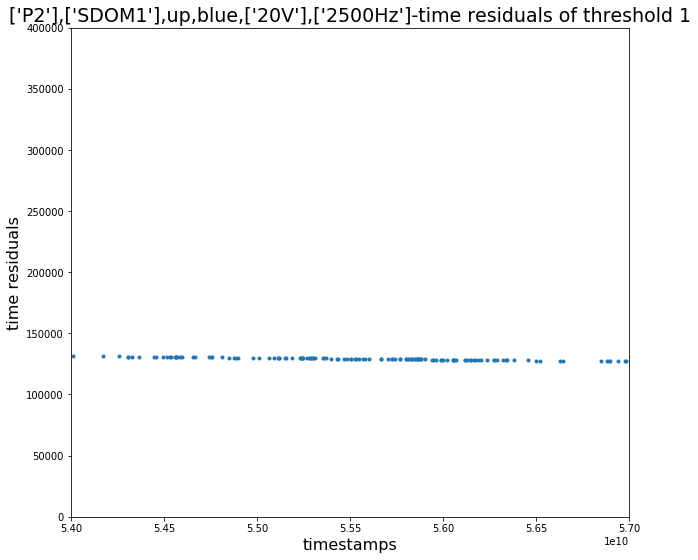

In [9]:
r1 = residual.residual(abs_elim_3,rising_1_elim_3,400080, 400120, 100, 
                                400095, 400115,
             5.4e10,5.7e10,0, 400000, file_path, values, POCAM_num, rising_0_elim_3,falling_0_elim_3)

400100.7273144882


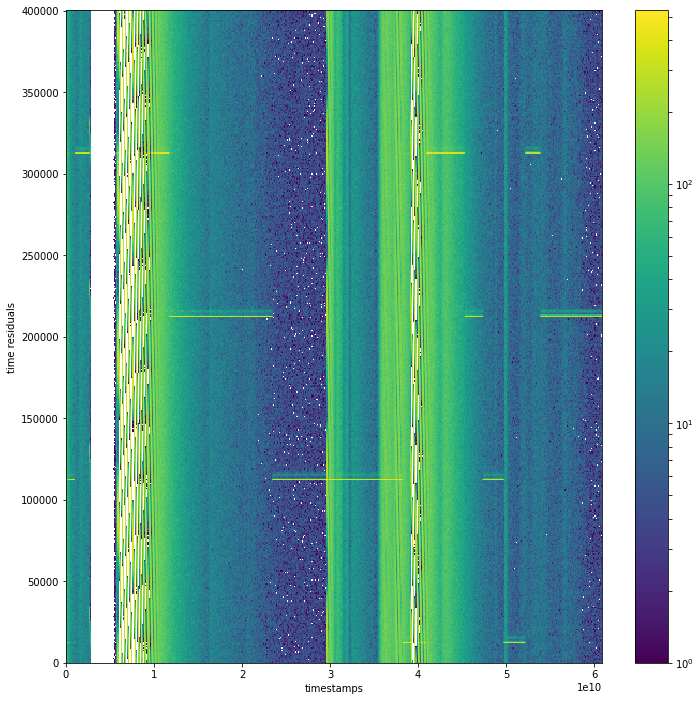

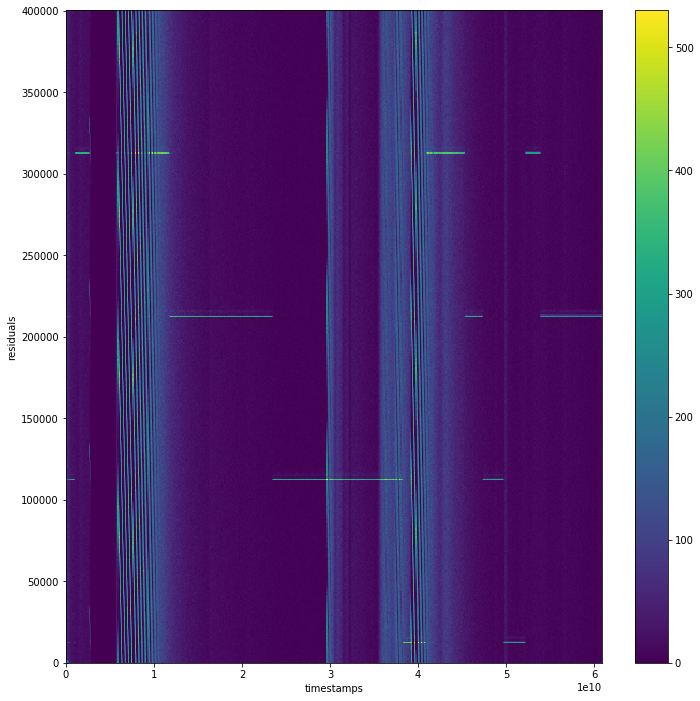

In [12]:
gaus_peak = r1.minimizer(5.4e10,5.7e10)
abs_elim, BinsHist, JumpIndex, xedges, yedges, POCAM_bins, POCAM_diff = r1.HIST2D(500, gaus_peak, SDOM_num)

/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:719: RuntimeWarning: divide by zero encountered in true_divide
  transform = 1.0 / sigma
/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:785: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


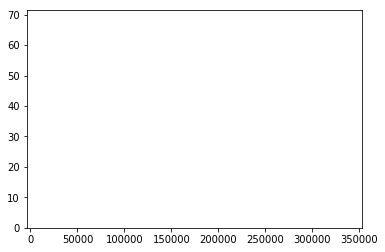

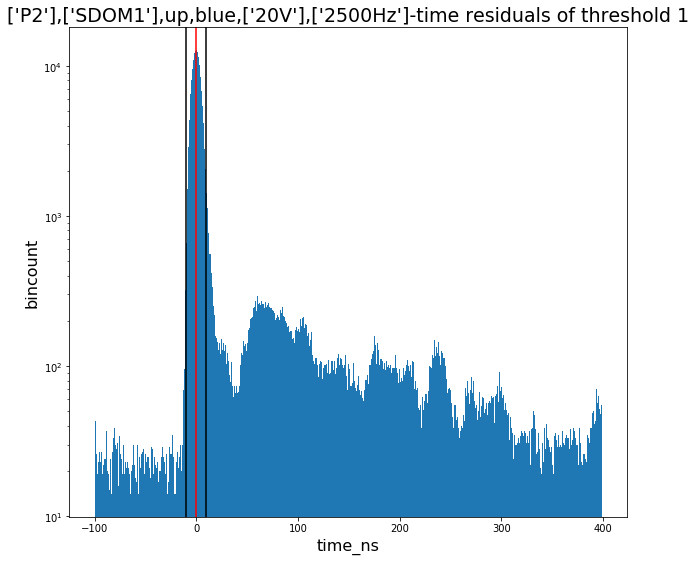

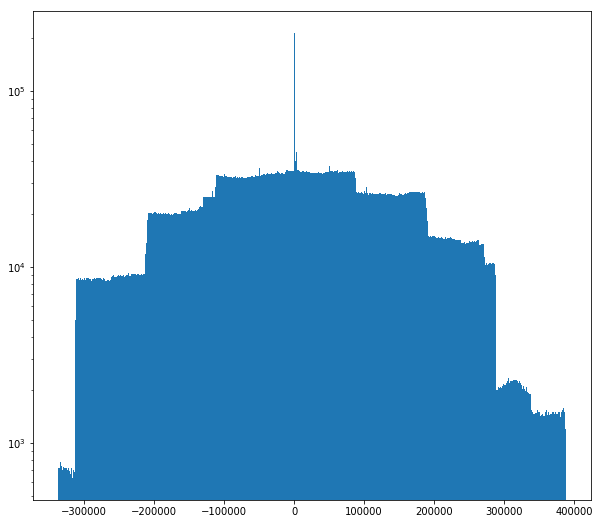

In [13]:
t_res_all1,num_events1, noise_events1 = r1.calc_res(BinsHist, 10, 2, 1,bin_size=1)

2381
jump_index [0.000e+00 1.000e+00 2.000e+00 3.000e+00 1.400e+01 9.500e+01 9.600e+01
 2.240e+02 1.466e+03 1.471e+03 1.482e+03 1.493e+03 1.574e+03 1.575e+03
 1.576e+03 1.679e+03 1.737e+03]
jump_index size 17
index_p 0
Jump Indices 0 2
2
400100.74566403223


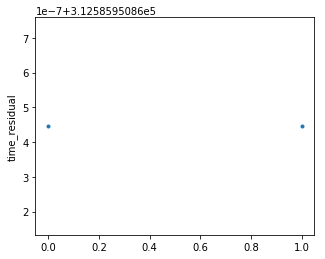

/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:719: RuntimeWarning: divide by zero encountered in true_divide
  transform = 1.0 / sigma
/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:785: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


index_p 1
Jump Indices 2 3
1
400102.58792896156


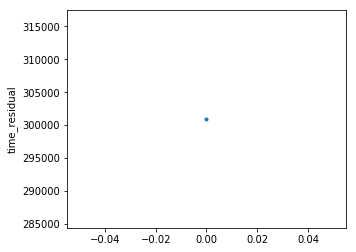

index_p 2
Jump Indices 3 4
1
400102.58792896156


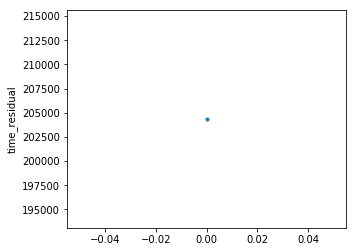

index_p 3
Jump Indices 4 15
11
400100.7272906884


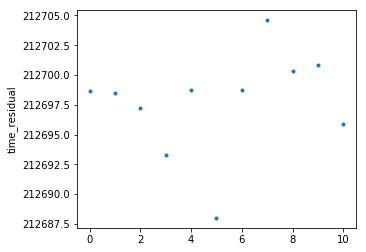

index_p 4
Jump Indices 15 96
81
400100.7263485089


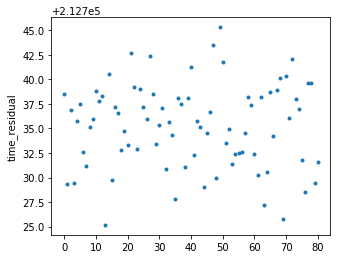

index_p 5
Jump Indices 96 97
1
400102.58792896156


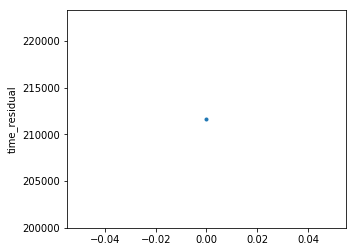

index_p 6
Jump Indices 97 225
128
400100.72653774475


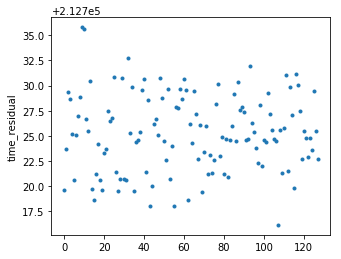

index_p 7
Jump Indices 225 1467
1242
400100.7266256507


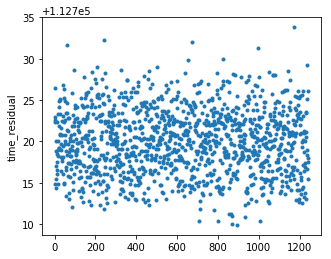

index_p 8
Jump Indices 1467 1472
5
400100.6599384239


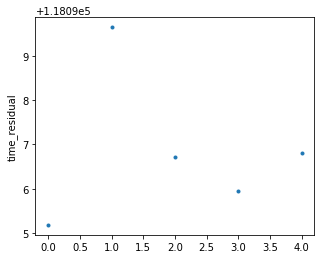

index_p 9
Jump Indices 1472 1483
11
400100.728262979


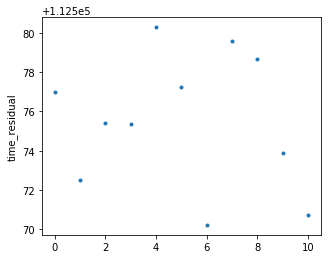

index_p 10
Jump Indices 1483 1494
11
400100.7266501702


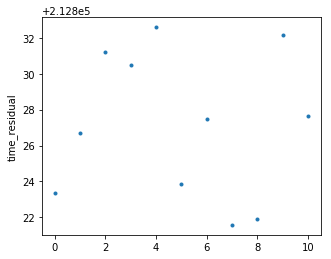

index_p 11
Jump Indices 1494 1575
81
400100.7268710535


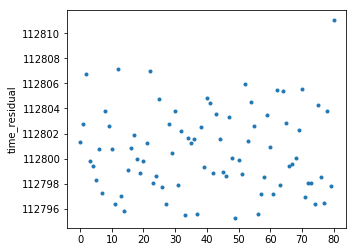

index_p 12
Jump Indices 1575 1576
1
400102.58792896156


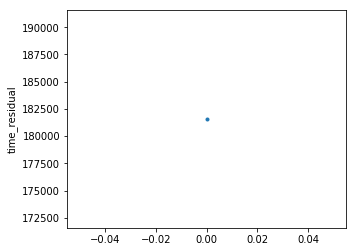

index_p 13
Jump Indices 1576 1577
1
400102.58792896156


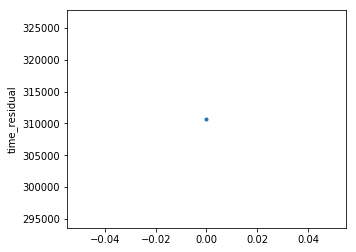

index_p 14
Jump Indices 1577 1680
103
400100.7268366222


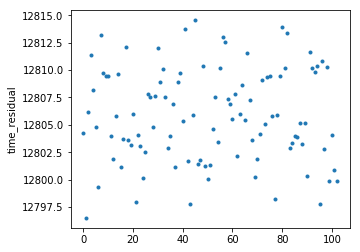

index_p 15
Jump Indices 1680 1738
58
400100.7271497367


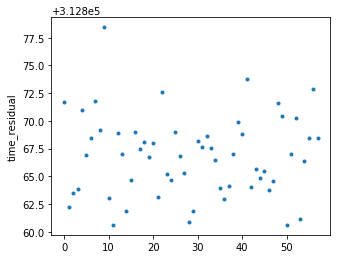

index_p 16
Jump Index size = 17 2380
[1738]
Jump Indices 1738 2380
400100.72733860346


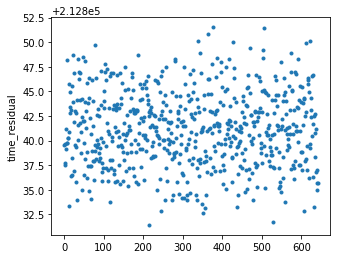

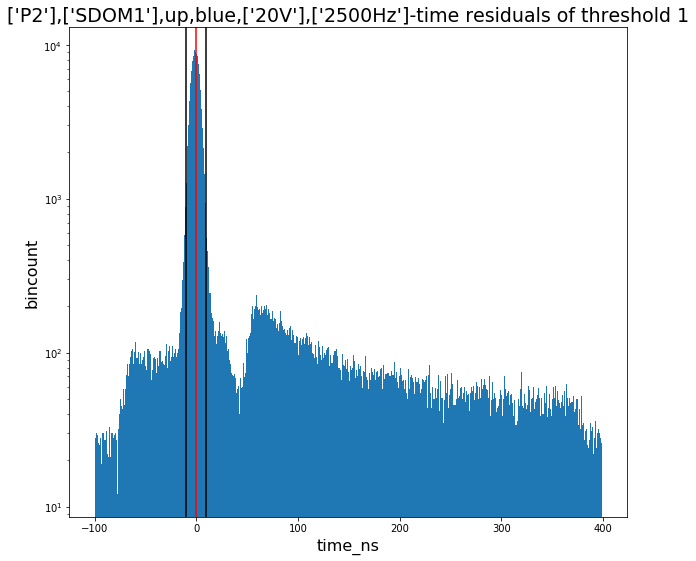

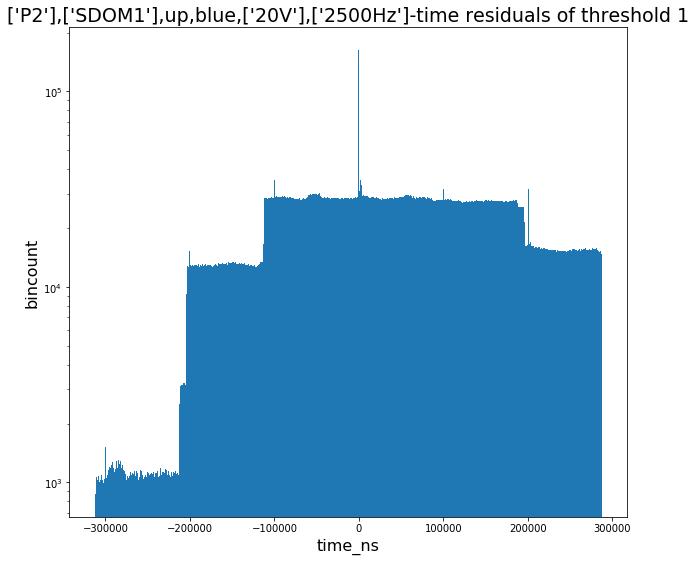

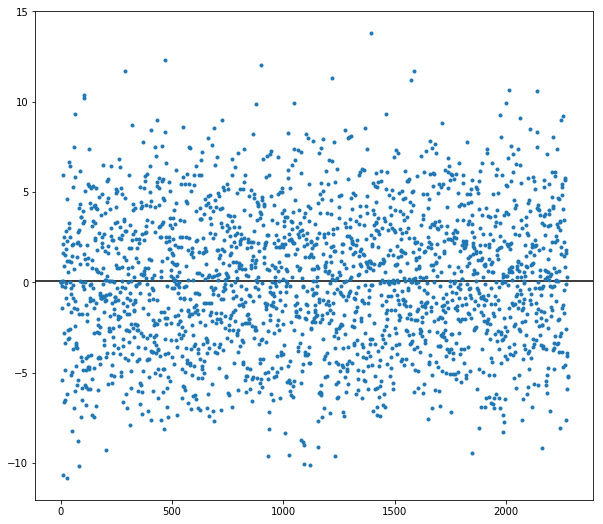

In [11]:
t_res_all1,  num_events1, noise_events1 = r1.res(gaus_peak,1000, 5)

# ---------------------------------------------------
# sDOM1 POSEIDON 12V

In [83]:
filename = '20190426_081107_UTC_SDOM1_FLASH_POSEIDON1_P2_blue_both_2500Hz_12V_60s_19116081117.hld_up.hdf5'
a = clean.clean(filename)

percentage of high jumps in the file - 28.580030847957303


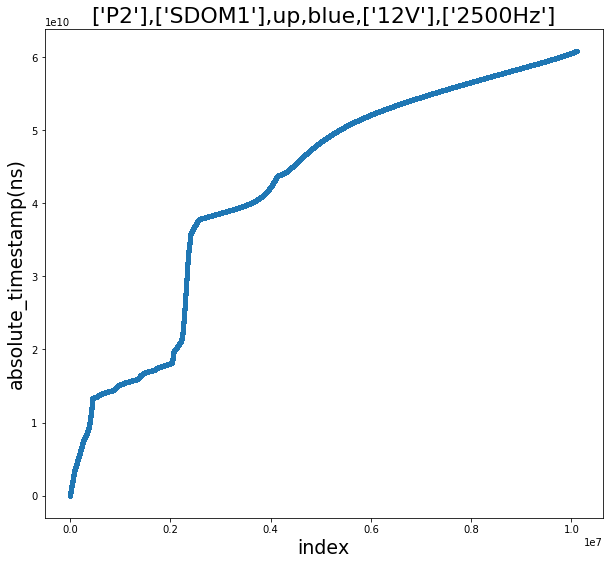

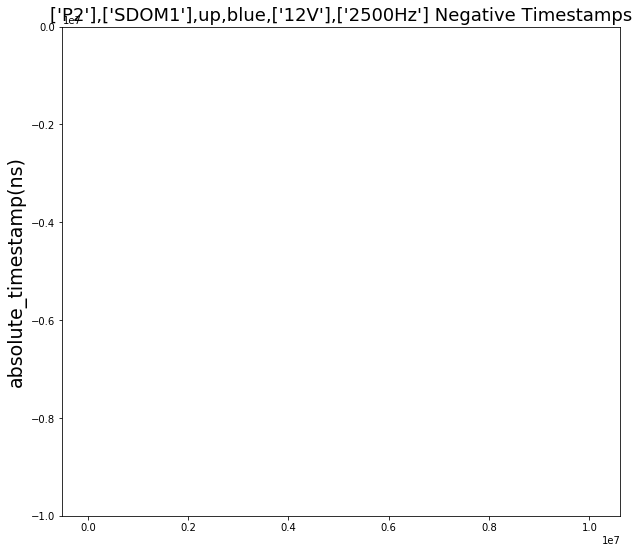

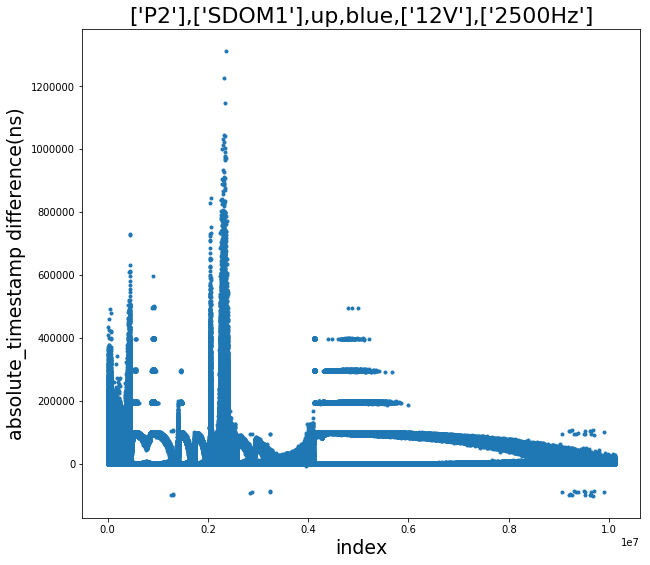

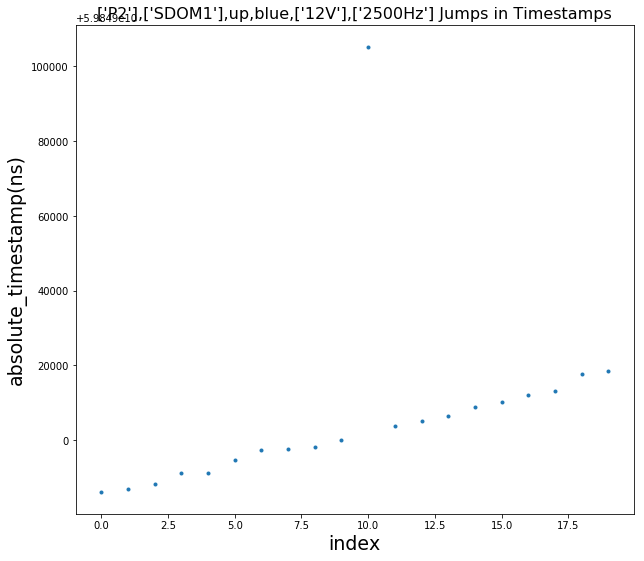

[1270683. 1270684. 1270685. 1296979. 1302167. 2849757. 2849758. 2849759.
 2849760. 2849761. 2849762. 2849763. 2849764. 2849765. 2849766. 2875081.
 2875082. 2875083. 2875084. 2875085. 2875086. 2875087. 2875088. 2875089.
 3231711. 3231712. 3231713. 3231714. 3237752. 3237753. 3237754. 3962229.
 3962230. 3962231. 3962232. 3962233. 3962234. 3962235. 3962236. 3962237.
 9059959. 9059960. 9059961. 9059962. 9059963. 9059964. 9198400. 9198401.
 9198402. 9198403. 9198404. 9198405. 9230002. 9230003. 9262432. 9262433.
 9262434. 9300813. 9300814. 9300815. 9300816. 9348670. 9348671. 9348672.
 9348673. 9348674. 9348675. 9348676. 9388306. 9388307. 9388308. 9388309.
 9503641. 9503642. 9503643. 9503644. 9503645. 9503646. 9503647. 9521363.
 9521527. 9521528. 9521529. 9521530. 9617533. 9642479. 9642480. 9645336.
 9645337. 9645338. 9645339. 9686724. 9693052. 9693053. 9693054. 9693055.
 9693056. 9888910. 9888911. 9888912. 9888913. 9888914. 9888915. 9888916.
 9888917. 9888918.]


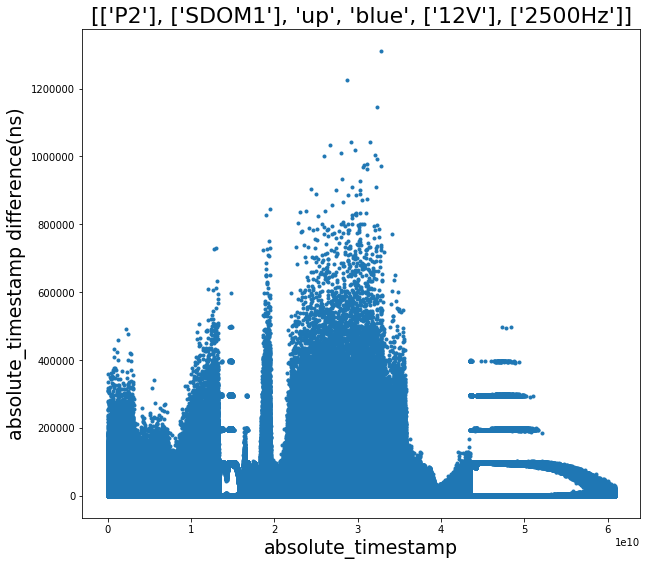

0.6840180315737691


In [84]:
(abs_elim_3, rising_0_elim_3, rising_1_elim_3, rising_2_elim_3, rising_3_elim_3,
 falling_0_elim_3, falling_1_elim_3, falling_2_elim_3, falling_3_elim_3, POCAM_num, values,
atstamp, p_jumps, dt_mean, f_r, file_path, SDOM_num, PMT,sub_time_elim_3,sub_id_elim_3) = a.P_S_used()

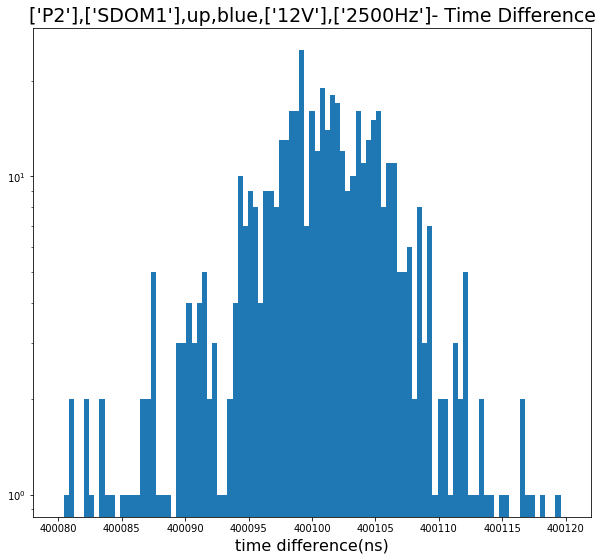

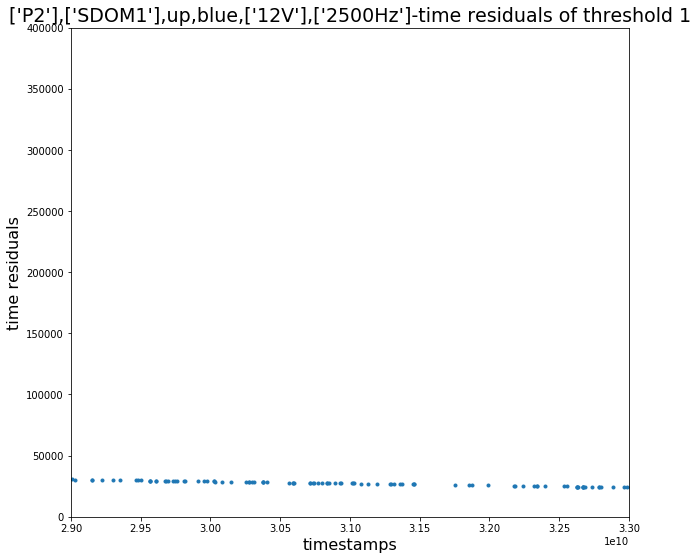

In [96]:
r1 = residual.residual(abs_elim_3,rising_1_elim_3,400080, 400120, 100, 
                                400095, 400115,
             2.9e10,3.3e10,0, 400000, file_path, values, POCAM_num, rising_0_elim_3,falling_0_elim_3)

400100.6845003009


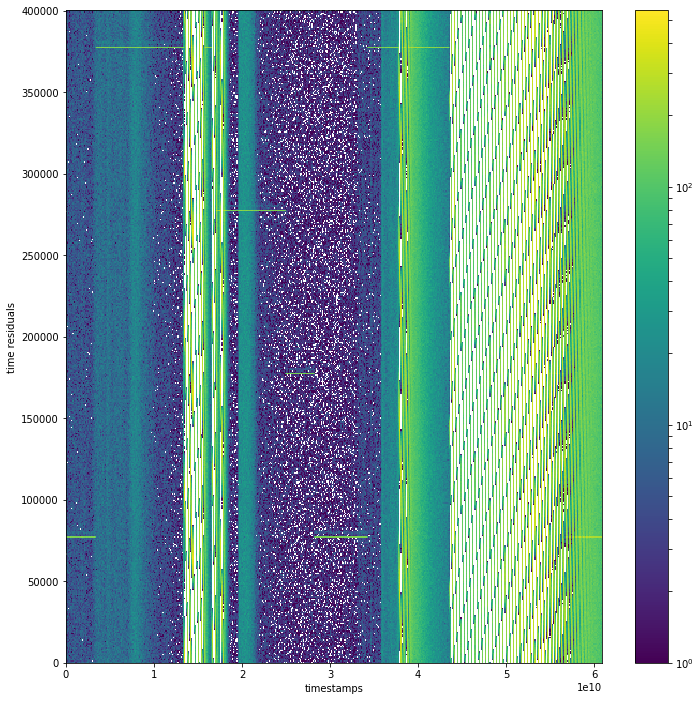

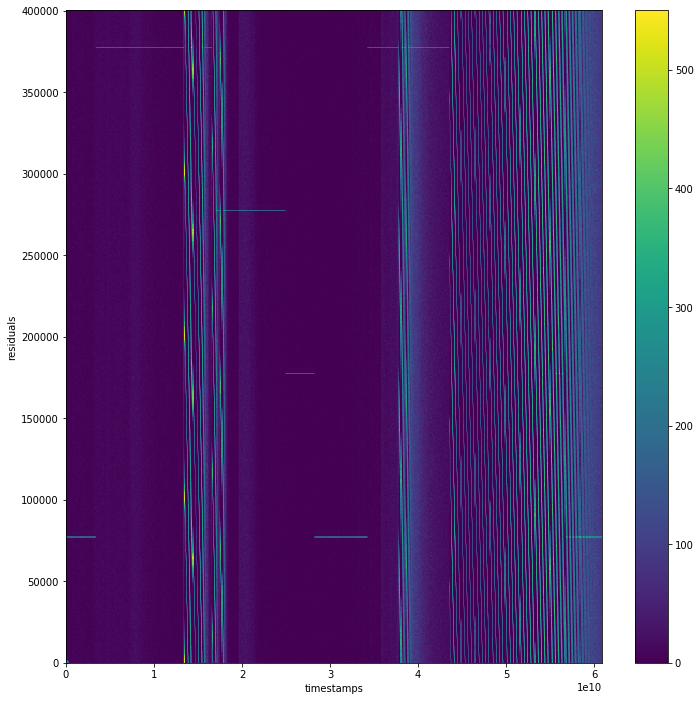

In [97]:
gaus_peak = r1.minimizer(2.9e10,3.3e10)
abs_elim, BinsHist, JumpIndex, xedges, yedges, POCAM_bins, POCAM_diff = r1.HIST2D(500, gaus_peak, SDOM_num)

0.7039617433301677


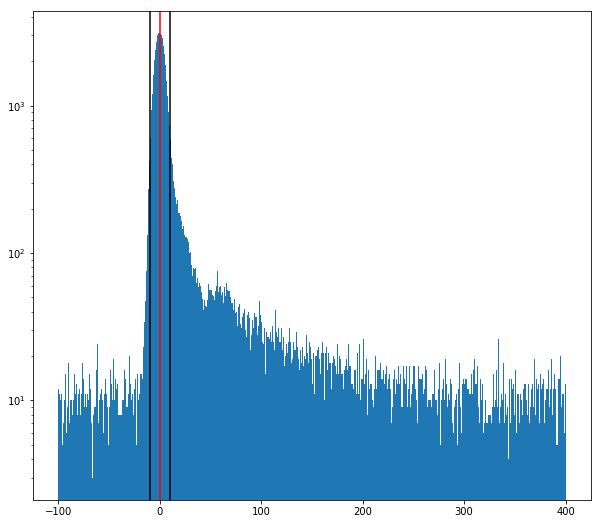

In [157]:
## POCAM signal (plot by eye)

time_window1 = (abs_elim_3<0.336e10)
time_window2 = (abs_elim_3>2.46e10) & (abs_elim_3<2.772e10)
time_window3 = (abs_elim_3>1.764e10) & (abs_elim_3<2.46e10)
time_window4 = ((abs_elim_3>0.336e10) & (abs_elim_3<1.764e10)) 
time_window5 = ((abs_elim_3>2.772e10) & (abs_elim_3<3.372e10))
time_window6 = ((abs_elim_3>3.372e10) & (abs_elim_3<4.284e10))

my_data_all = np.array([])
weights_all = np.array([])

my_slice = (abs_elim_3+rising_1_elim_3)[time_window1] 
weights = r1.weights[time_window1]
my_res = (my_slice%gaus_peak) - 223260 + 145000+1000+72
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window2]
weights = r1.weights[time_window2]
my_res = (my_slice%gaus_peak) - 223260-100000+89-500-15+148000-1500-175+46
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window3]
weights = r1.weights[time_window3]
my_res = (my_slice%gaus_peak) - 223260-100000+89-500-15-123+48000-1700+200-2
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window4]
weights = r1.weights[time_window4]
my_res = (my_slice%gaus_peak) -100000+89-500-15-123-275000-1750
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window5] 
weights = r1.weights[time_window5]
my_res = (my_slice%gaus_peak) - 223260 + 145000+1000-72+16
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window6]
weights = r1.weights[time_window6]
my_res = (my_slice%gaus_peak) -100000+89-500-15-123-275000-1750-120
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

fig, ax = plt.subplots(figsize=(10,9))
n,bins,patches = ax.hist(my_data_all,bins=500,log=True, weights=weights_all, range=(-100,400))
ax.axvline(color='r')
ax.axvline(10,color='k')
ax.axvline(-10,color='k')

# save to csv
path = 'Data/POSEIDON1/Measured_arrival_times/'
filename = "['P2'],['SDOM1'],up,blue,['12V'],['2500Hz'].csv"
with open(path+filename, 'w') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(bins[:-1])
    writer.writerow(n)
csvfile.close()

time_correction_4 = 4.284*1e10/(abs_elim_3[-1]-abs_elim_3[0])
print(time_correction_4)


In [158]:
sDOM1_POSEIDON_run = run.run()
run_time, err_run_time, dead_time_uncert = sDOM1_POSEIDON_run.run_time(atstamp, p_jumps, dt_mean, a.f_0,
                                                    a.f_1-a.r_1,
                                                    a.f_2-a.r_2,
                                                    a.f_3-a.r_3)

print('dead_time_uncert: ', dead_time_uncert, '%')

time removed(small jumps) -  295294.56991004944
timestamp of the last event -  60860693883.146
eliminating high jumps and summing -  45036671905.6147
run time -  45036376611.04479
dead_time_uncert:  1.71686043202065 %


/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:719: RuntimeWarning: divide by zero encountered in true_divide
  transform = 1.0 / sigma
/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:785: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


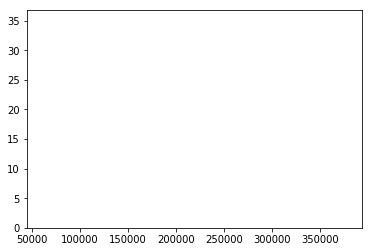

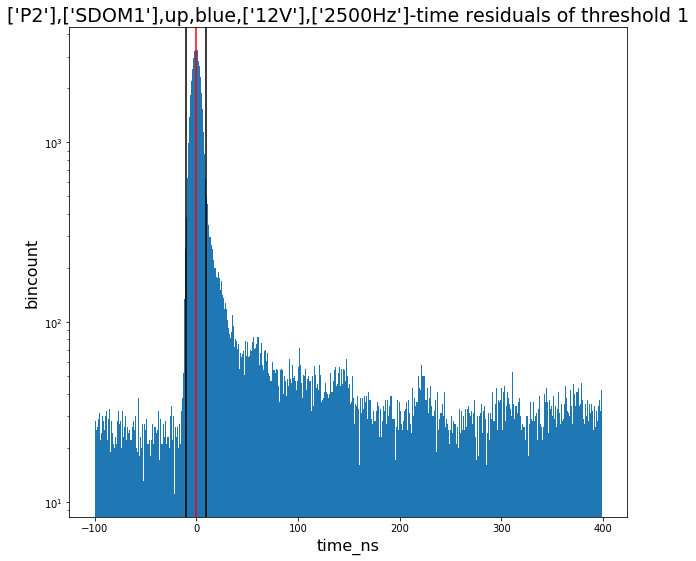

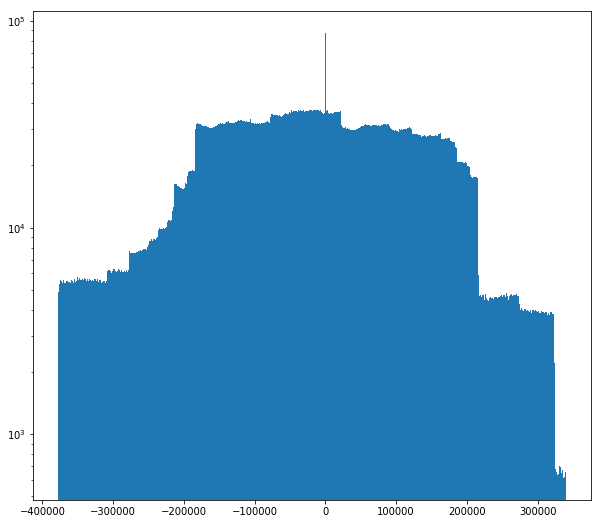

In [98]:
t_res_all1,num_events1, noise_events1 = r1.calc_res(BinsHist, 10, 2, 1,bin_size=1)

# ---------------------------------------------------
# sDOM1 HERA 12V

In [3]:
filename = '20190607_151714_UTC_SDOM1_FLASH_HERA1_P2_blue_both_2500Hz_12V_60s_19158151724.hld_up.hdf5'
a = clean.clean(filename)

percentage of high jumps in the file - 2.489915104156857


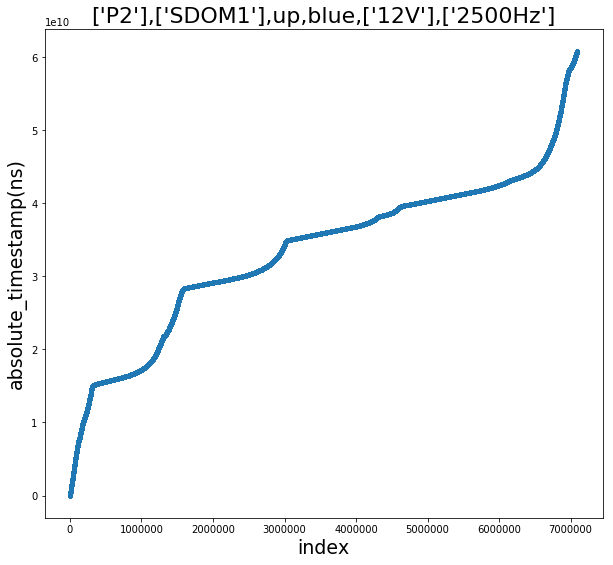

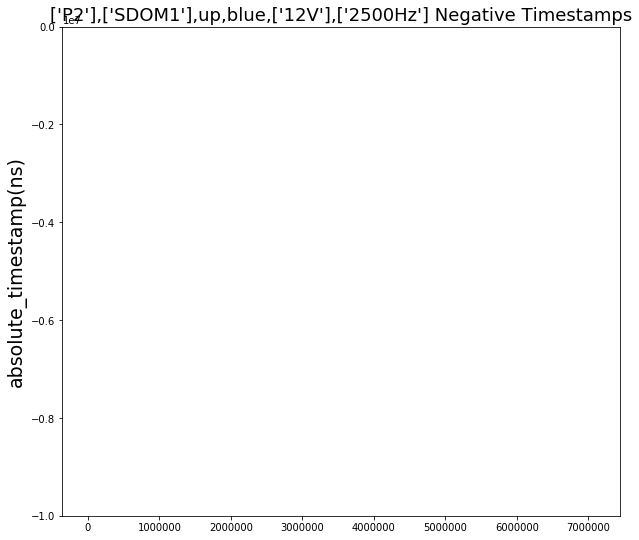

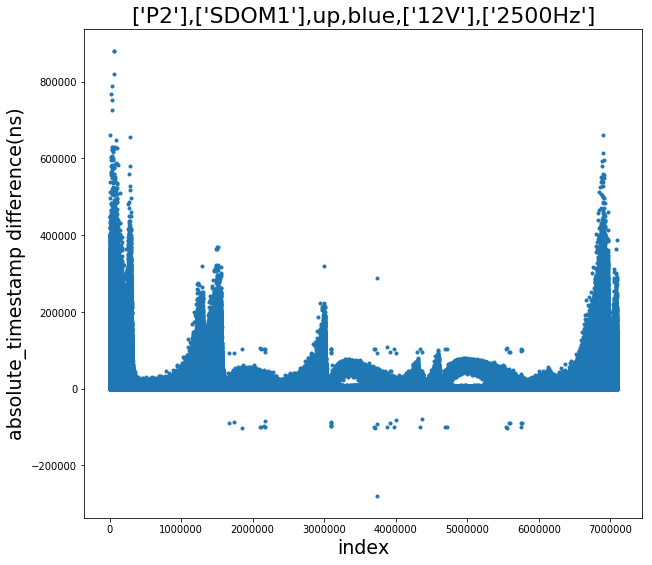

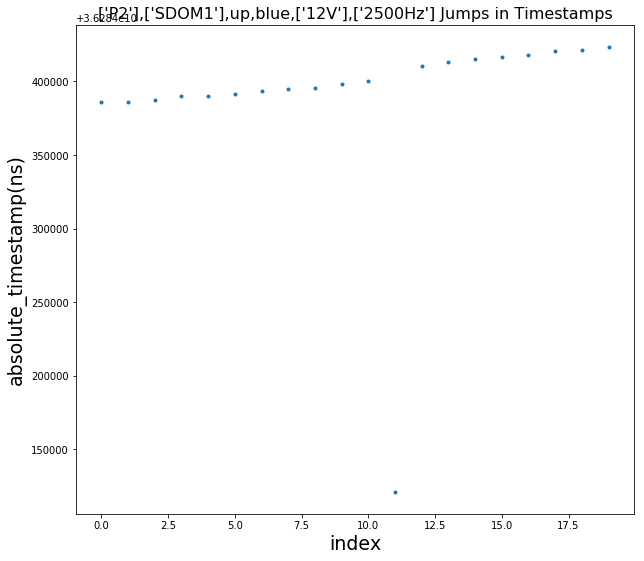

[1672066. 1672067. 1672068. 1672069. 1672070. 1672071. 1672072. 1672073.
 1745992. 1745993. 1745994. 1745995. 1745996. 1745997. 1745998. 1851652.
 1851653. 1851654. 1851655. 1851656. 2110226. 2119300. 2119301. 2154391.
 2176289. 2177720. 2177721. 2177722. 2177723. 2177724. 3089616. 3089617.
 3089618. 3089619. 3089673. 3089674. 3089675. 3093693. 3093694. 3093695.
 3093696. 3093697. 3093698. 3093699. 3094664. 3094721. 3703426. 3703427.
 3703428. 3717308. 3717309. 3717310. 3717311. 3732967. 3732968. 3735438.
 3735439. 3735440. 3735441. 3735442. 3735443. 3735444. 3735445. 3881639.
 3881640. 3881641. 3916518. 3916519. 3916520. 3916521. 3916522. 3916523.
 3916524. 3916525. 3916526. 3916527. 3977357. 3977358. 3998088. 4340793.
 4373182. 4373183. 4685546. 4720895. 5539750. 5552911. 5552912. 5552913.
 5552914. 5578786. 5578787. 5578788. 5578789. 5603892. 5603893. 5603894.
 5603895. 5603896. 5603897. 5603898. 5603899. 5603900. 5603901. 5746315.
 5747253. 5747254. 5747255. 5762107. 5762108. 57621

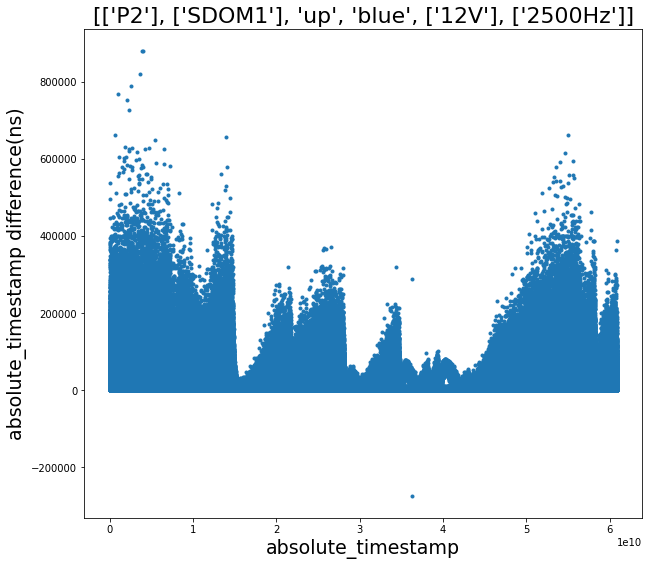

0.12843087039338782


In [4]:
(abs_elim_3, rising_0_elim_3, rising_1_elim_3, rising_2_elim_3, rising_3_elim_3,
 falling_0_elim_3, falling_1_elim_3, falling_2_elim_3, falling_3_elim_3, POCAM_num, values,
atstamp, p_jumps, dt_mean, f_r, file_path, SDOM_num, PMT,sub_time_elim_3,sub_id_elim_3) = a.P_S_used()

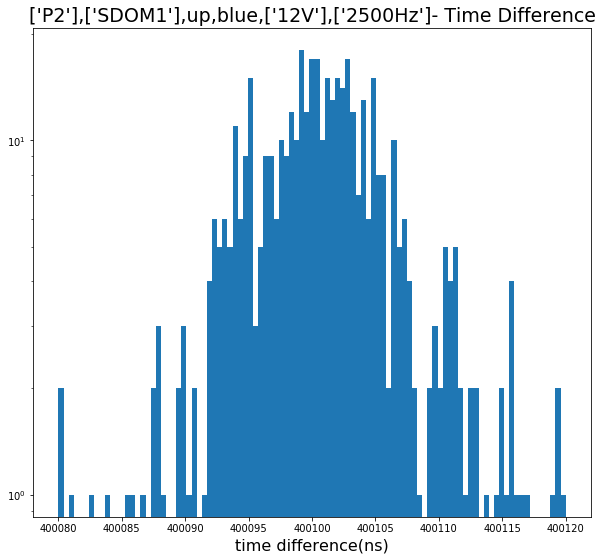

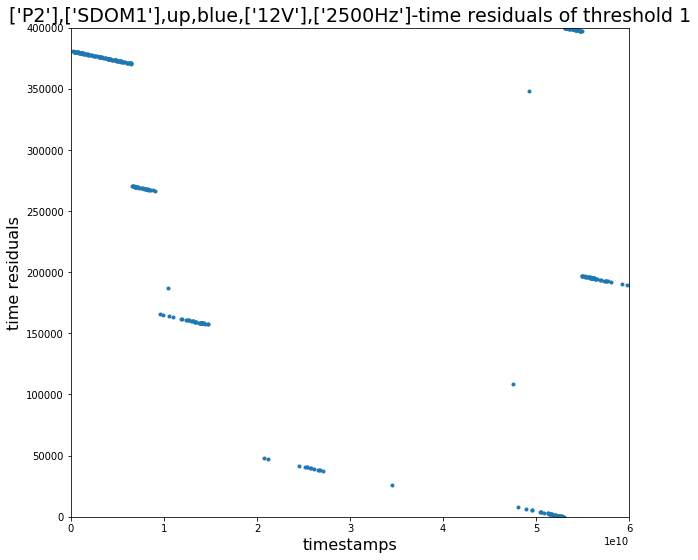

In [9]:
r1 = residual.residual(abs_elim_3,rising_1_elim_3,400080, 400120, 100, 
                                400095, 400105,
             0.0e10,6e10,0, 400000, file_path, values, POCAM_num, rising_0_elim_3,falling_0_elim_3)

400100.69132546947


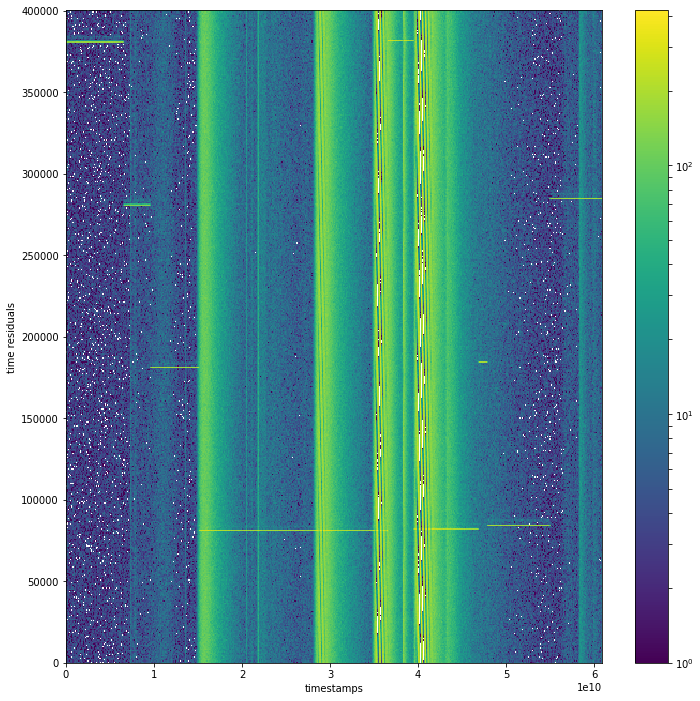

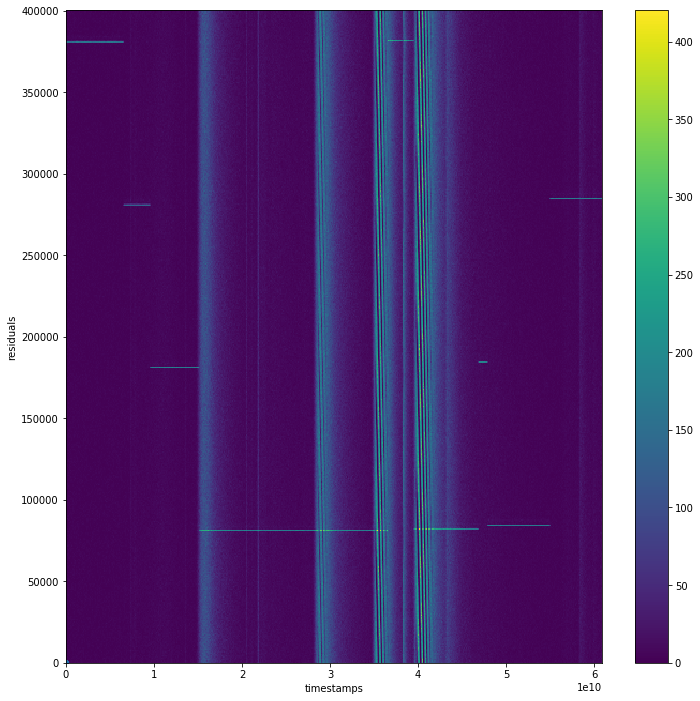

In [6]:
gaus_peak = r1.GetGausPeak([1.7e10,2.7e10]) #400100.6912221222#r1.minimizer(.0e10,.6e10) #
abs_elim, BinsHist, JumpIndex, xedges, yedges, POCAM_bins, POCAM_diff = r1.HIST2D(500, gaus_peak, SDOM_num)

/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:719: RuntimeWarning: divide by zero encountered in true_divide
  transform = 1.0 / sigma
/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:785: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


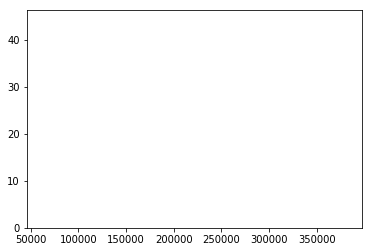

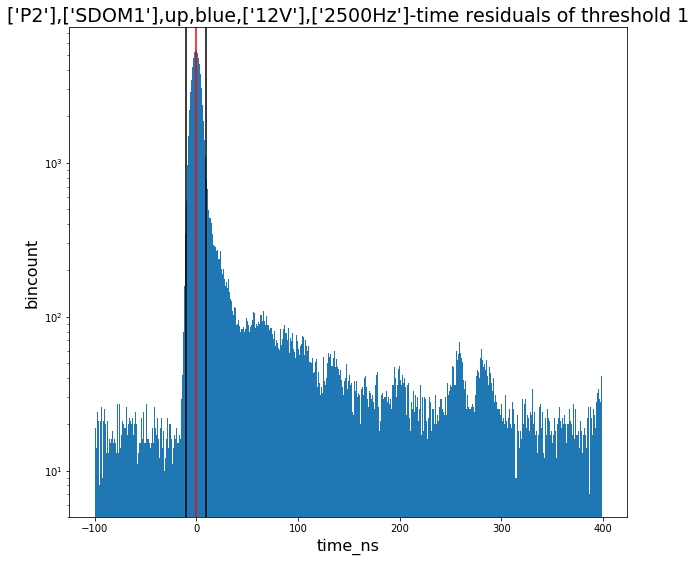

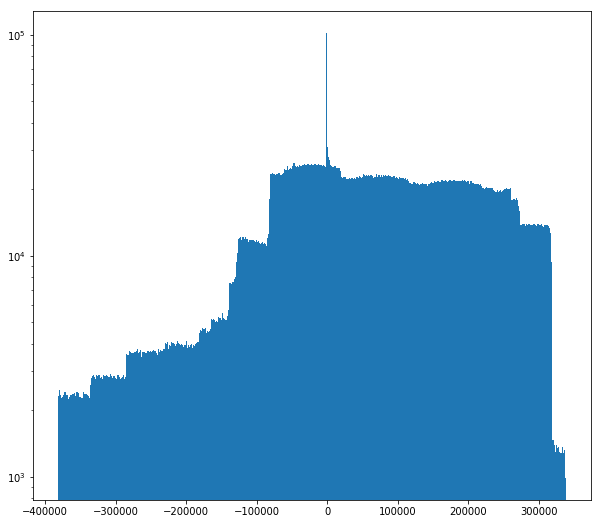

In [150]:
t_res_all1,num_events1, noise_events1 = r1.calc_res(BinsHist, 10, 2, 1,bin_size=1)

0.7140547253133788


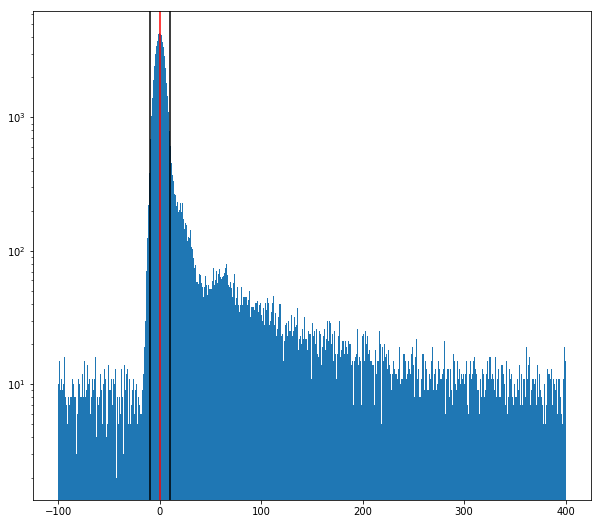

In [42]:
## POCAM signal (plot by eye)

time_window1 = (abs_elim_3<0.6e10)
time_window2 = (abs_elim_3>1e10) & (abs_elim_3<1.5e10)
time_window3 = (abs_elim_3>1.5e10) & (abs_elim_3<3.6e10)
time_window4 = (abs_elim_3>4.9e10) & (abs_elim_3<5.4e10)
time_window5 = (abs_elim_3>5.5e10)

my_data_all = np.array([])
weights_all = np.array([])

my_slice = (abs_elim_3+rising_1_elim_3)[time_window1] 
weights = r1.weights[time_window1]
my_res = (my_slice%gaus_peak) - 380865
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window2]
weights = r1.weights[time_window2]
my_res = (my_slice%gaus_peak) - 180864
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window3]
weights = r1.weights[time_window3]
my_res = (my_slice%gaus_peak) - 80860
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window4]
weights = r1.weights[time_window4]
my_res = (my_slice%gaus_peak) -84660+80
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window5] 
weights = r1.weights[time_window5]
my_res = (my_slice%gaus_peak) - 283860-820
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)


fig, ax = plt.subplots(figsize=(10,9))
n,bins,patches = ax.hist(my_data_all,bins=500,log=True, weights=weights_all, range=(-100,400))
ax.axvline(color='r')
ax.axvline(10,color='k')
ax.axvline(-10,color='k')

# save to csv
path = 'Data/HERA1/blue/Measured_arrival_times/'
filename = "['P2'],['SDOM1'],up,blue,['12V'],['2500Hz'].csv"
with open(path+filename, 'w') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(bins[:-1])
    writer.writerow(n)
csvfile.close()

time_correction_4 = (.6+.5+2.1+.5+abs_elim_3[-1]/1e10-5.5)/6
print(time_correction_4)


In [151]:
sDOM1_HERA_run = run.run()
run_time, err_run_time, dead_time_uncert = sDOM1_HERA_run.run_time(atstamp, p_jumps, dt_mean, a.f_0,
                                                    a.f_1-a.r_1,
                                                    a.f_2-a.r_2,
                                                    a.f_3-a.r_3)

print('dead_time_uncert: ', dead_time_uncert, '%')

time removed(small jumps) -  -4675.987316131592
timestamp of the last event -  60843283518.80273
eliminating high jumps and summing -  59411267323.54919
run time -  59411271999.5365
dead_time_uncert:  0.5062167089540252 %


# ---------------------------------------------------
# sDOM1 MINOS 12V

In [57]:
filename = '20190313_153155_UTC_SDOM1_FLASH_MINOS1_P2_blue_both_2500Hz_12V_30s_19072153205.hld_up.hdf5'
a = clean.clean(filename)

percentage of high jumps in the file - 0.16944444746226248


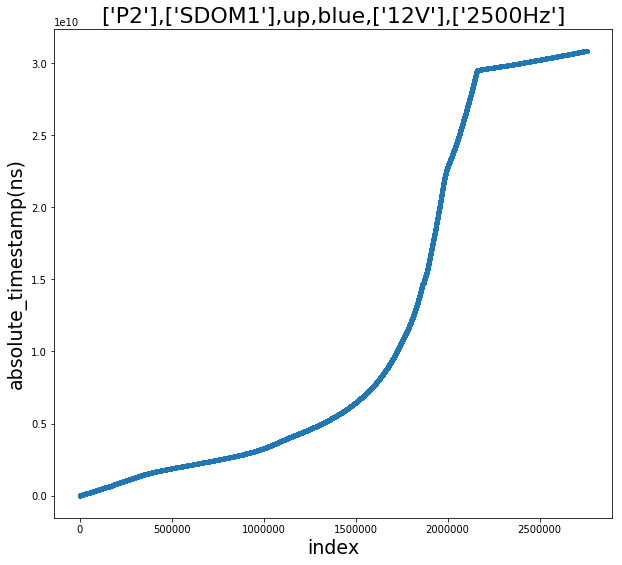

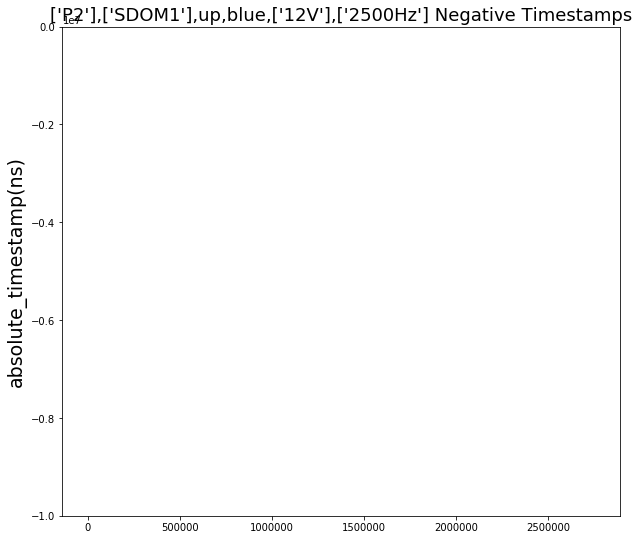

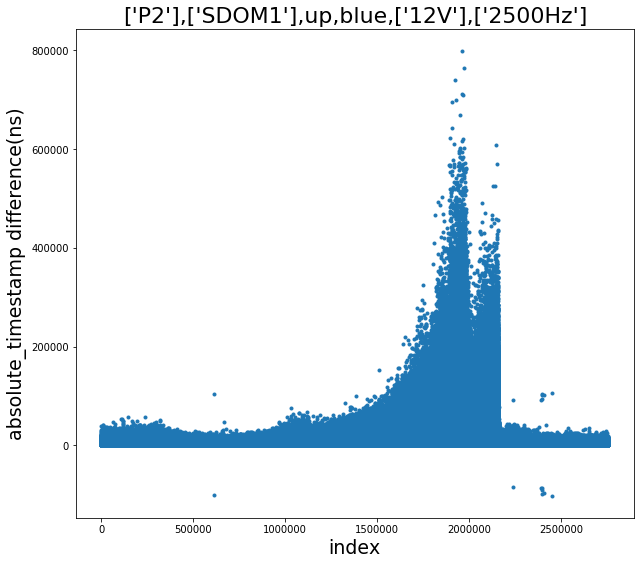

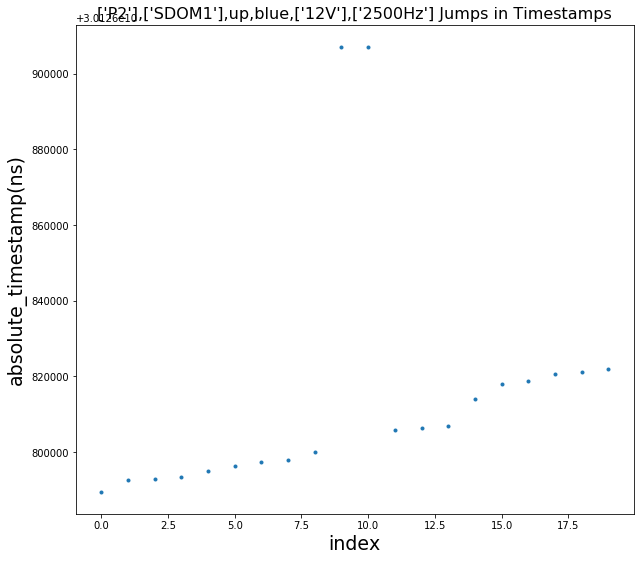

[ 614931.  614932.  614933. 2235886. 2235887. 2392540. 2392541. 2392542.
 2395407. 2395408. 2397170. 2397227. 2397228. 2406584. 2406585. 2450775.
 2450776.]


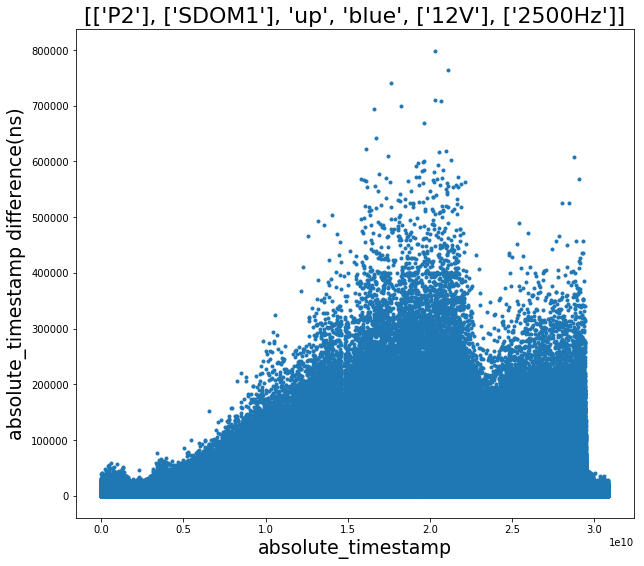

0.10436461233485135


In [58]:
(abs_elim_3, rising_0_elim_3, rising_1_elim_3, rising_2_elim_3, rising_3_elim_3,
 falling_0_elim_3, falling_1_elim_3, falling_2_elim_3, falling_3_elim_3, POCAM_num, values,
atstamp, p_jumps, dt_mean, f_r, file_path, SDOM_num, PMT,sub_time_elim_3,sub_id_elim_3) = a.P_S_used()

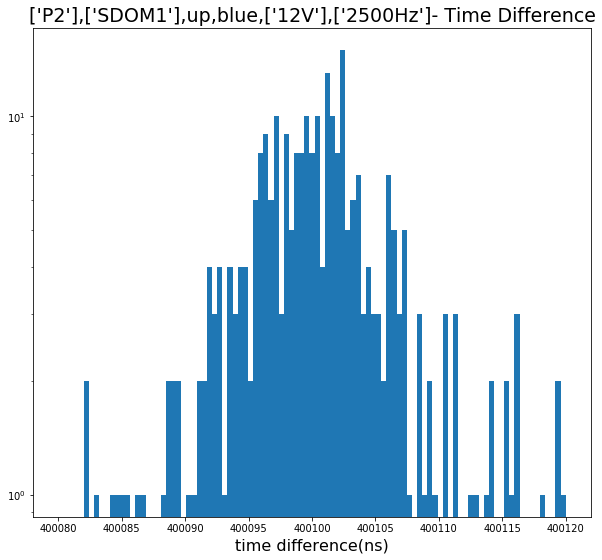

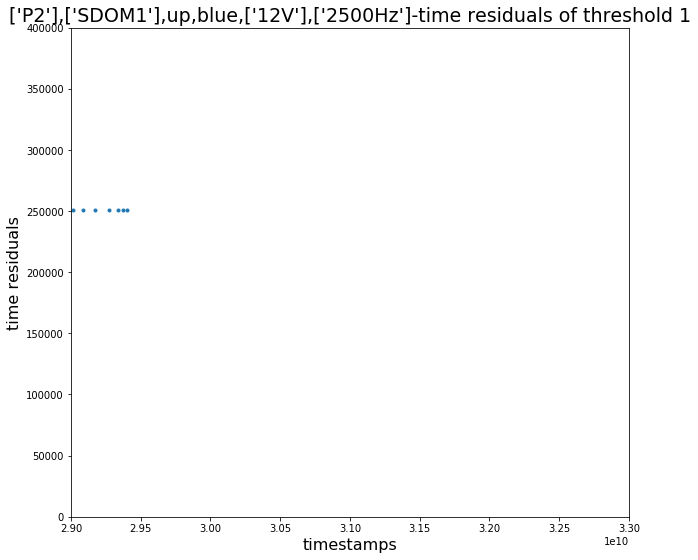

In [59]:
r1 = residual.residual(abs_elim_3,rising_1_elim_3,400080, 400120, 100, 
                                400095, 400105,
             2.9e10,3.3e10,0, 400000, file_path, values, POCAM_num, rising_0_elim_3,falling_0_elim_3)

400100.6651721731


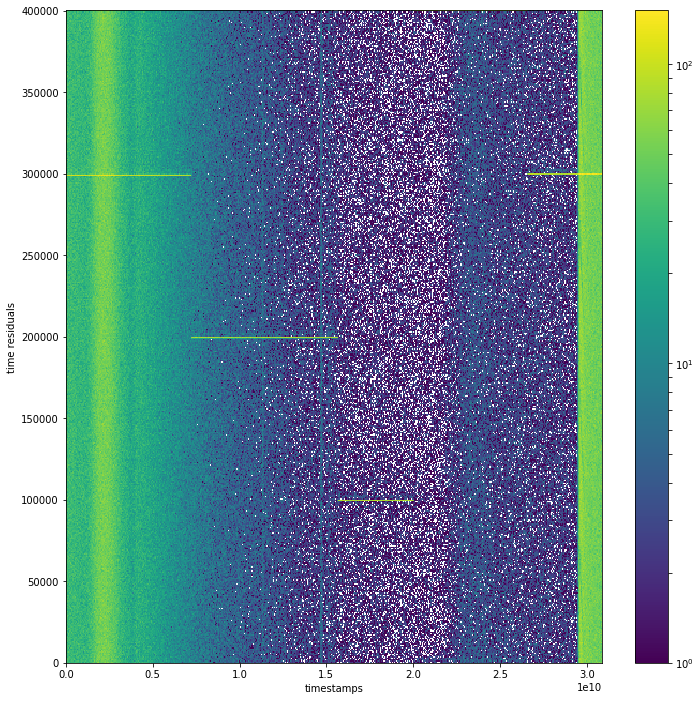

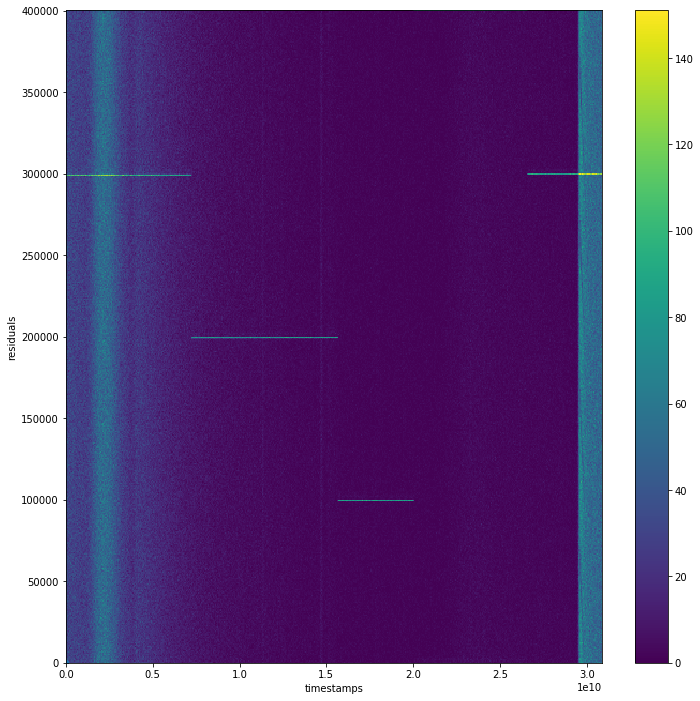

In [61]:
gaus_peak = r1.GetGausPeak([.75e10,1.5e10])
abs_elim, BinsHist, JumpIndex, xedges, yedges, POCAM_bins, POCAM_diff = r1.HIST2D(500, gaus_peak, SDOM_num)

/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:719: RuntimeWarning: divide by zero encountered in true_divide
  transform = 1.0 / sigma
/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:785: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


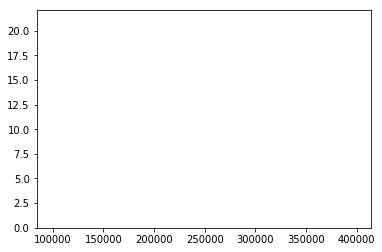

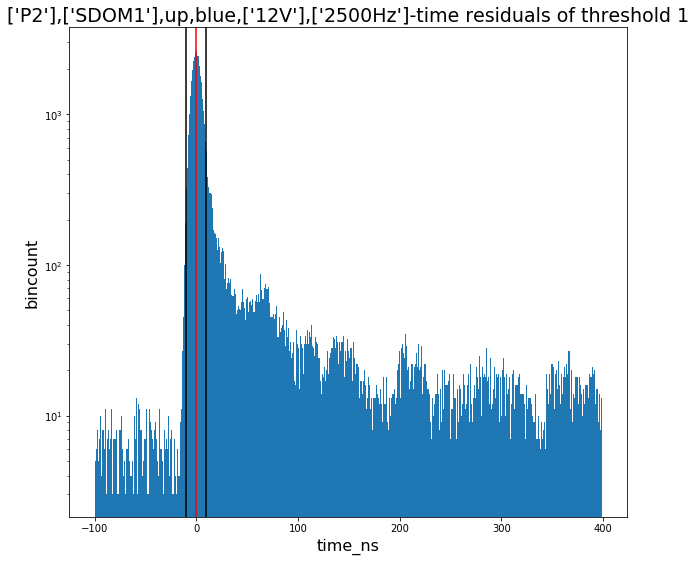

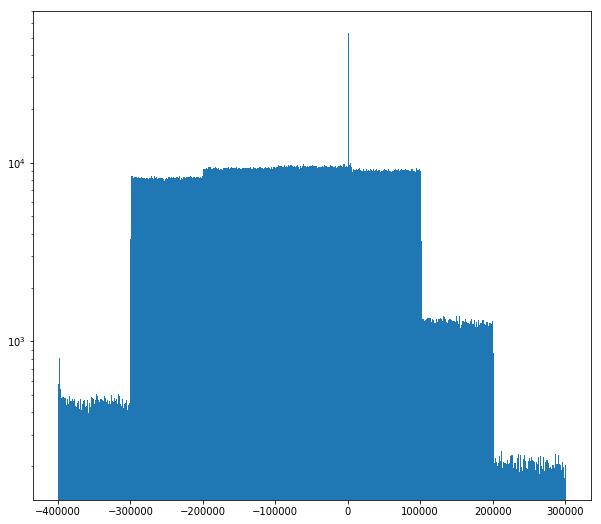

In [62]:
t_res_all1,num_events1, noise_events1 = r1.calc_res(BinsHist, 10, 2, 1,bin_size=1)

0.7999999999999999


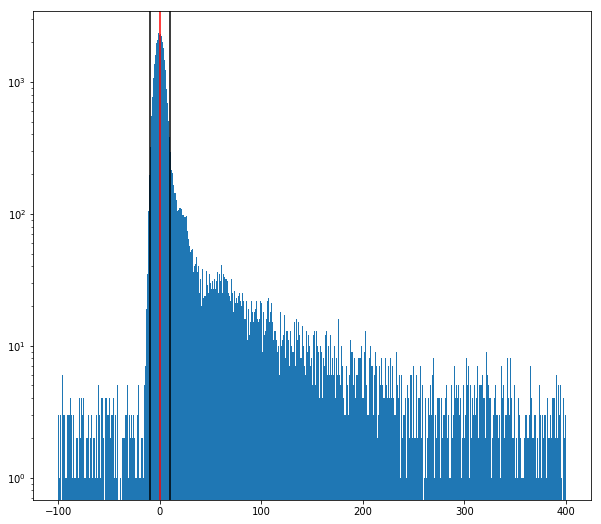

In [111]:
## POCAM signal (plot by eye)

time_window1 = (abs_elim_3>.4e10) & (abs_elim_3<.7e10)#(abs_elim_3<0.4e10) # 
time_window2 = (abs_elim_3>.75e10) & (abs_elim_3<1.55e10)
time_window3 = (abs_elim_3>1.6e10) & (abs_elim_3<2.0e10)
time_window4 = ((abs_elim_3>2.0e10) & (abs_elim_3<2.6e10)) 
time_window5 = ((abs_elim_3>2.6e10) & (abs_elim_3<2.9e10))

my_data_all = np.array([])
weights_all = np.array([])

my_slice = (abs_elim_3+rising_1_elim_3)[time_window1] 
weights = r1.weights[time_window1]
my_res = (my_slice%gaus_peak) - 300000+747.5
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window2]
weights = r1.weights[time_window2]
my_res = (my_slice%gaus_peak) - 200000+744.5
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window3]
weights = r1.weights[time_window3]
my_res = (my_slice%gaus_peak) - 100000+741.5
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window4]
weights = r1.weights[time_window4]
my_res = (my_slice%gaus_peak) -400000+638.5
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window5] 
weights = r1.weights[time_window5]
my_res = (my_slice%gaus_peak) - 300000+635.5
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

fig, ax = plt.subplots(figsize=(10,9))
n,bins,patches = ax.hist(my_data_all,bins=500,log=True, weights=weights_all, range=(-100,400))
ax.axvline(color='r')
ax.axvline(10,color='k')
ax.axvline(-10,color='k')

# save to csv
path = 'Data/MINOS1/blue/Measured_arrival_times/'
filename = "['P2'],['SDOM1'],up,blue,['12V'],['2500Hz'].csv"
with open(path+filename, 'w') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(bins[:-1])
    writer.writerow(n)
csvfile.close()

time_correction_4 = (.3+.8+.4+.6+.3)/3
print(time_correction_4)


In [11]:
sDOM1_MINOS_run = run.run()
run_time, err_run_time, dead_time_uncert = sDOM1_MINOS_run.run_time(atstamp, p_jumps, dt_mean, a.f_0,
                                                    a.f_1-a.r_1,
                                                    a.f_2-a.r_2,
                                                    a.f_3-a.r_3)

print('dead_time_uncert: ', dead_time_uncert, '%')

time removed(small jumps) -  77462.39245653152
timestamp of the last event -  30860393278.29297
eliminating high jumps and summing -  30831781330.859272
run time -  30831703868.466816
dead_time_uncert:  0.055210512264143474 %


# ---------------------------------------------------
# sDOM5 POSEIDON 20V

In [43]:
b = clean.clean('20190426_090224_UTC_SDOM5_FLASH_POSEIDON1_P2_blue_both_2500Hz_20V_60s_19116090234.hld_up.hdf5')

percentage of high jumps in the file - 33.548902875039644


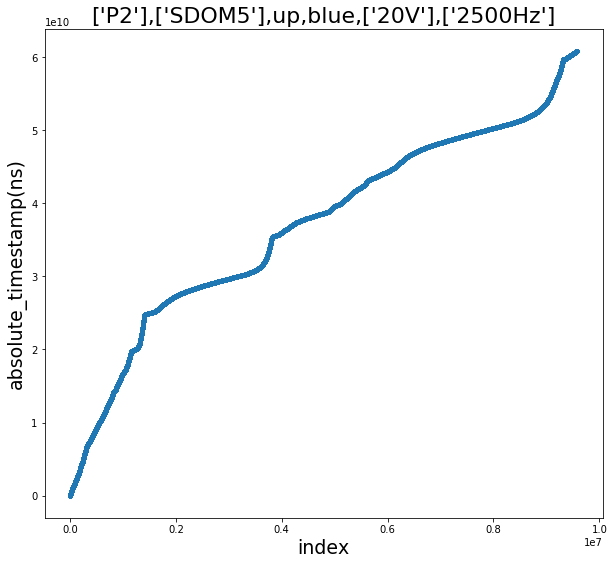

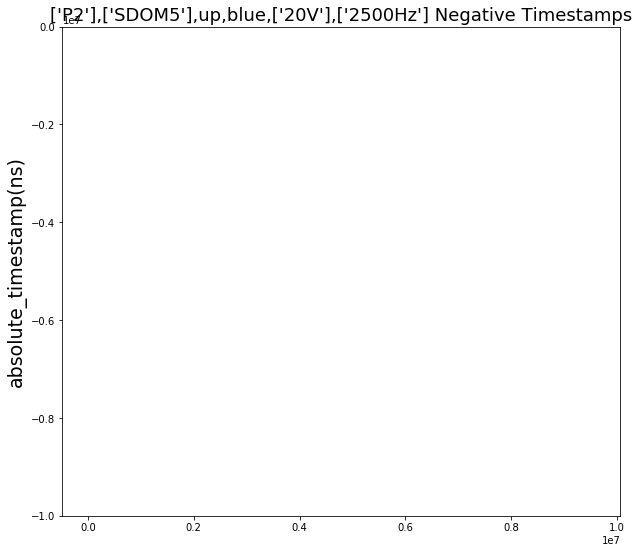

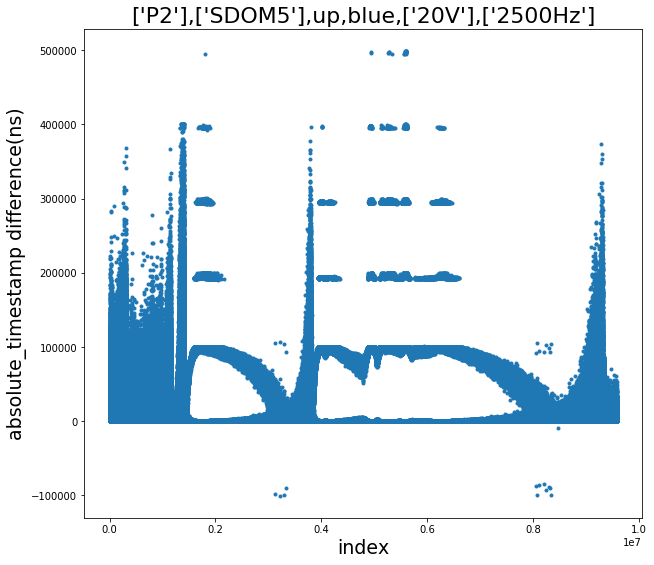

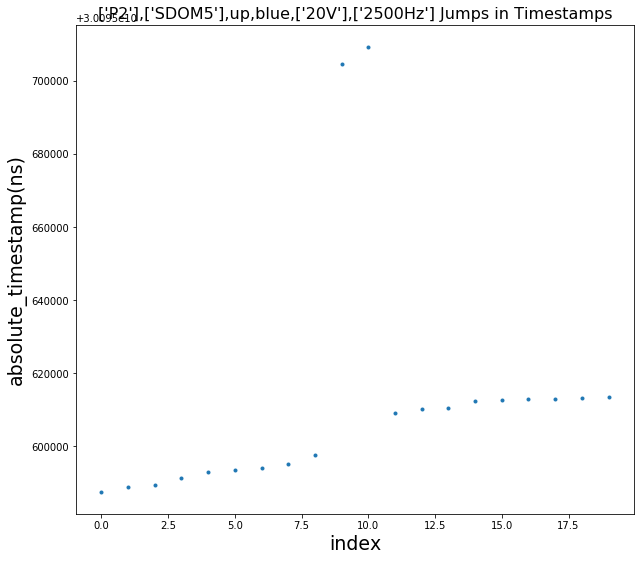

[3127372. 3127373. 3127374. 3220771. 3220772. 3292117. 3323516. 3323517.
 3323518. 3323519. 8060213. 8060214. 8060215. 8060216. 8060217. 8064588.
 8064589. 8115569. 8115570. 8115571. 8115572. 8209102. 8209103. 8250762.
 8307220. 8307221. 8312448. 8312449. 8312450. 8312451. 8312452. 8312453.
 8312454. 8312455. 8312456. 8335550. 8335551. 8476733.]


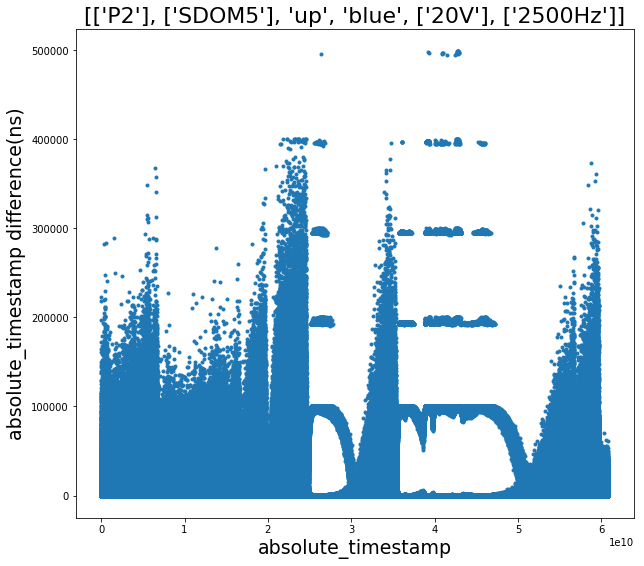

1.1941896318383538


In [48]:
(abs_elim_3, rising_0_elim_3, rising_1_elim_3, rising_2_elim_3, rising_3_elim_3,
 falling_0_elim_3, falling_1_elim_3, falling_2_elim_3, falling_3_elim_3, POCAM_num, values,
atstamp, p_jumps, dt_mean, f_r, file_path, SDOM_num, PMT,sub_time_elim_3,sub_id_elim_3) = b.P_S_used()

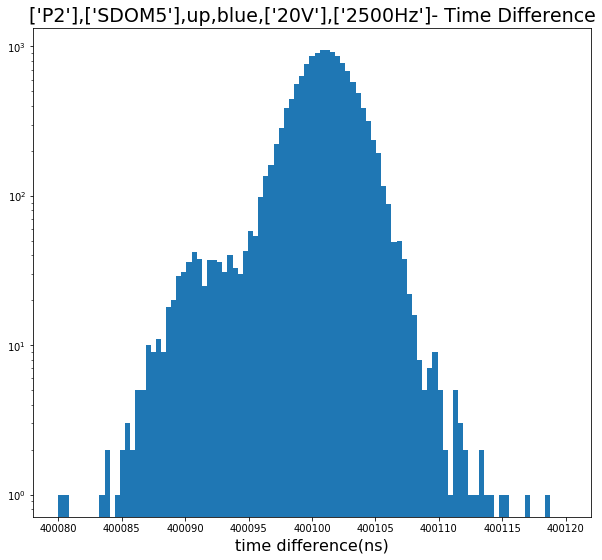

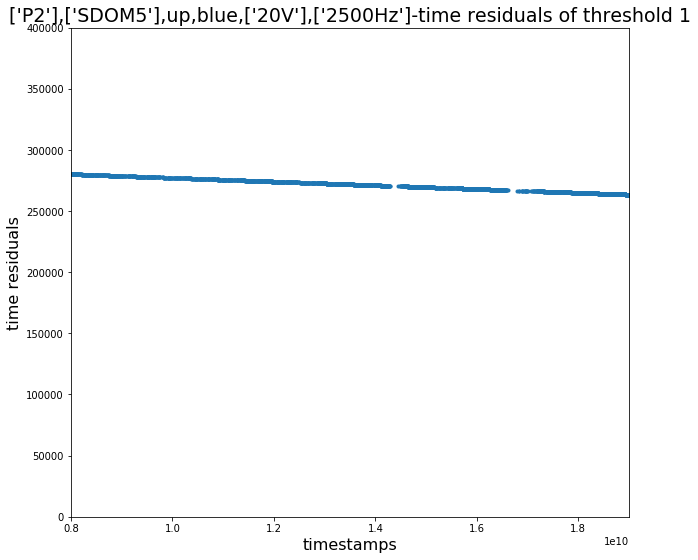

In [52]:
r2 = residual.residual(abs_elim_3,rising_1_elim_3,400080, 400120, 100, 
                                400095, 400115,
             0.8e10,1.9e10,0, 400000, file_path, values, POCAM_num, rising_0_elim_3,falling_0_elim_3)

In [54]:
gaus_peak = r2.minimizer(0.8e10,1.9e10)

400100.7196889426


13346
jump_index [    0.   602.  2565.  4407.  5612.  5637.  5931.  9154.  9155.  9351.
 10989. 10990. 10991. 10992. 10993. 10994. 10995. 10996. 10997. 10998.
 10999. 11001. 11002. 11003. 11004. 11005. 11008. 11011. 11576. 12075.
 13343. 13344.]
jump_index size 32
index_p 0
Jump Indices 0 603
603
400100.7192711563


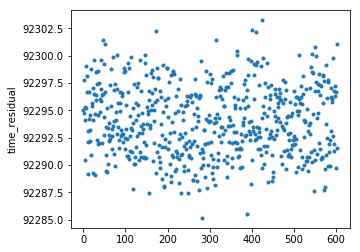

/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:719: RuntimeWarning: divide by zero encountered in true_divide
  transform = 1.0 / sigma
/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:785: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


index_p 1
Jump Indices 603 2566
1963
400100.7195540985


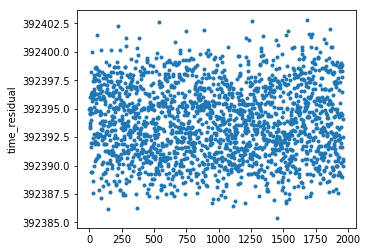

index_p 2
Jump Indices 2566 4408
1842
400100.71966755047


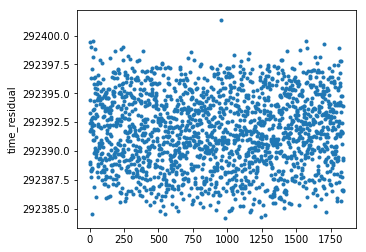

index_p 3
Jump Indices 4408 5613
1205
400100.71982080804


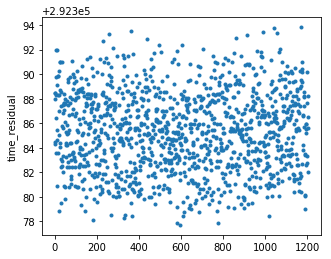

index_p 4
Jump Indices 5613 5638
25
400100.7113023567


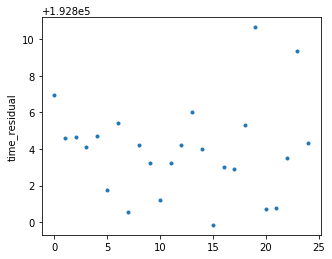

index_p 5
Jump Indices 5638 5932
294
400100.7197508812


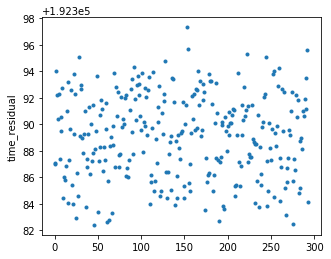

index_p 6
Jump Indices 5932 9155
3223
400100.7199634148


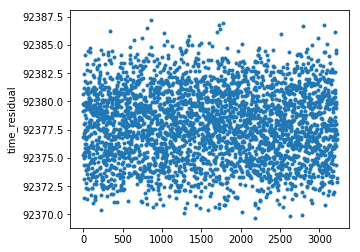

index_p 7
Jump Indices 9155 9156
1


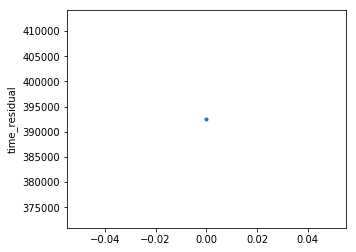

index_p 8
Jump Indices 9156 9352
196
400100.71933958813


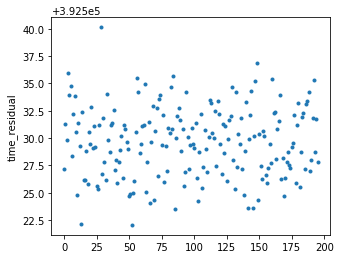

index_p 9
Jump Indices 9352 10990
1638
400100.72000328195


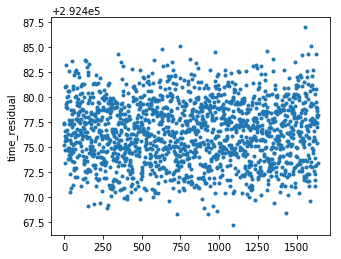

index_p 10
Jump Indices 10990 10991
1


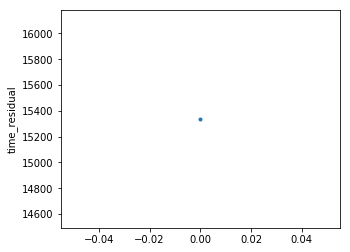

index_p 11
Jump Indices 10991 10992
1


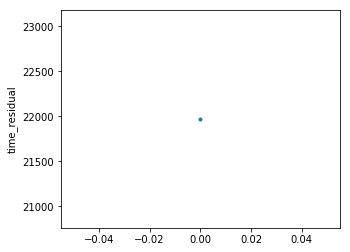

index_p 12
Jump Indices 10992 10993
1


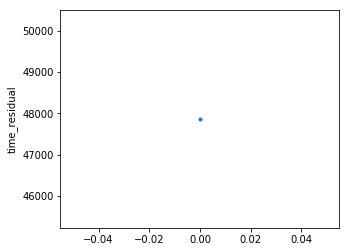

index_p 13
Jump Indices 10993 10994
1


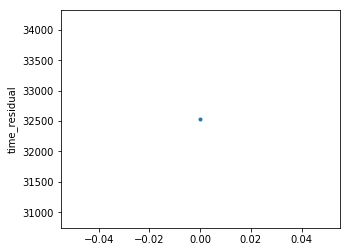

index_p 14
Jump Indices 10994 10995
1


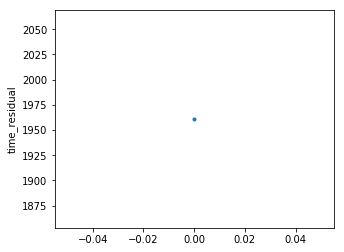

index_p 15
Jump Indices 10995 10996
1


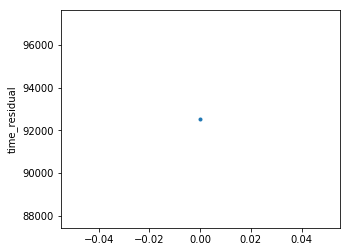

index_p 16
Jump Indices 10996 10997
1


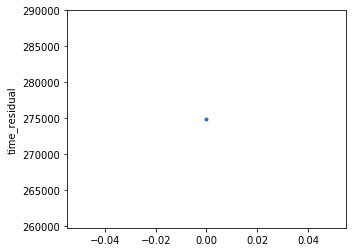

index_p 17
Jump Indices 10997 10998
1


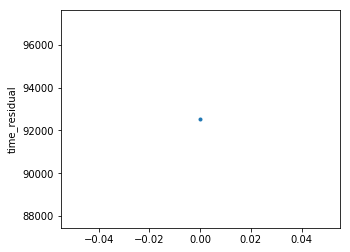

index_p 18
Jump Indices 10998 10999
1


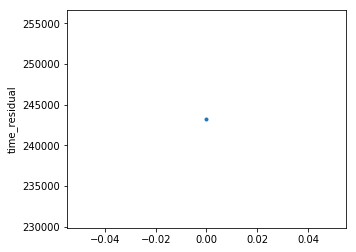

index_p 19
Jump Indices 10999 11000
1


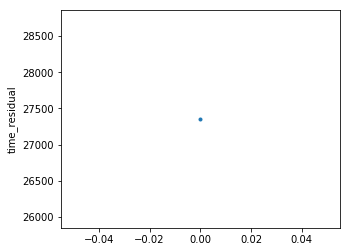

index_p 20
Jump Indices 11000 11002
2
400100.6686115265


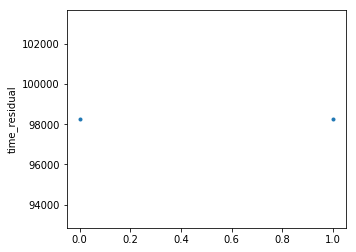

index_p 21
Jump Indices 11002 11003
1


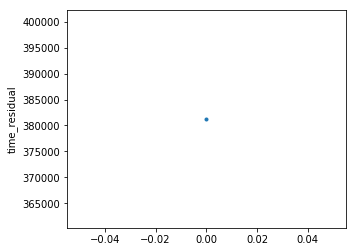

index_p 22
Jump Indices 11003 11004
1


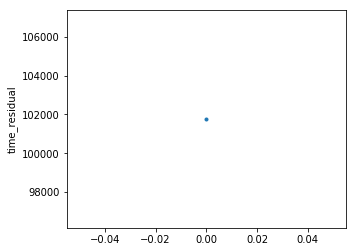

index_p 23
Jump Indices 11004 11005
1


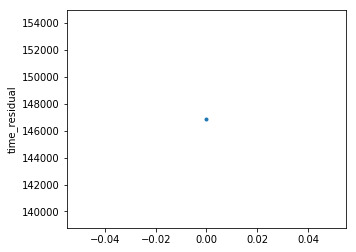

index_p 24
Jump Indices 11005 11006
1


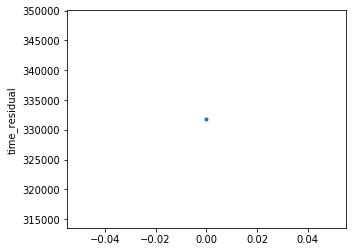

index_p 25
Jump Indices 11006 11009
3
400100.7325549962


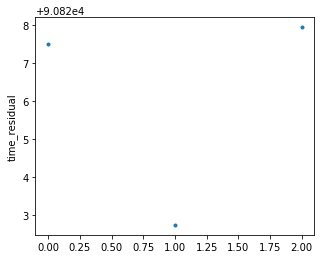

index_p 26
Jump Indices 11009 11012
3
400100.78843220137


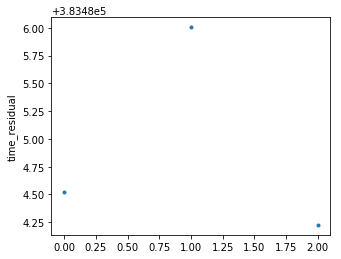

index_p 27
Jump Indices 11012 11577
565
400100.7206226794


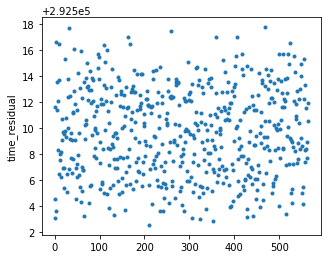

index_p 28
Jump Indices 11577 12076
499
400100.7204403967


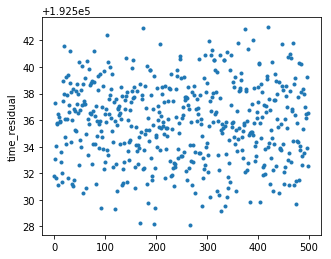

index_p 29
Jump Indices 12076 13344
1268
400100.7208022928


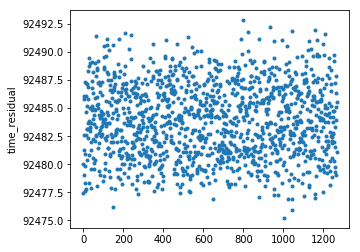

index_p 30
Jump Indices 13344 13345
1


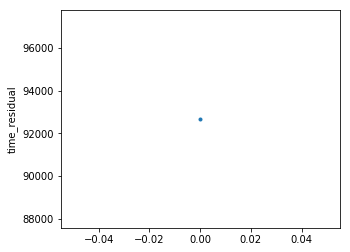

index_p 31
Jump Index size = 32 13345
[13345]
Jump Indices 13345 13345


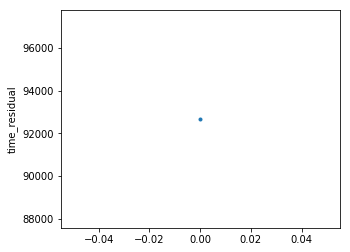

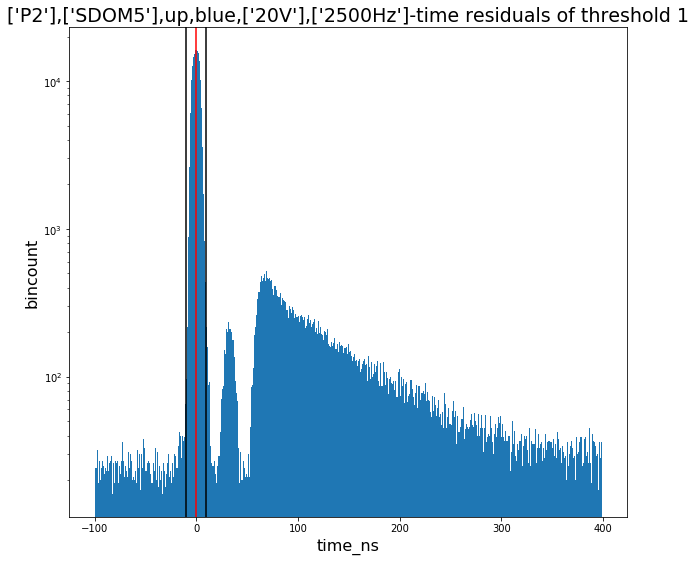

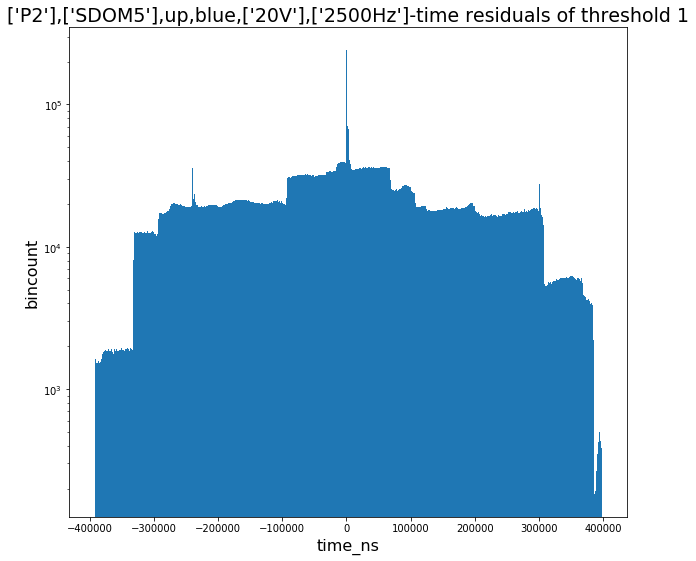

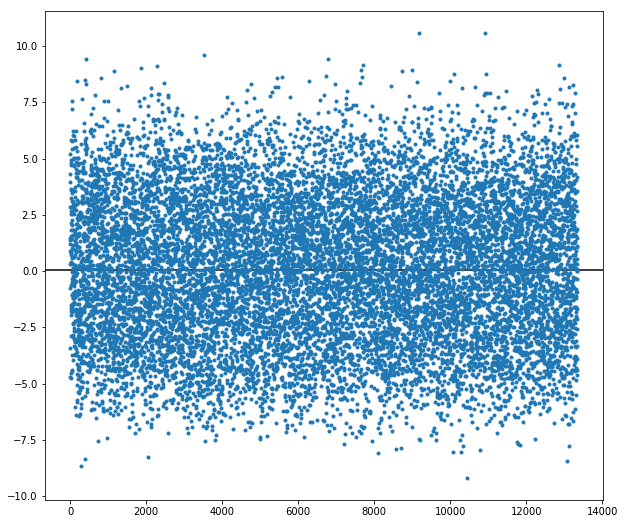

In [53]:
t_res_all2,  num_events2, noise_events2 = r2.res(gaus_peak, 250, 5)

# ---------------------------------------------------
# sDOM5 14V

In [14]:
b = clean.clean('20190426_082358_UTC_SDOM5_FLASH_POSEIDON1_P2_blue_both_2500Hz_14V_60s_19116082408.hld_up.hdf5')

percentage of high jumps in the file - 5.041885008442311


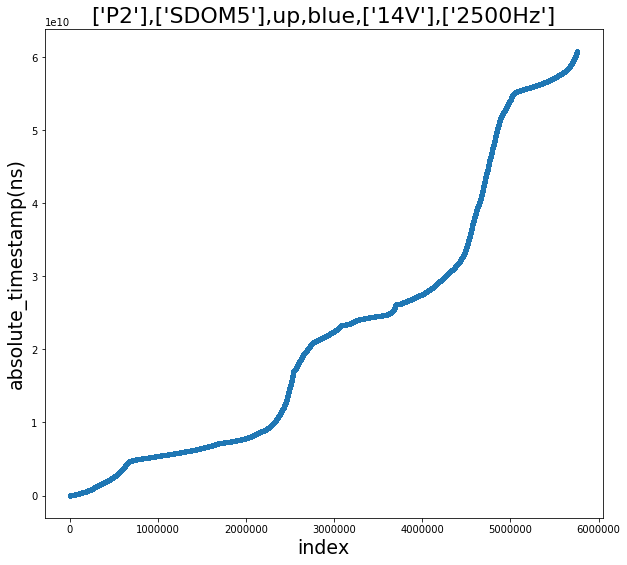

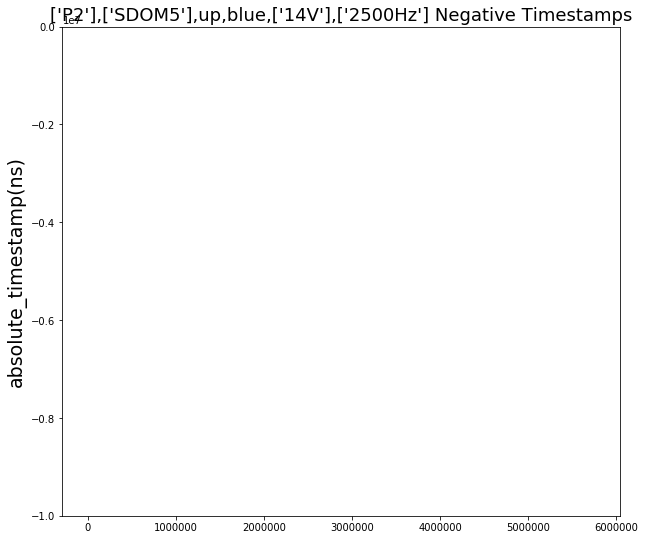

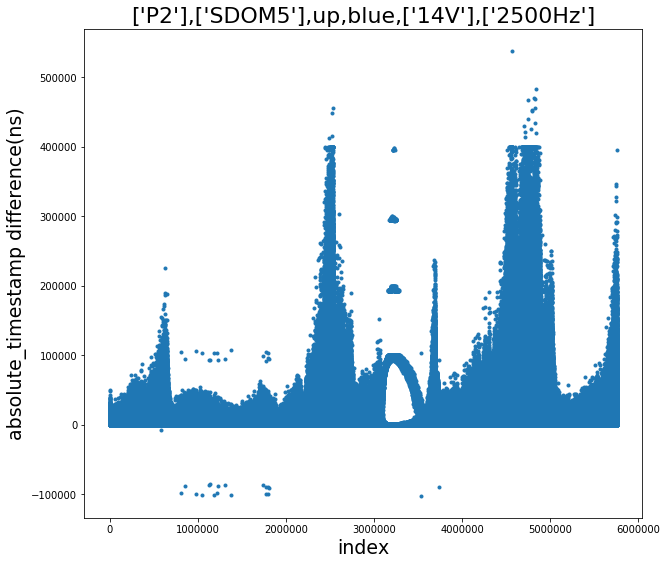

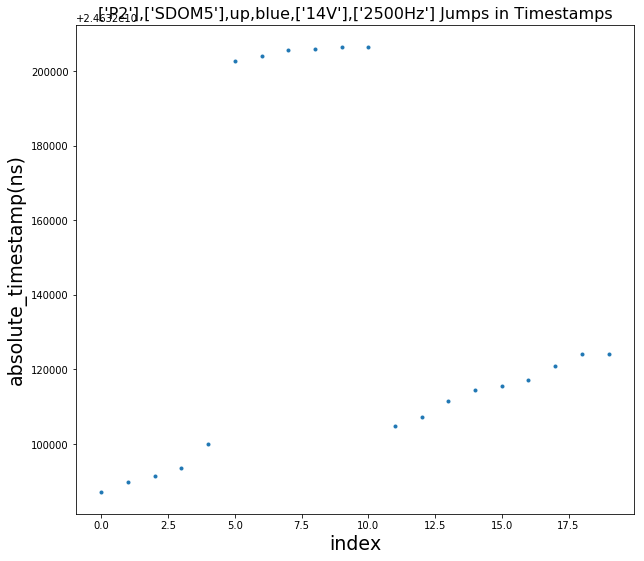

[ 585116.  585117.  585118.  585119.  585120.  585121.  815332.  815333.
  815334.  815335.  858064.  858065.  858066.  858067.  858068.  858069.
  858070.  975478. 1049189. 1049190. 1049191. 1049192. 1049193. 1049194.
 1133463. 1133464. 1133465. 1135853. 1135854. 1135855. 1135856. 1135857.
 1183378. 1183379. 1183380. 1183381. 1183382. 1220324. 1220325. 1220326.
 1231888. 1231889. 1231890. 1231891. 1231892. 1231893. 1231894. 1231895.
 1231896. 1231897. 1312101. 1312102. 1312103. 1380472. 1380473. 1738031.
 1738032. 1738033. 1738034. 1738035. 1738036. 1773348. 1773349. 1773350.
 1773351. 1773352. 1773353. 1773354. 1773355. 1774462. 1774463. 1774464.
 1774465. 1799551. 1799552. 1799553. 1799554. 1803848. 1803849. 1803850.
 1804723. 1804724. 1804725. 1804726. 1804727. 1804728. 3534981. 3534982.
 3534983. 3534984. 3534985. 3534986. 3735373. 3735374. 3735375. 3735376.]


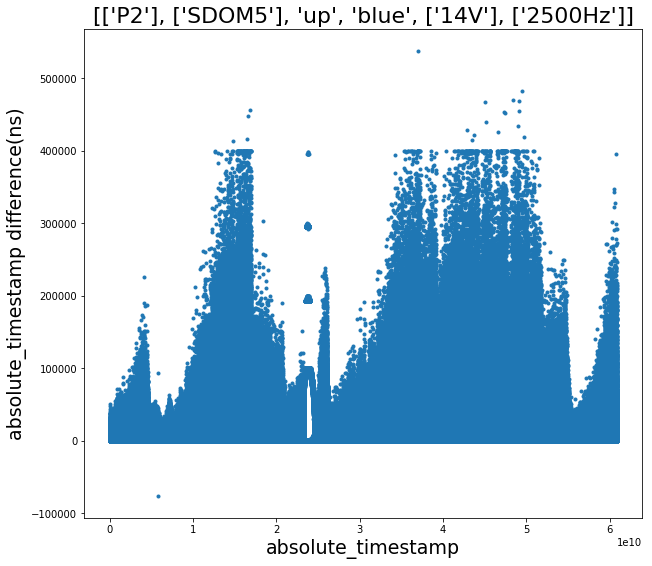

0.4006998777271621


In [15]:
(abs_elim_3, rising_0_elim_3, rising_1_elim_3, rising_2_elim_3, rising_3_elim_3,
 falling_0_elim_3, falling_1_elim_3, falling_2_elim_3, falling_3_elim_3, POCAM_num, values,
atstamp, p_jumps, dt_mean, f_r, file_path, SDOM_num, PMT,sub_time_elim_3,sub_id_elim_3) = b.P_S_used()

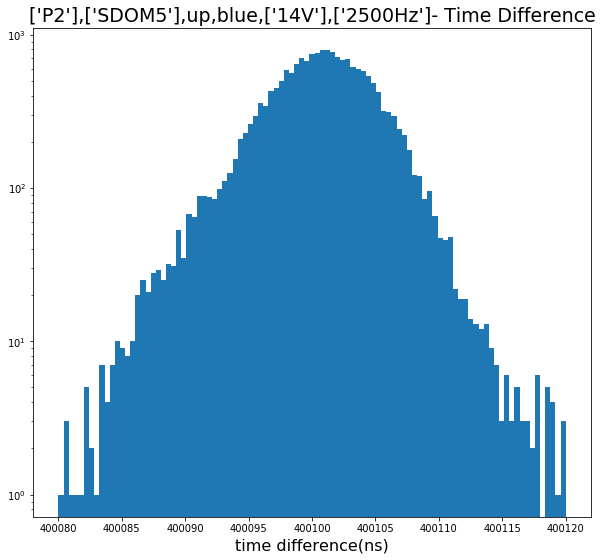

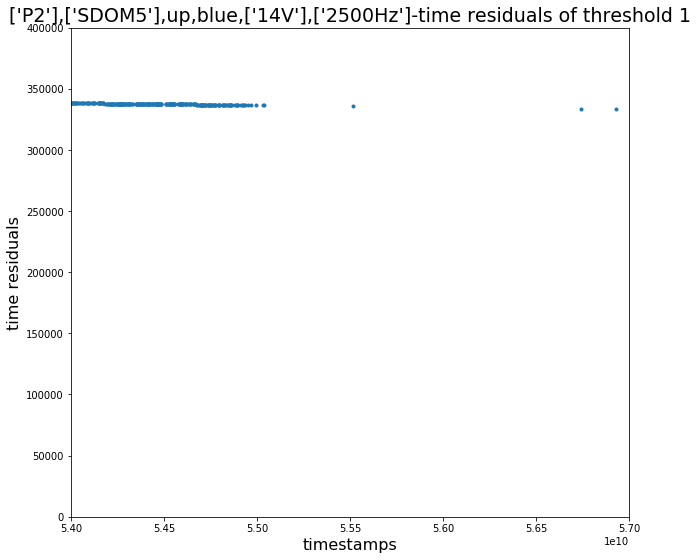

In [16]:
r2 = residual.residual(abs_elim_3,rising_1_elim_3,400080, 400120, 100, 
                                400095, 400115,
             5.4e10,5.7e10,0, 400000, file_path, values, POCAM_num, rising_0_elim_3,falling_0_elim_3)

17290
jump_index [0.0000e+00 7.0000e+00 9.0000e+00 9.0000e+01 2.1400e+02 2.1600e+02
 2.1700e+02 2.2400e+02 4.2000e+02 1.5280e+03 4.1680e+03 4.1690e+03
 4.1710e+03 4.1810e+03 4.2000e+03 4.2010e+03 4.4350e+03 4.4360e+03
 4.4380e+03 4.4390e+03 4.4440e+03 4.4820e+03 4.7590e+03 4.9110e+03
 5.9190e+03 6.0360e+03 7.7200e+03 8.2990e+03 1.5232e+04 1.6594e+04
 1.6595e+04 1.6596e+04 1.6597e+04 1.6600e+04 1.6613e+04]
jump_index size 35
index_p 0
Jump Indices 0 8
8
400100.68122492114


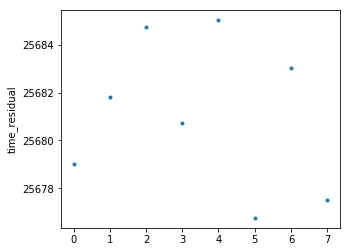

/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:719: RuntimeWarning: divide by zero encountered in true_divide
  transform = 1.0 / sigma
/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:785: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


index_p 1
Jump Indices 8 10
2
400100.61406251136


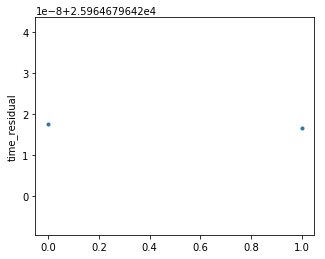

index_p 2
Jump Indices 10 91
81
400100.6782066167


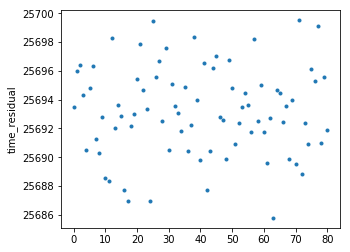

index_p 3
Jump Indices 91 215
124
400100.67795542243


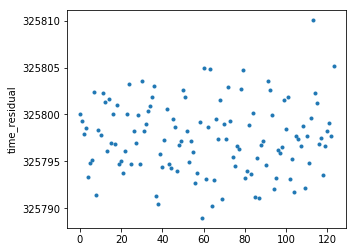

index_p 4
Jump Indices 215 217
2
400100.6645103959


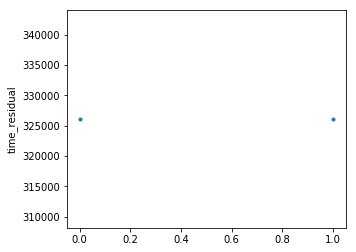

index_p 5
Jump Indices 217 218
1
400102.58792896156


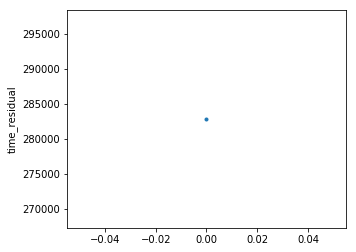

index_p 6
Jump Indices 218 225
7
400100.6563539469


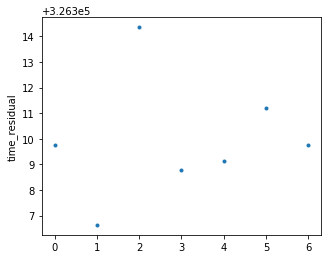

index_p 7
Jump Indices 225 421
196
400100.6789789006


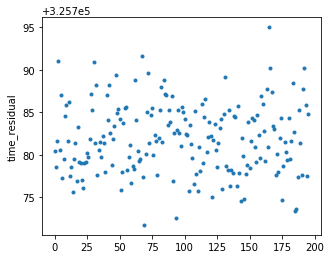

index_p 8
Jump Indices 421 1529
1108
400100.6785911081


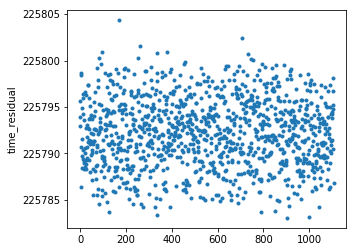

index_p 9
Jump Indices 1529 4169
2640
400100.6786775533


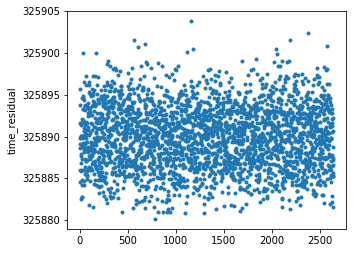

index_p 10
Jump Indices 4169 4170
1
400102.58792896156


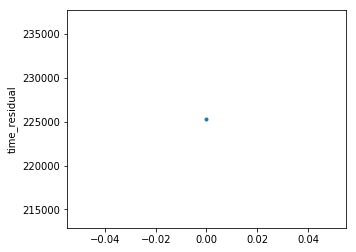

index_p 11
Jump Indices 4170 4172
2
400100.7114843852


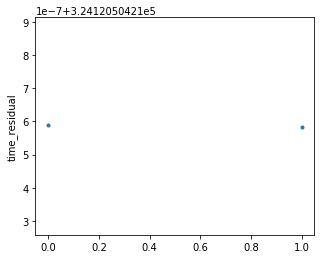

index_p 12
Jump Indices 4172 4182
10
400100.6750578078


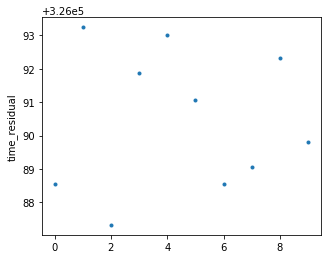

index_p 13
Jump Indices 4182 4201
19
400100.6770448032


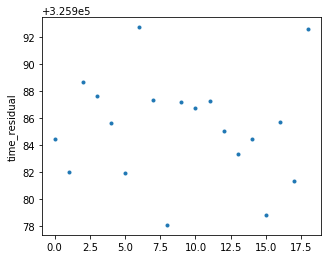

index_p 14
Jump Indices 4201 4202
1
400102.58792896156


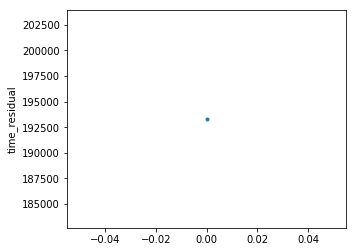

index_p 15
Jump Indices 4202 4436
234
400100.67886269063


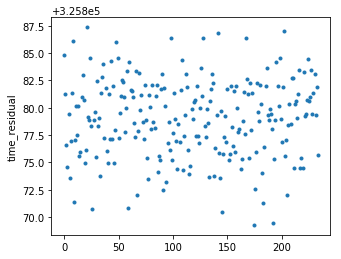

index_p 16
Jump Indices 4436 4437
1
400102.58792896156


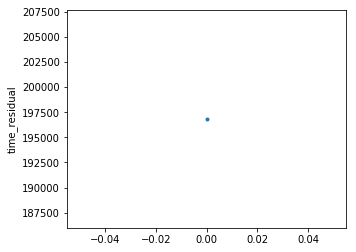

index_p 17
Jump Indices 4437 4439
2
400100.779609375


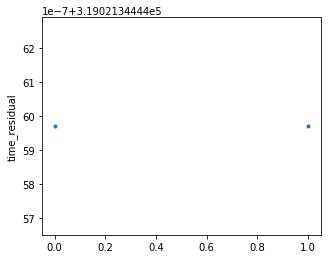

index_p 18
Jump Indices 4439 4440
1
400102.58792896156


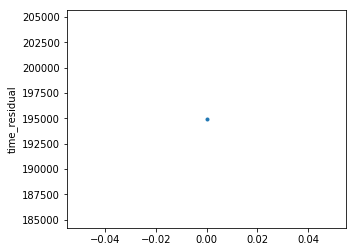

index_p 19
Jump Indices 4440 4445
5
400100.65061146364


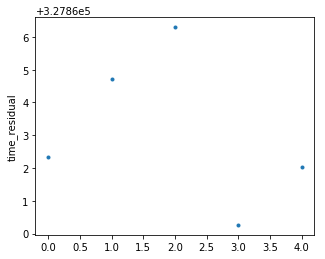

index_p 20
Jump Indices 4445 4483
38
400100.67872469267


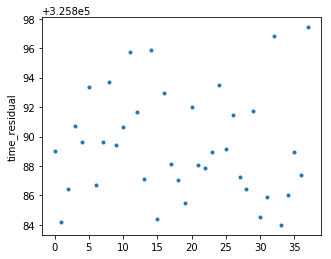

index_p 21
Jump Indices 4483 4760
277
400100.67875214445


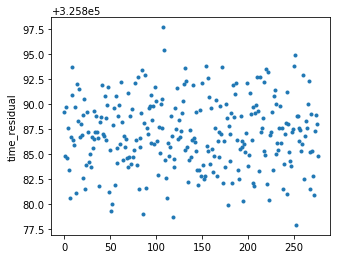

index_p 22
Jump Indices 4760 4912
152
400100.6788043078


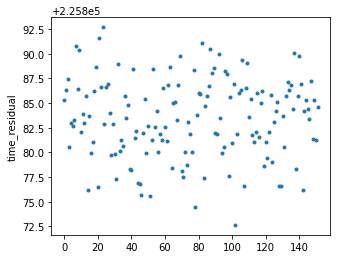

index_p 23
Jump Indices 4912 5920
1008
400100.6787533762


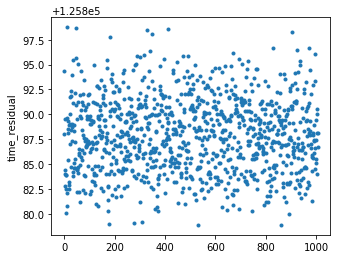

index_p 24
Jump Indices 5920 6037
117
400100.68059015385


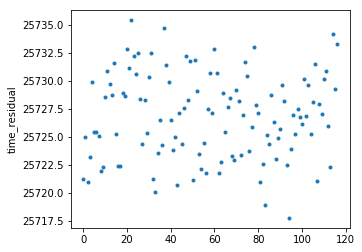

index_p 25
Jump Indices 6037 7721
1684
400100.6788527743


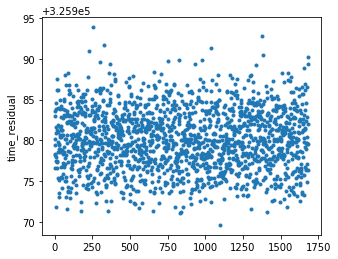

index_p 26
Jump Indices 7721 8300
579
400100.67861313635


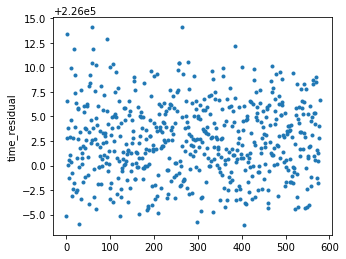

index_p 27
Jump Indices 8300 15233
6933
400100.6788945106


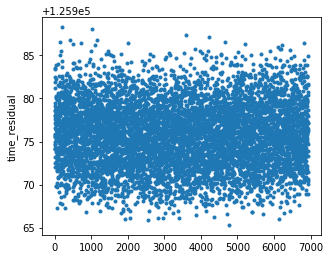

index_p 28
Jump Indices 15233 16595
1362
400100.6789847694


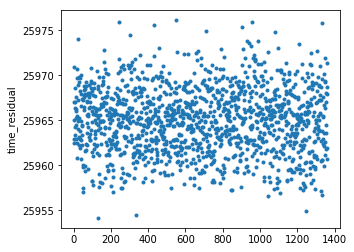

index_p 29
Jump Indices 16595 16596
1
400102.58792896156


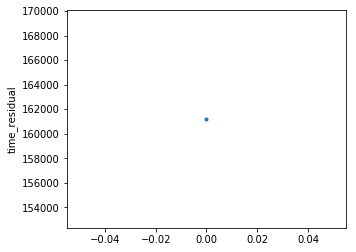

index_p 30
Jump Indices 16596 16597
1
400102.58792896156


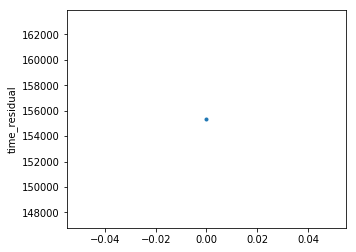

index_p 31
Jump Indices 16597 16598
1
400102.58792896156


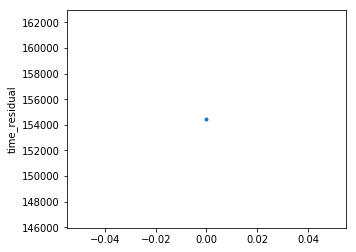

index_p 32
Jump Indices 16598 16601
3
400100.6809531207


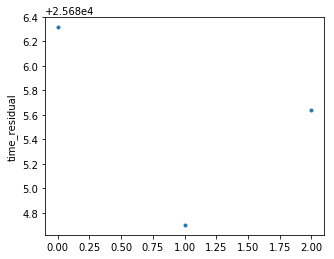

index_p 33
Jump Indices 16601 16614
13
400100.67621034547


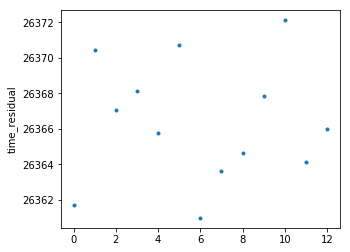

index_p 34
Jump Index size = 35 17289
[16614]
Jump Indices 16614 17289
400100.6788518523


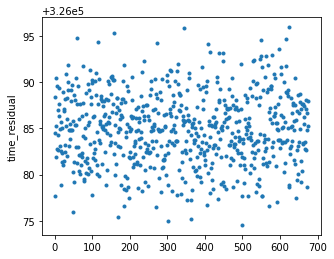

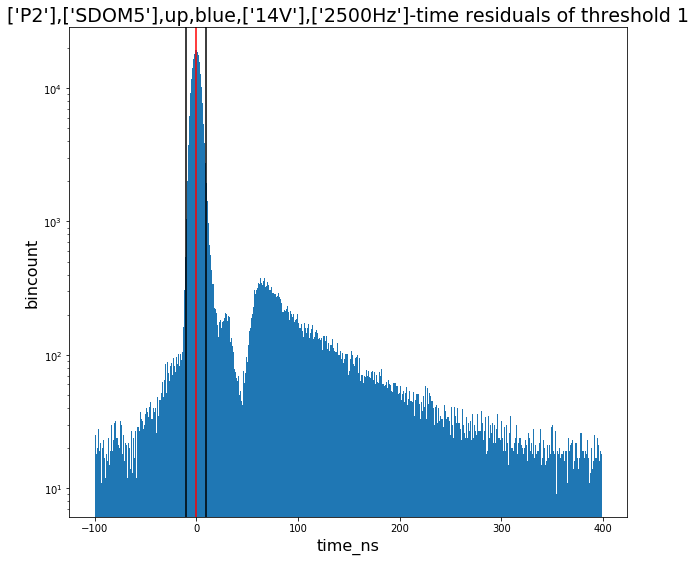

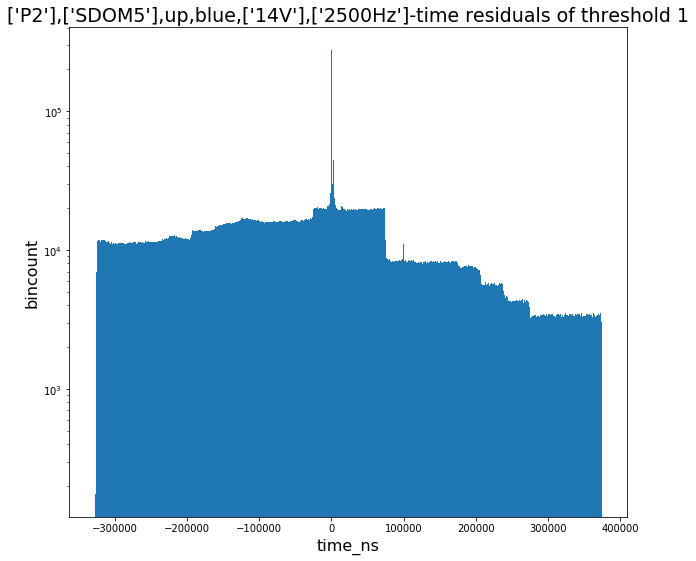

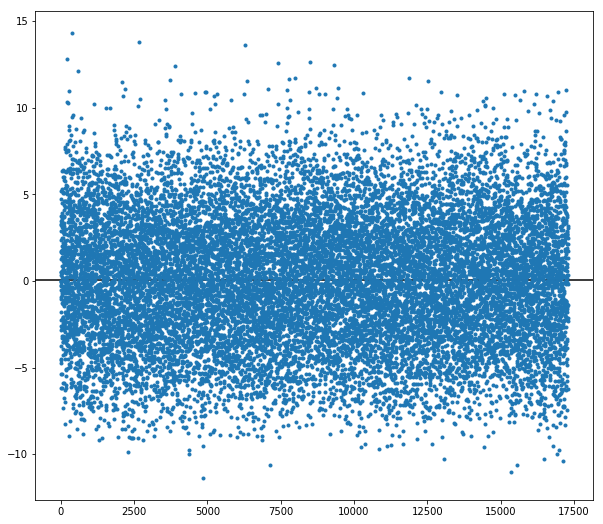

In [17]:
t_res_all2,  num_events2, noise_events2 = r2.res(gaus_peak, 250, 5)

# ---------------------------------------------------
# sDOM5 12V

In [159]:
b = clean.clean('20190426_081109_UTC_SDOM5_FLASH_POSEIDON1_P2_blue_both_2500Hz_12V_60s_19116081119.hld_up.hdf5')

percentage of high jumps in the file - 0.0


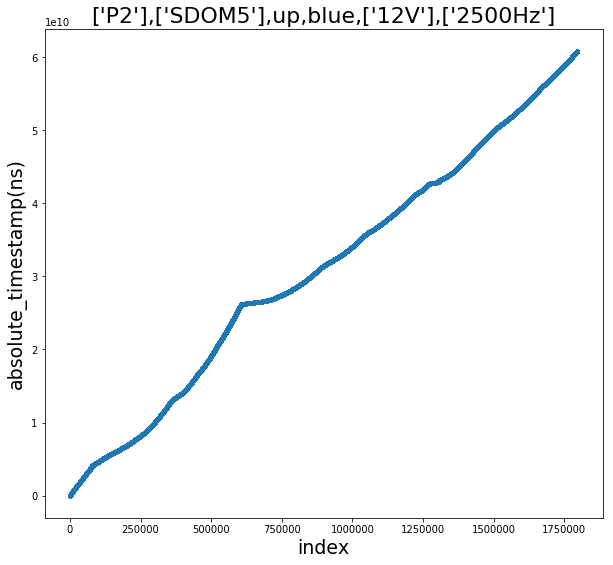

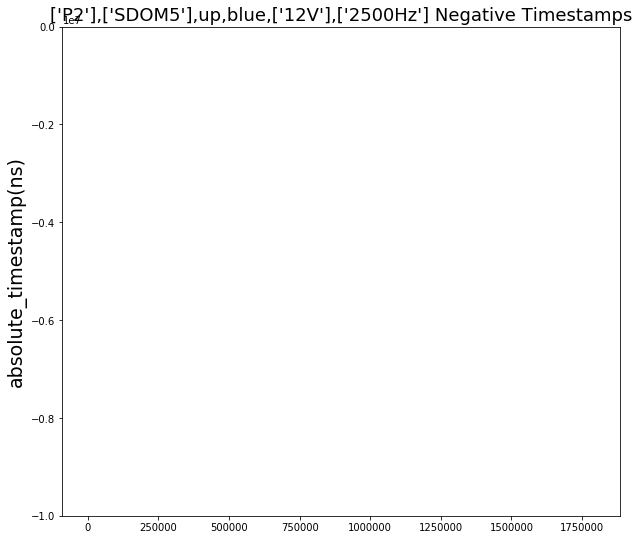

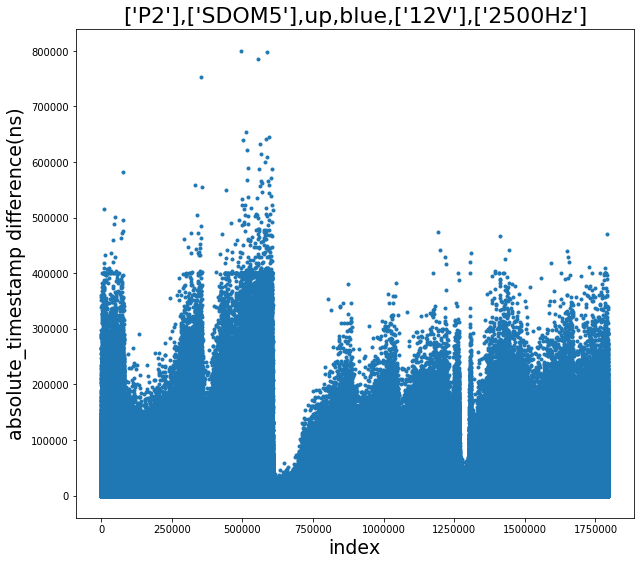

[]


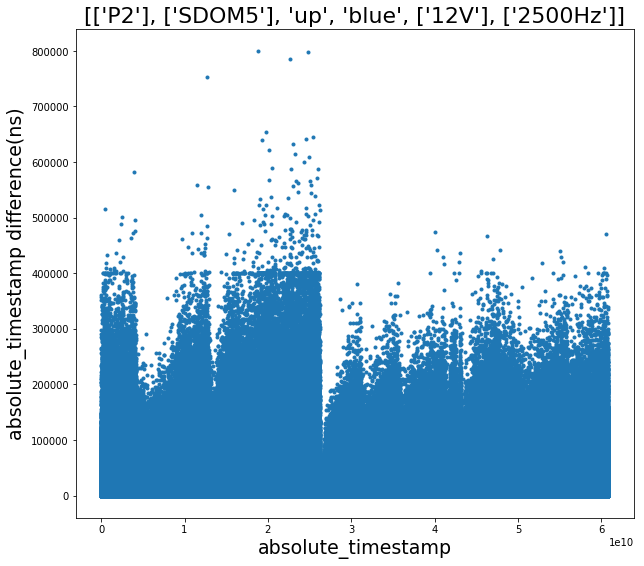

0.31749276787893715


In [161]:
(abs_elim_3, rising_0_elim_3, rising_1_elim_3, rising_2_elim_3, rising_3_elim_3,
 falling_0_elim_3, falling_1_elim_3, falling_2_elim_3, falling_3_elim_3, POCAM_num, values,
atstamp, p_jumps, dt_mean, f_r, file_path, SDOM_num, PMT,sub_time_elim_3,sub_id_elim_3) = b.P_S_used()

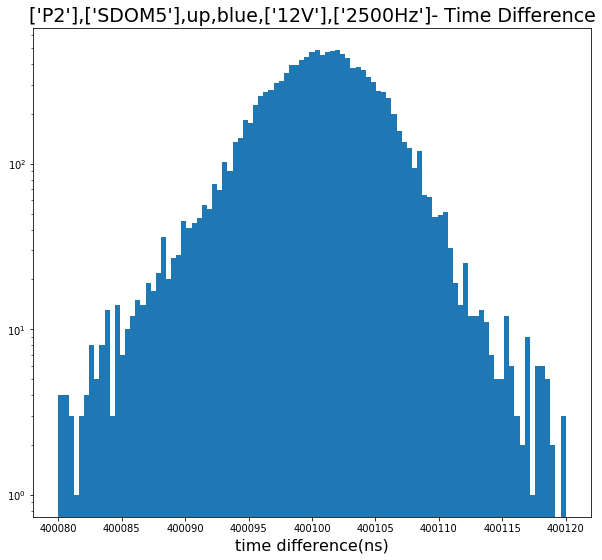

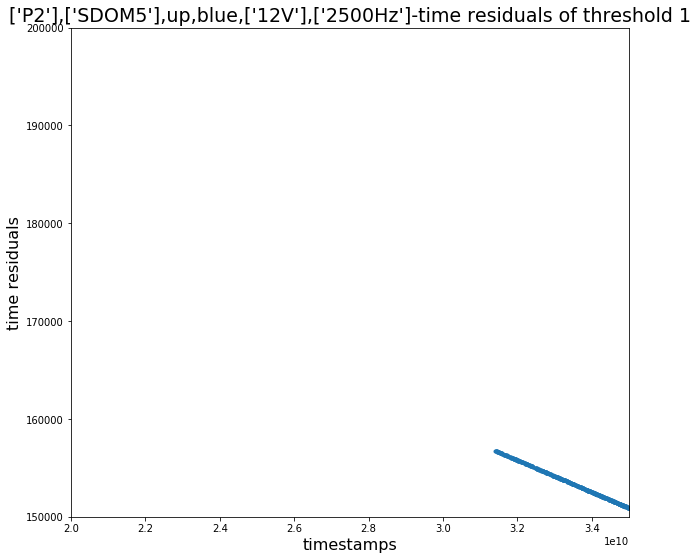

In [41]:
r2 = residual.residual(abs_elim_3,rising_1_elim_3,400080, 400120, 100, 
                                400095, 400115,
             2.0e10,3.5e10,150000, 200000, file_path, values, POCAM_num, rising_0_elim_3,falling_0_elim_3)

11417
jump_index [    0.   470.  1538.  4035.  4036.  5695.  5788.  6010.  6011.  6429.
  7187.  8227.  8273.  8904. 10200. 10544. 10811. 11187.]
jump_index size 18
index_p 0
Jump Indices 0 471
471
400100.6787957508


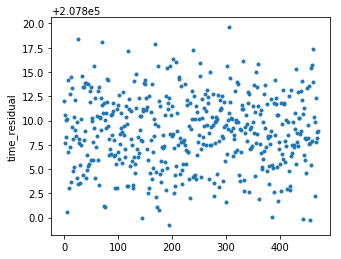

index_p 1
Jump Indices 471 1539
1068
400100.6783869064


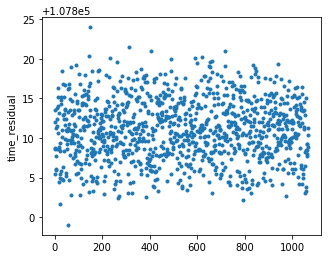

index_p 2
Jump Indices 1539 4036
2497
400100.678328504


/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:719: RuntimeWarning: divide by zero encountered in true_divide
  transform = 1.0 / sigma
/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:785: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


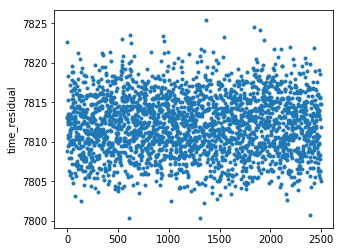

index_p 3
Jump Indices 4036 4037
1
400102.58792896156


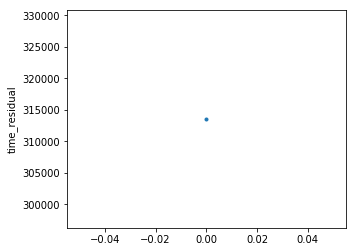

index_p 4
Jump Indices 4037 5696
1659
400100.67822558613


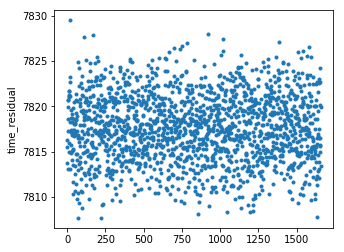

index_p 5
Jump Indices 5696 5789
93
400100.675039891


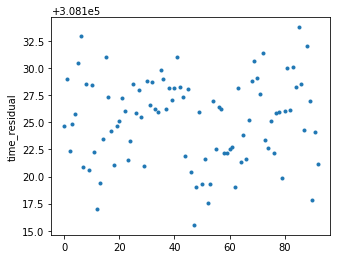

index_p 6
Jump Indices 5789 6011
222
400100.67812070565


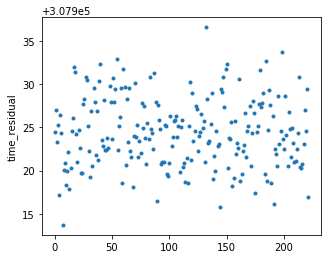

index_p 7
Jump Indices 6011 6012
1
400102.58792896156


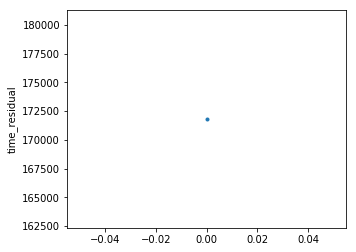

index_p 8
Jump Indices 6012 6430
418
400100.6780692767


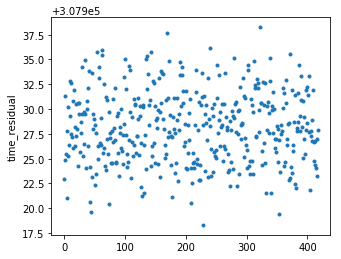

index_p 9
Jump Indices 6430 7188
758
400100.6780699545


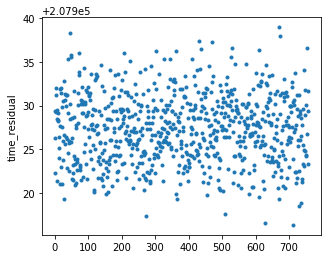

index_p 10
Jump Indices 7188 8228
1040
400100.67794634163


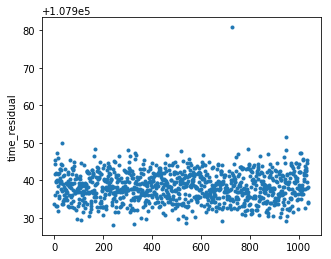

index_p 11
Jump Indices 8228 8274
46
400100.67857429036


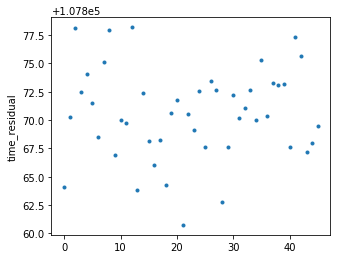

index_p 12
Jump Indices 8274 8905
631
400100.67798855086


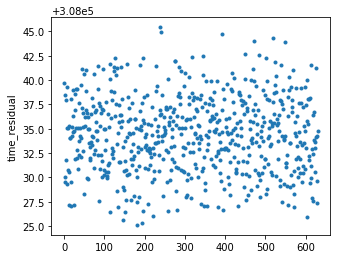

index_p 13
Jump Indices 8905 10201
1296
400100.6778349835


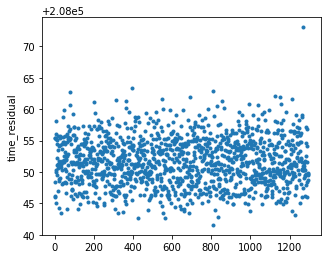

index_p 14
Jump Indices 10201 10545
344
400100.6774935502


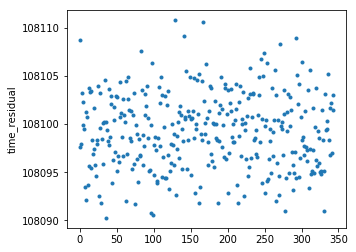

index_p 15
Jump Indices 10545 10812
267
400100.67774789623


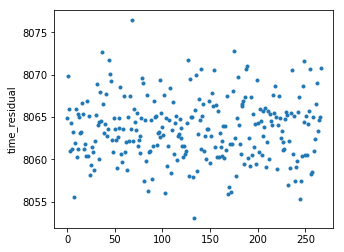

index_p 16
Jump Indices 10812 11188
376
400100.67784764216


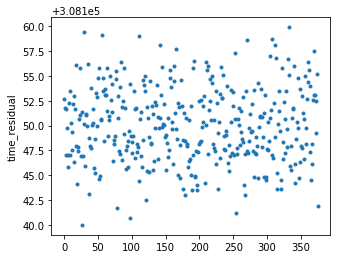

index_p 17
Jump Index size = 18 11416
[11188]
Jump Indices 11188 11416
400100.67801270646


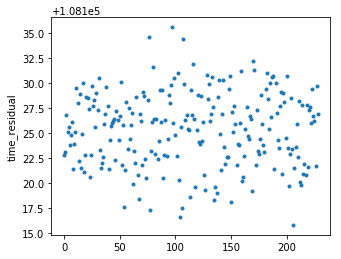

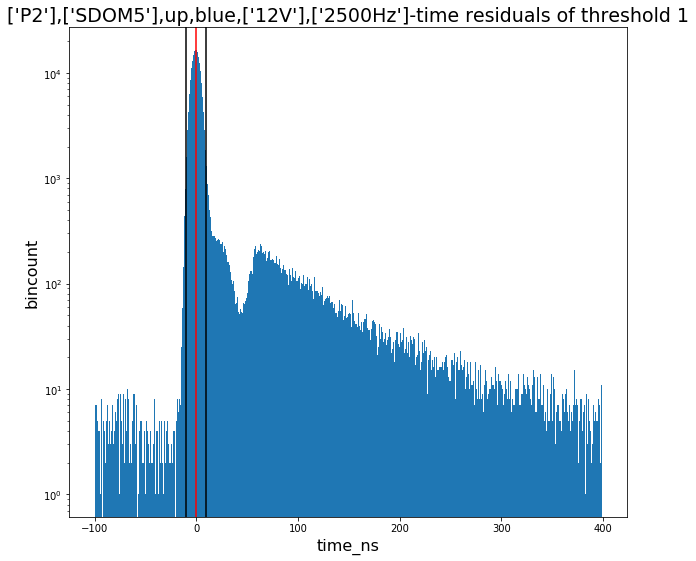

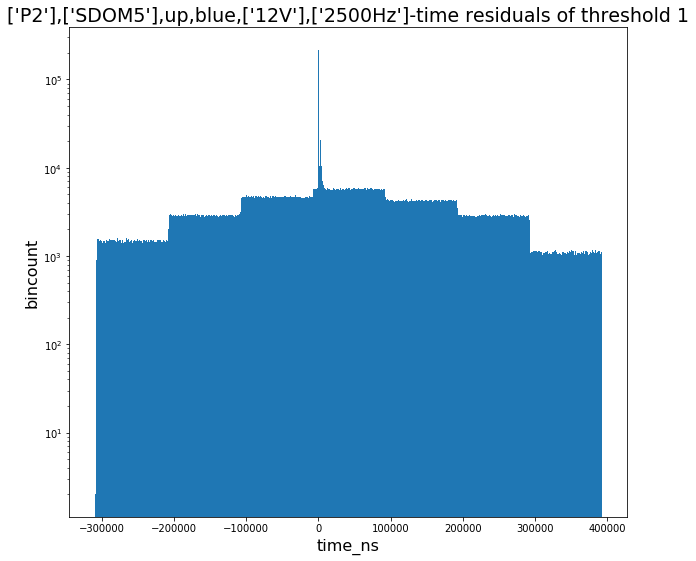

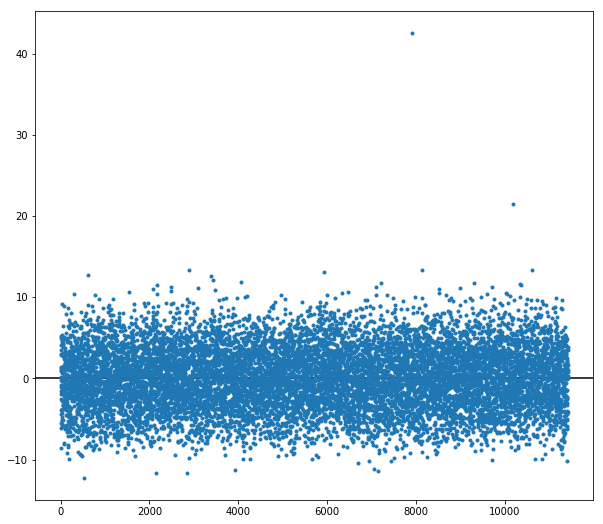

In [42]:
t_res_all2,  num_events2, noise_events2 = r2.res(gaus_peak, 250, 5)

In [162]:
sDOM5_POSEIDON_run = run.run()
run_time, err_run_time, dead_time_uncert = sDOM5_POSEIDON_run.run_time(atstamp, p_jumps, dt_mean, b.f_0,
                                                    b.f_1-b.r_1,
                                                    b.f_2-b.r_2,
                                                    b.f_3-b.r_3)

print('dead_time_uncert: ', dead_time_uncert, '%')

timestamp of the last event -  60857790035.703125
eliminating high jumps and summing -  60852696425.18751
run time -  60852696425.18751
dead_time_uncert:  0.0 %


# ---------------------------------------------------
# sDOM5 10V

In [18]:
b = clean.clean('20190426_075820_UTC_SDOM5_FLASH_POSEIDON1_P2_blue_both_2500Hz_10V_60s_19116075831.hld_up.hdf5')

percentage of high jumps in the file - 5.484581090196332


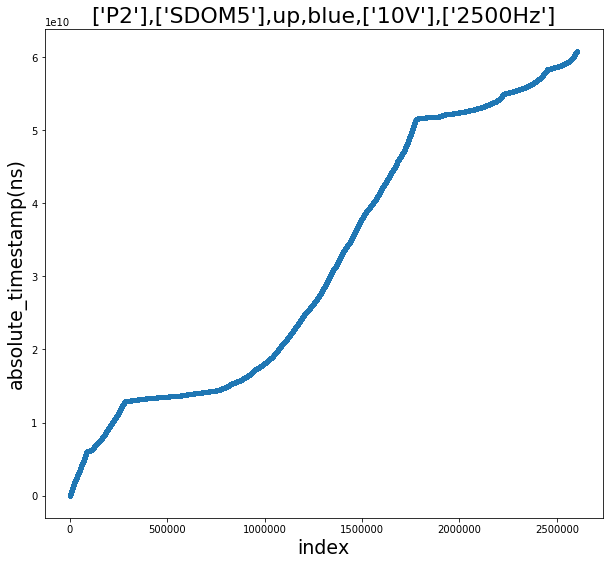

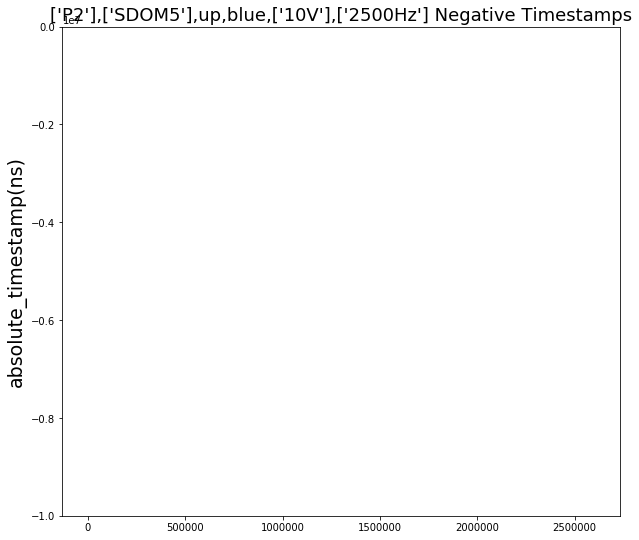

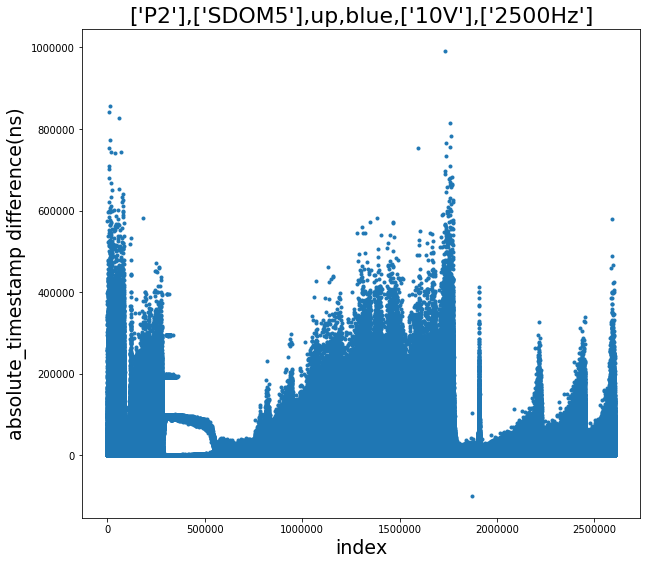

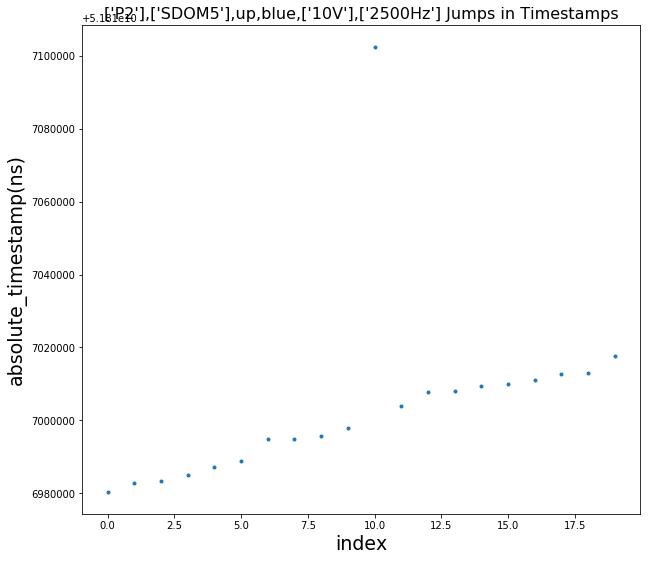

[1872465.]


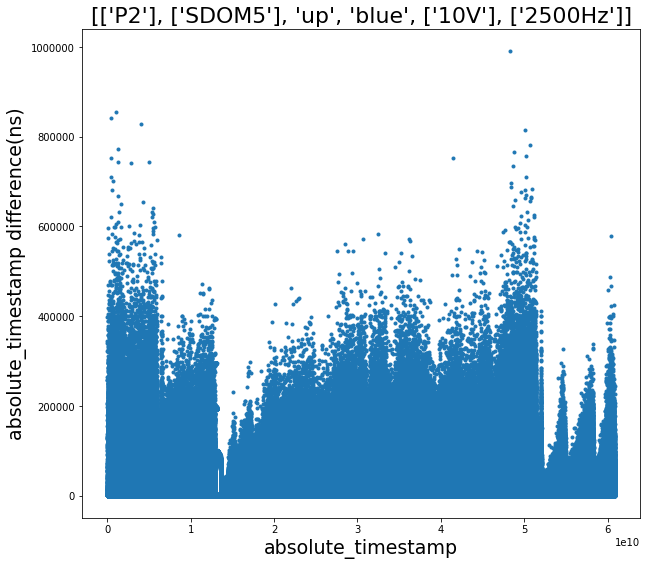

0.2502365932723996


In [19]:
(abs_elim_3, rising_0_elim_3, rising_1_elim_3, rising_2_elim_3, rising_3_elim_3,
 falling_0_elim_3, falling_1_elim_3, falling_2_elim_3, falling_3_elim_3, POCAM_num, values,
atstamp, p_jumps, dt_mean, f_r, file_path, SDOM_num, PMT,sub_time_elim_3,sub_id_elim_3) = b.P_S_used()

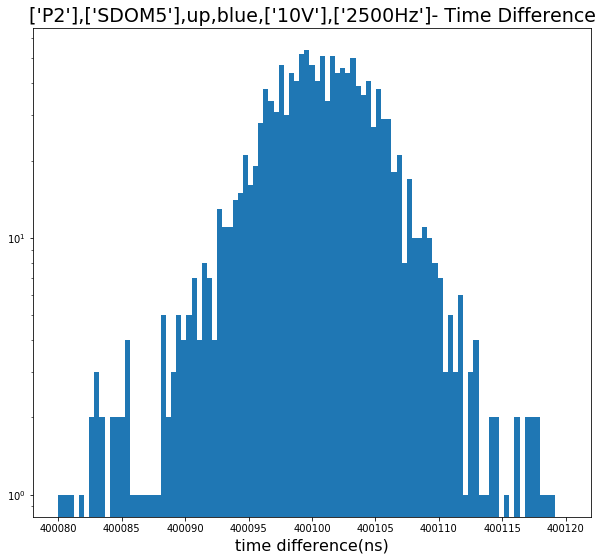

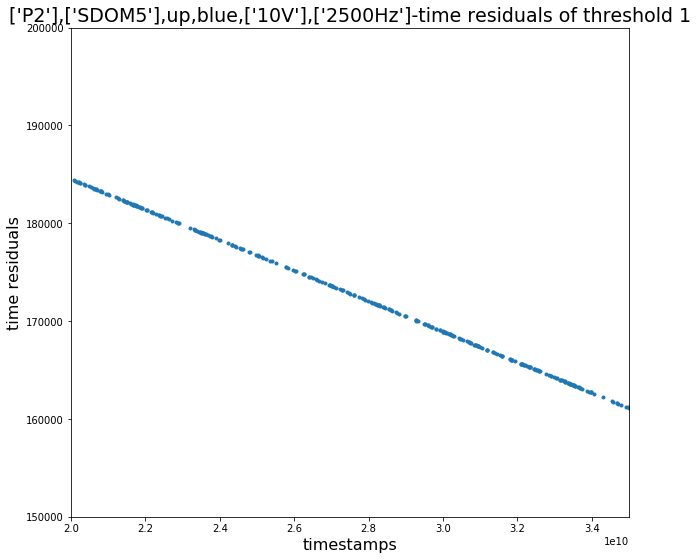

In [34]:
r2 = residual.residual(abs_elim_3,rising_1_elim_3,400080, 400120, 100, 
                                400095, 400115,
             2.0e10,3.5e10,150000, 200000, file_path, values, POCAM_num, rising_0_elim_3,falling_0_elim_3)

1229
jump_index [   0.  177.  181.  182.  186.  187.  188.  203.  215.  247.  257.  307.
  314.  315.  316.  319.  320.  321.  322.  334.  335.  336.  338.  341.
  342.  343.  347.  350.  352.  361.  387.  435.  459.  469.  471.  481.
  487.  548.  610.  617.  641.  681.  682.  746.  755.  800.  803.  829.
  831.  832.  858.  927.  959.  981. 1031. 1143. 1147. 1149. 1153. 1163.
 1164. 1165. 1167. 1171. 1175. 1200. 1201. 1202. 1220. 1224.]
jump_index size 70
index_p 0
Jump Indices 0 178
178
400100.70808041474


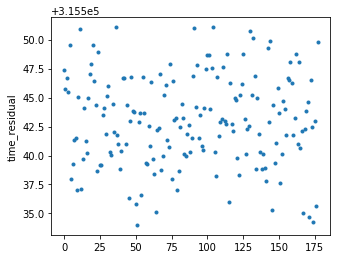

/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:719: RuntimeWarning: divide by zero encountered in true_divide
  transform = 1.0 / sigma
/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:785: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


index_p 1
Jump Indices 178 182
4
400100.7040226437


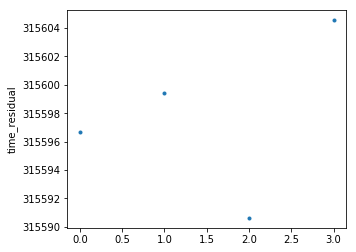

index_p 2
Jump Indices 182 183
1
400102.58792896156


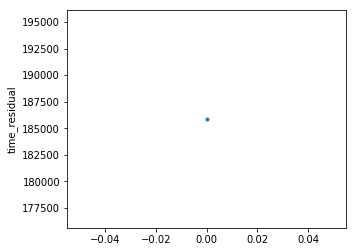

index_p 3
Jump Indices 183 187
4
400100.6897908122


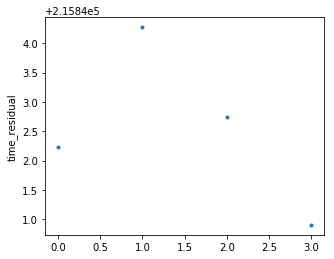

index_p 4
Jump Indices 187 188
1
400102.58792896156


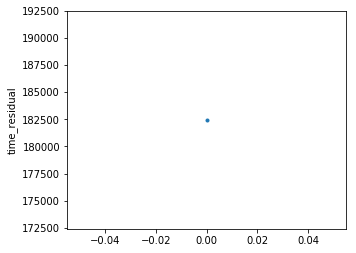

index_p 5
Jump Indices 188 189
1
400102.58792896156


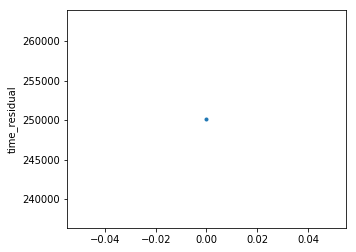

index_p 6
Jump Indices 189 204
15
400100.70849969354


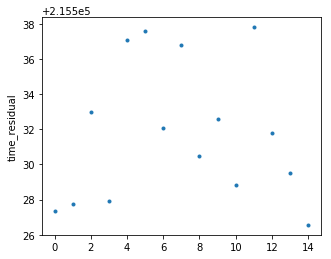

index_p 7
Jump Indices 204 216
12
400100.7097190014


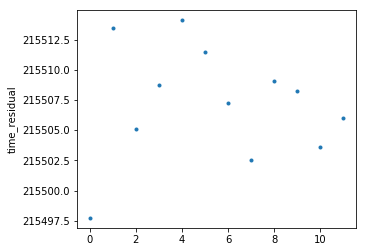

index_p 8
Jump Indices 216 248
32
400100.70767152135


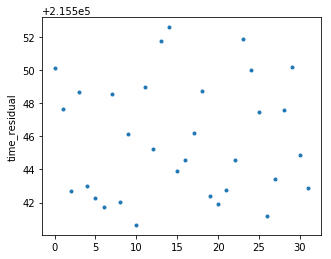

index_p 9
Jump Indices 248 258
10
400100.7048888046


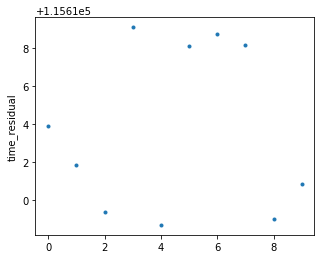

index_p 10
Jump Indices 258 308
50
400100.708162861


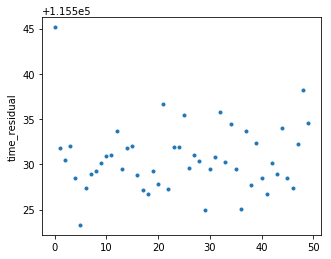

index_p 11
Jump Indices 308 315
7
400100.7103153758


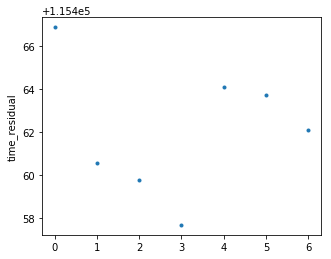

index_p 12
Jump Indices 315 316
1
400102.58792896156


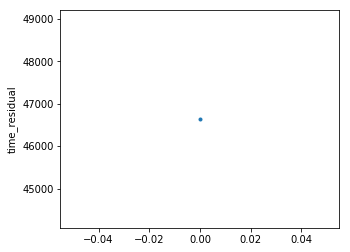

index_p 13
Jump Indices 316 317
1
400102.58792896156


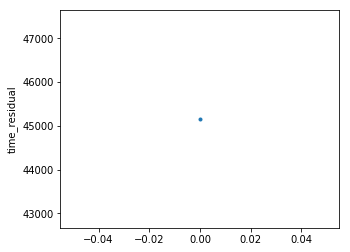

index_p 14
Jump Indices 317 320
3
400100.70084997255


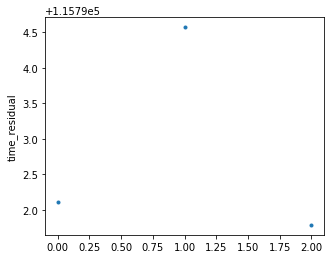

index_p 15
Jump Indices 320 321
1
400102.58792896156


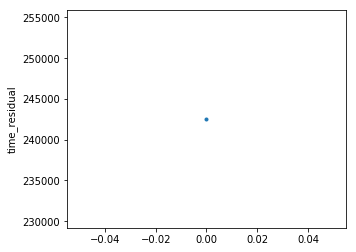

index_p 16
Jump Indices 321 322
1
400102.58792896156


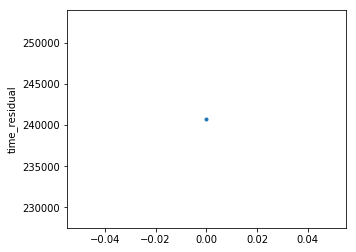

index_p 17
Jump Indices 322 323
1
400102.58792896156


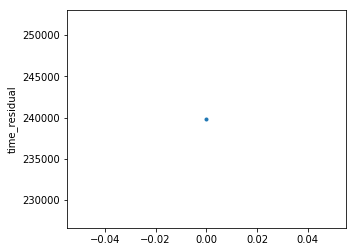

index_p 18
Jump Indices 323 335
12
400100.70645673433


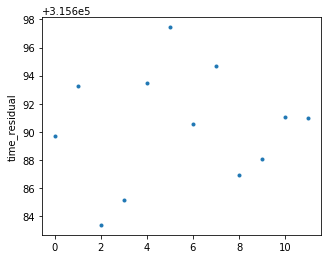

index_p 19
Jump Indices 335 336
1
400102.58792896156


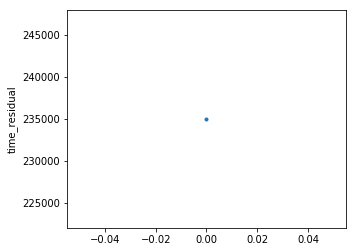

index_p 20
Jump Indices 336 337
1
400102.58792896156


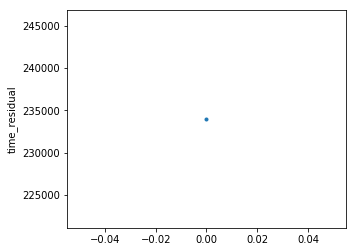

index_p 21
Jump Indices 337 339
2
400100.65364595444


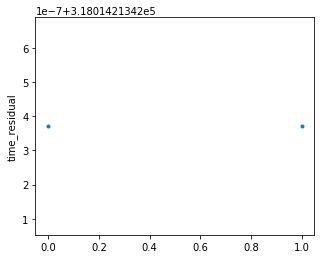

index_p 22
Jump Indices 339 342
3
400100.7023817755


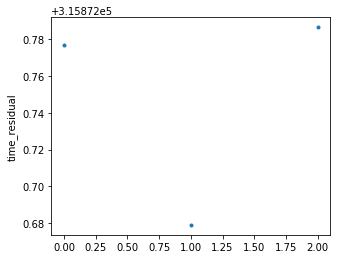

index_p 23
Jump Indices 342 343
1
400102.58792896156


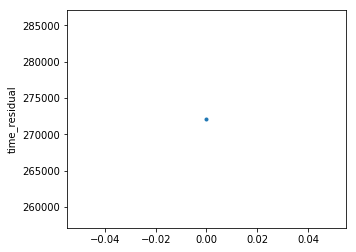

index_p 24
Jump Indices 343 344
1
400102.58792896156


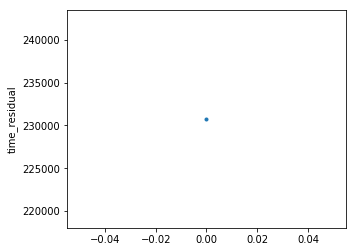

index_p 25
Jump Indices 344 348
4
400100.7194526386


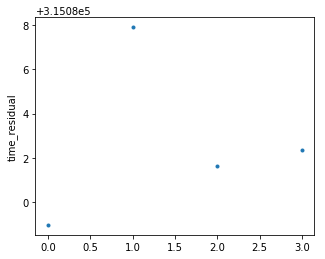

index_p 26
Jump Indices 348 351
3
400100.7151058032


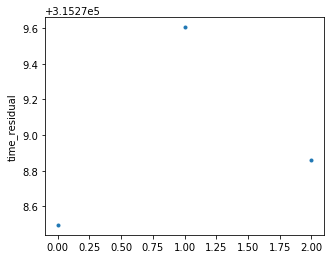

index_p 27
Jump Indices 351 353
2
400100.3985939026


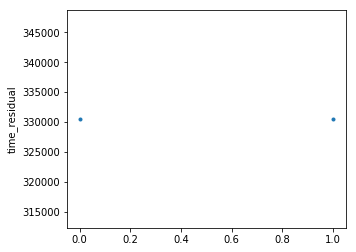

index_p 28
Jump Indices 353 362
9
400100.7103923682


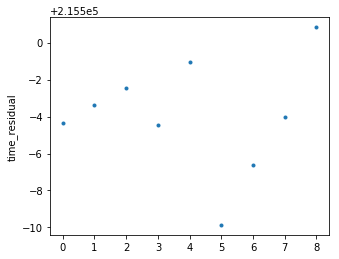

continue
index_p 30
Jump Indices 388 436
48
400100.70697759796


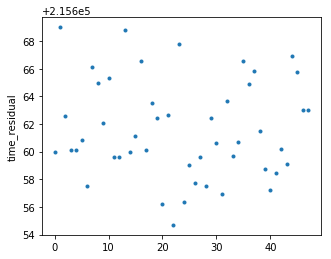

index_p 31
Jump Indices 436 460
24
400100.705840528


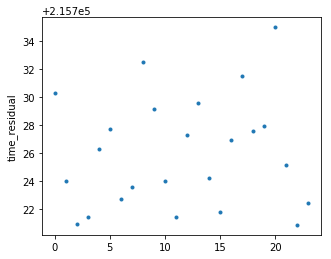

index_p 32
Jump Indices 460 470
10
400100.7132246009


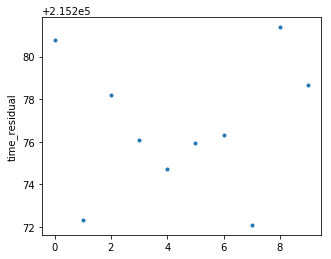

index_p 33
Jump Indices 470 472
2
400100.46531700366


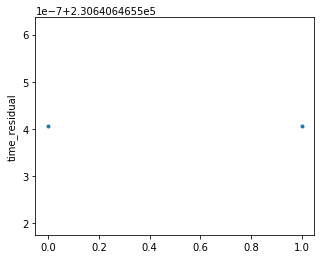

index_p 34
Jump Indices 472 482
10
400100.7042865555


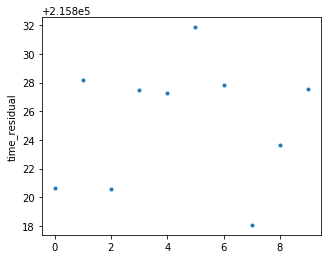

index_p 35
Jump Indices 482 488
6
400100.70147843094


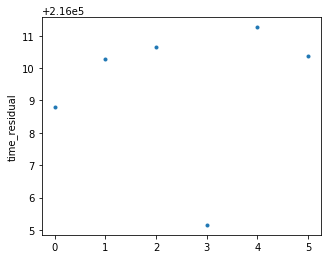

index_p 36
Jump Indices 488 549
61
400100.7057027409


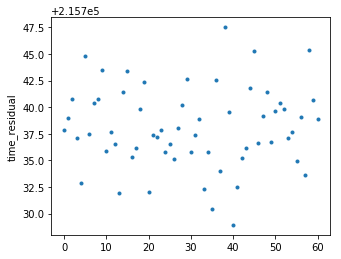

index_p 37
Jump Indices 549 611
62
400100.70554763515


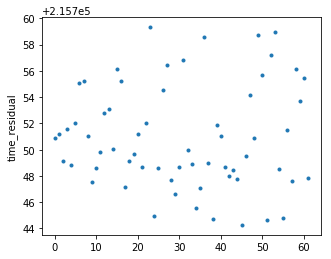

index_p 38
Jump Indices 611 618
7
400100.69944272615


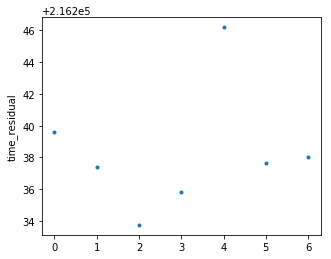

index_p 39
Jump Indices 618 642
24
400100.7088962468


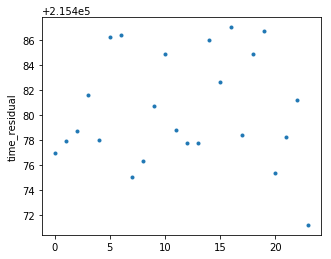

index_p 40
Jump Indices 642 682
40
400100.70553685114


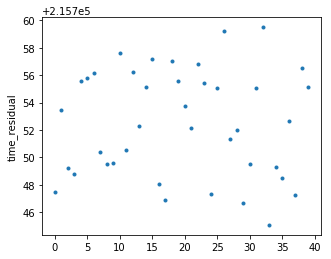

index_p 41
Jump Indices 682 683
1
400102.58792896156


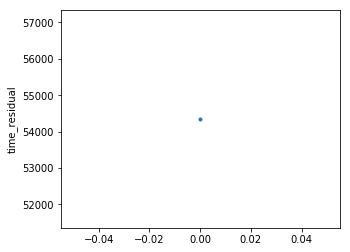

index_p 42
Jump Indices 683 747
64
400100.70615955506


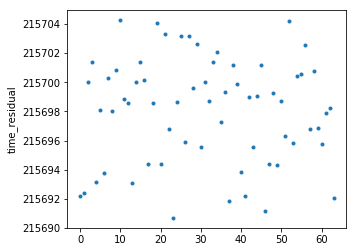

index_p 43
Jump Indices 747 756
9
400100.7003397486


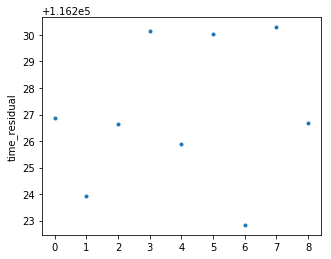

index_p 44
Jump Indices 756 801
45
400100.7057351838


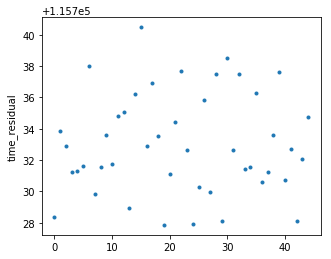

index_p 45
Jump Indices 801 804
3
400100.69672537554


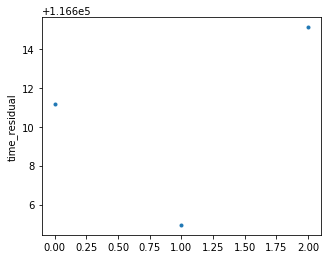

index_p 46
Jump Indices 804 830
26
400100.7048050669


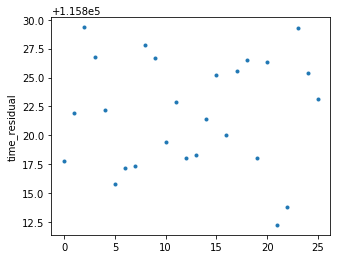

index_p 47
Jump Indices 830 832
2
400100.69420855975


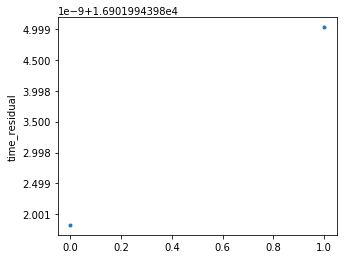

index_p 48
Jump Indices 832 833
1
400102.58792896156


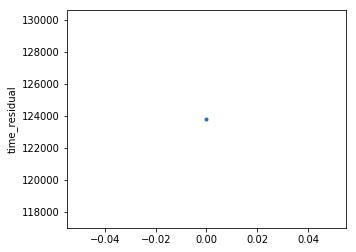

index_p 49
Jump Indices 833 859
26
400100.7050519944


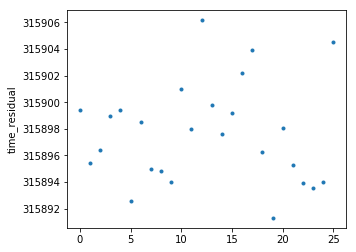

index_p 50
Jump Indices 859 928
69
400100.7046041556


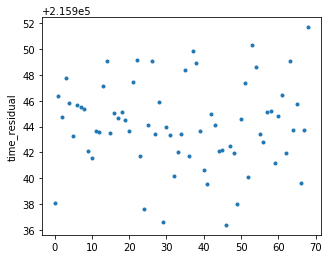

index_p 51
Jump Indices 928 960
32
400100.7070952221


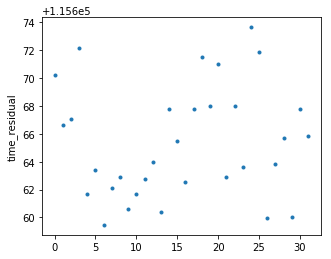

index_p 52
Jump Indices 960 982
22
400100.7051980779


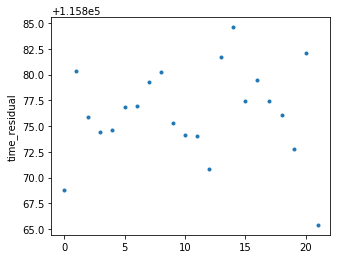

index_p 53
Jump Indices 982 1032
50
400100.7043811417


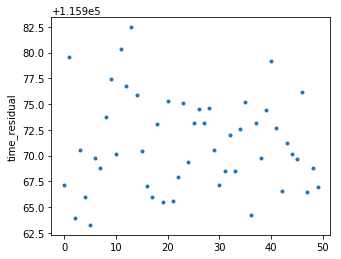

index_p 54
Jump Indices 1032 1144
112
400100.7041332353


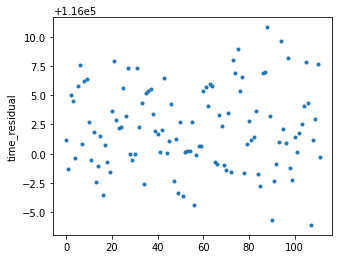

index_p 55
Jump Indices 1144 1148
4
400100.73423263367


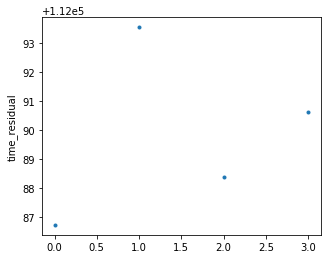

index_p 56
Jump Indices 1148 1150
2
400100.7201606256


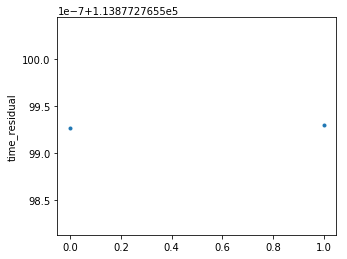

index_p 57
Jump Indices 1150 1154
4
400100.7081634218


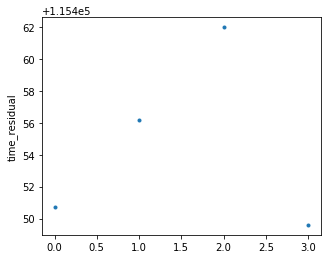

index_p 58
Jump Indices 1154 1164
10
400100.7056181917


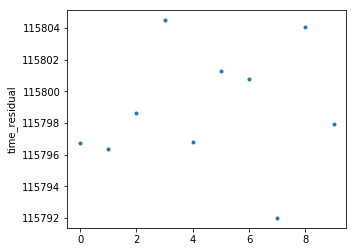

index_p 59
Jump Indices 1164 1165
1
400102.58792896156


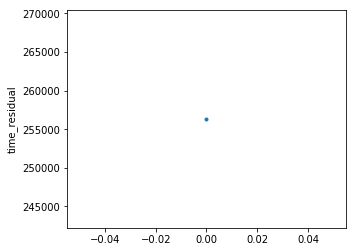

index_p 60
Jump Indices 1165 1166
1
400102.58792896156


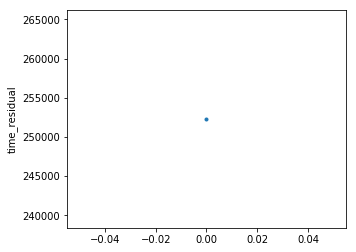

index_p 61
Jump Indices 1166 1168
2
400105.306640625


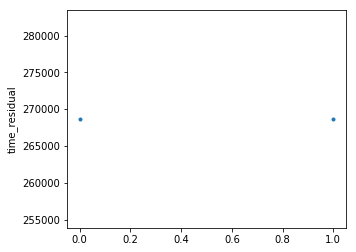

index_p 62
Jump Indices 1168 1172
4
400100.7113980462


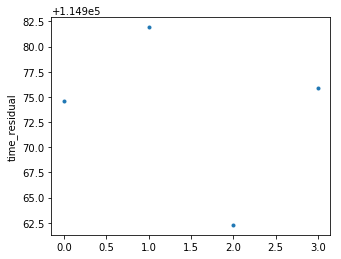

index_p 63
Jump Indices 1172 1176
4
400100.74128453044


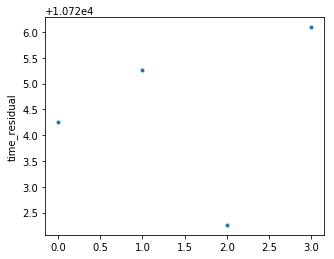

index_p 64
Jump Indices 1176 1201
25
400100.70326912694


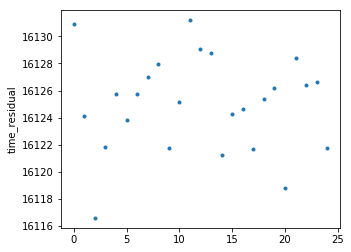

index_p 65
Jump Indices 1201 1202
1
400102.58792896156


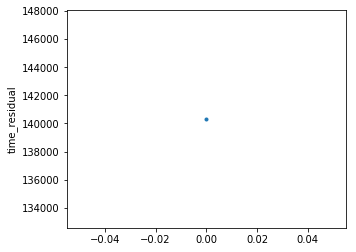

index_p 66
Jump Indices 1202 1203
1
400102.58792896156


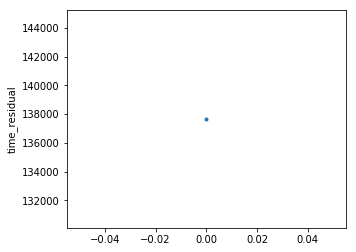

index_p 67
Jump Indices 1203 1221
18
400100.7002067708


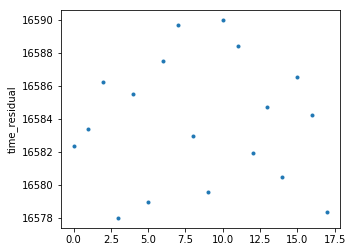

index_p 68
Jump Indices 1221 1225
4
400100.73678442265


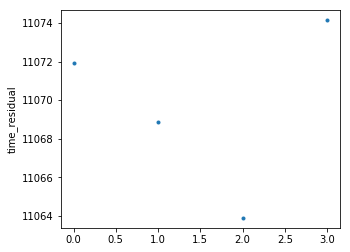

index_p 69
Jump Index size = 70 1228
[1225]
Jump Indices 1225 1228
400100.71281772817


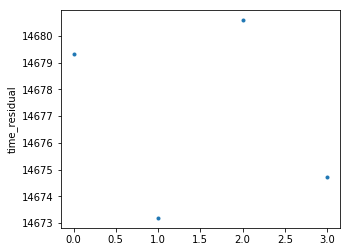

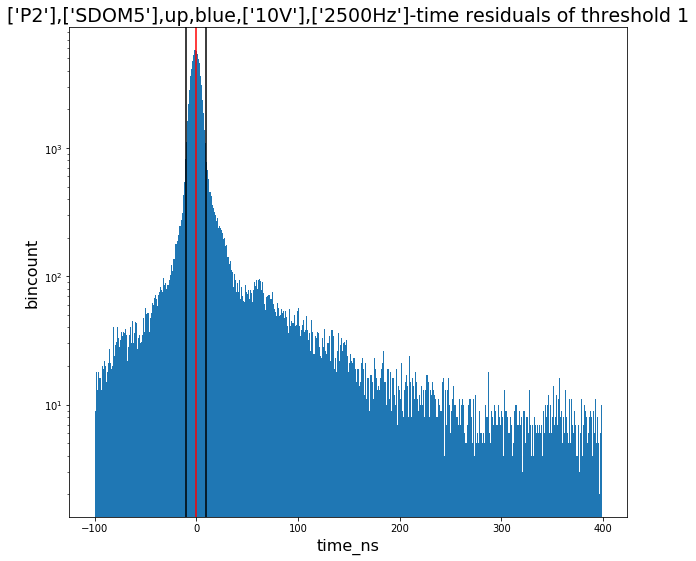

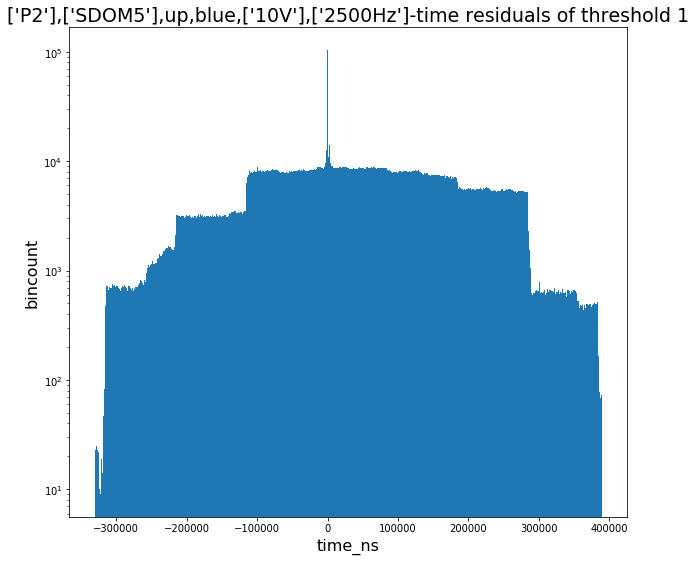

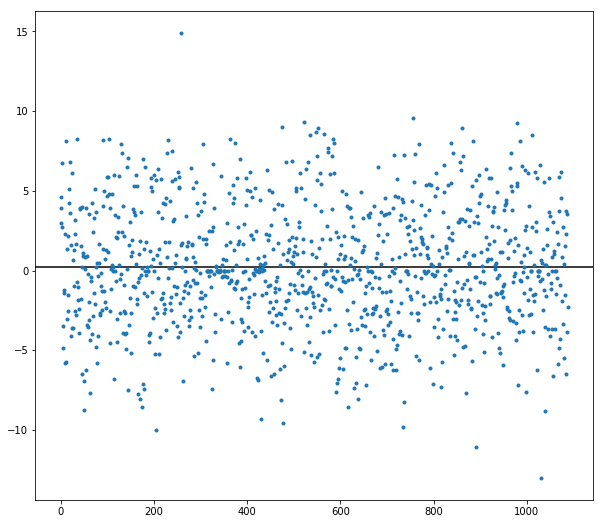

In [35]:
t_res_all2,  num_events2, noise_events2 = r2.res(gaus_peak, 250, 5)

400100.70597649505


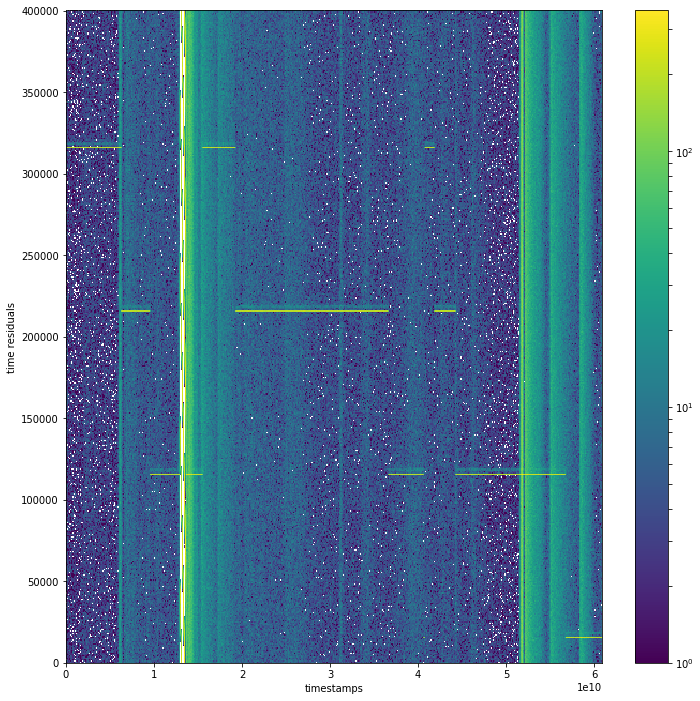

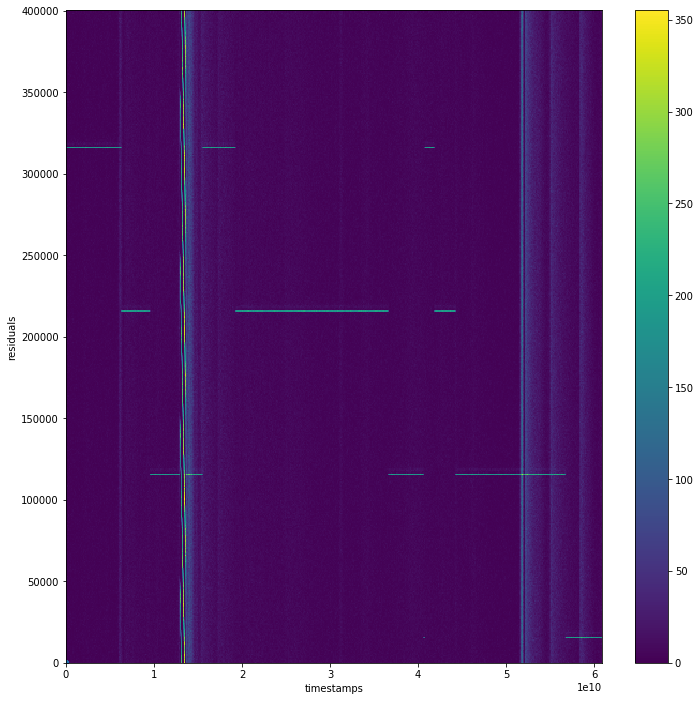

In [37]:
gaus_peak = r2.minimizer(2.0e10,3.5e10) #400100.7106722718
abs_elim, BinsHist, JumpIndex, xedges, yedges, POCAM_bins, POCAM_diff = r2.HIST2D(500, gaus_peak, SDOM_num)

/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:719: RuntimeWarning: divide by zero encountered in true_divide
  transform = 1.0 / sigma
/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:785: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


T_RES_ALL.SIZE != ABS_ELIM.SIZE


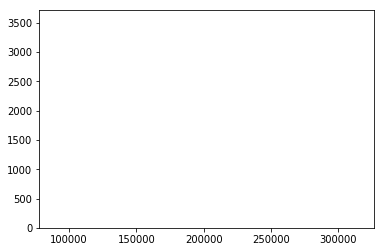

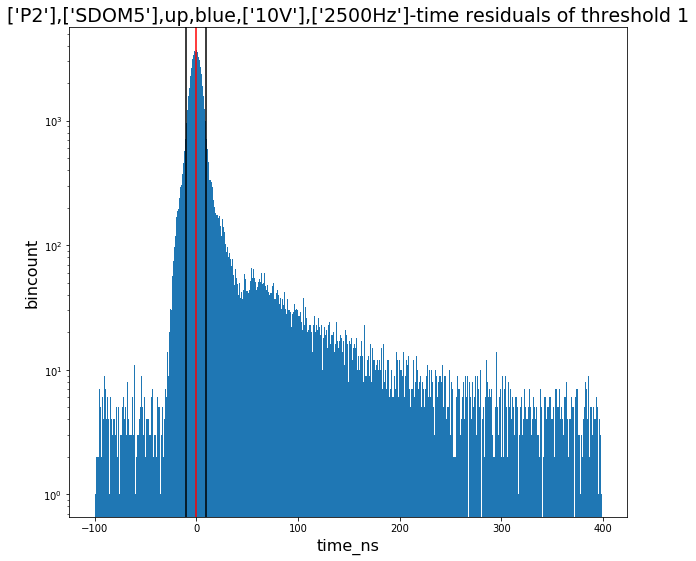

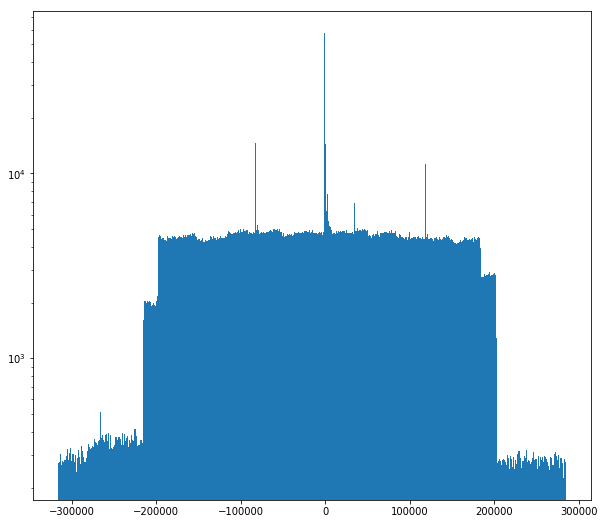

In [38]:
t_res_all1,num_events1, noise_events1 = r2.calc_res(BinsHist, 10, 2, 1,bin_size=1)

# ---------------------------------------------------
# sDOM5 MINOS 12V

In [12]:
b = clean.clean('20190313_153157_UTC_SDOM5_FLASH_MINOS1_P2_blue_both_2500Hz_12V_30s_19072153207.hld_up.hdf5')

percentage of high jumps in the file - 0.0


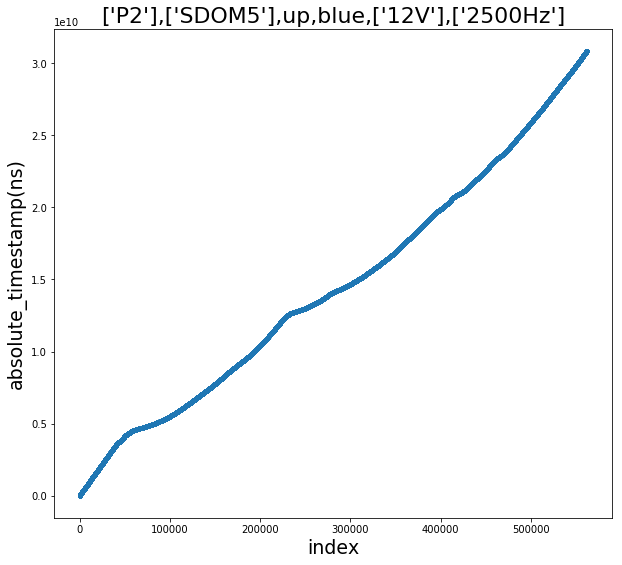

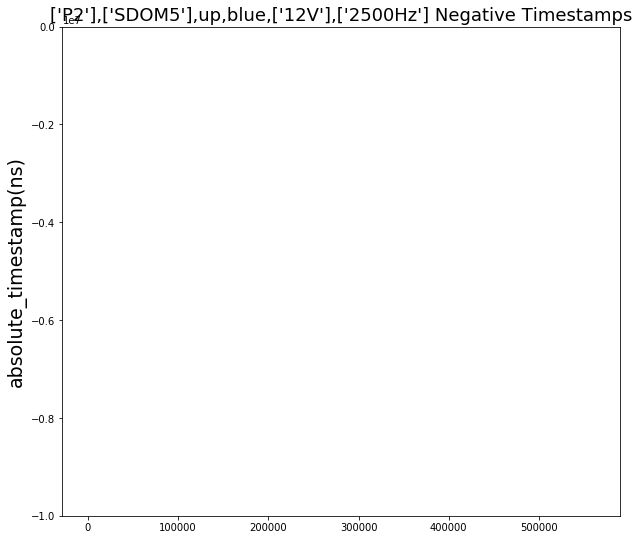

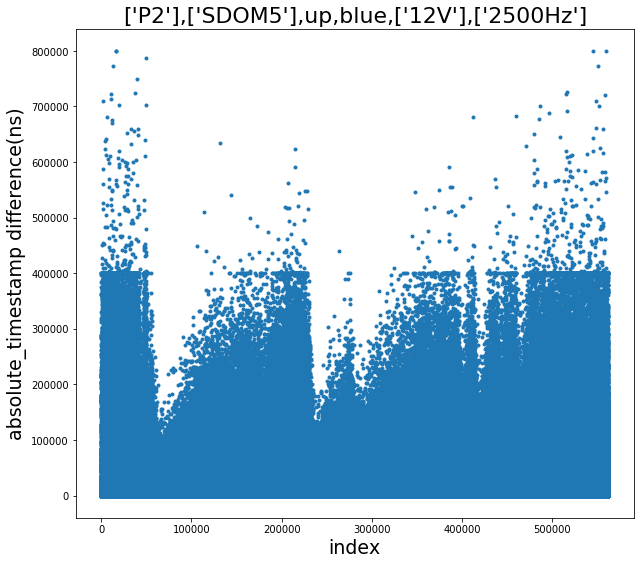

[]


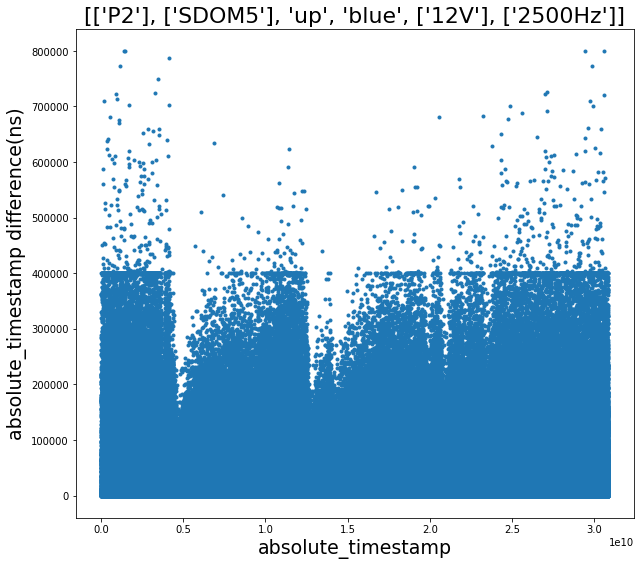

0.48441558209414104


In [13]:
(abs_elim_3, rising_0_elim_3, rising_1_elim_3, rising_2_elim_3, rising_3_elim_3,
 falling_0_elim_3, falling_1_elim_3, falling_2_elim_3, falling_3_elim_3, POCAM_num, values,
atstamp, p_jumps, dt_mean, f_r, file_path, SDOM_num, PMT,sub_time_elim_3,sub_id_elim_3) = b.P_S_used()

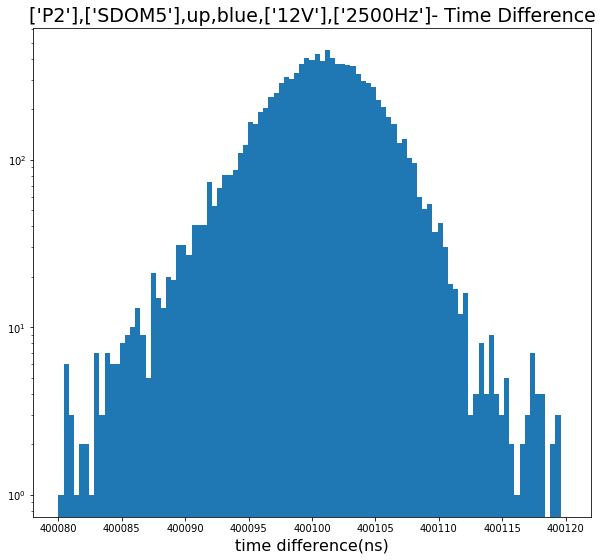

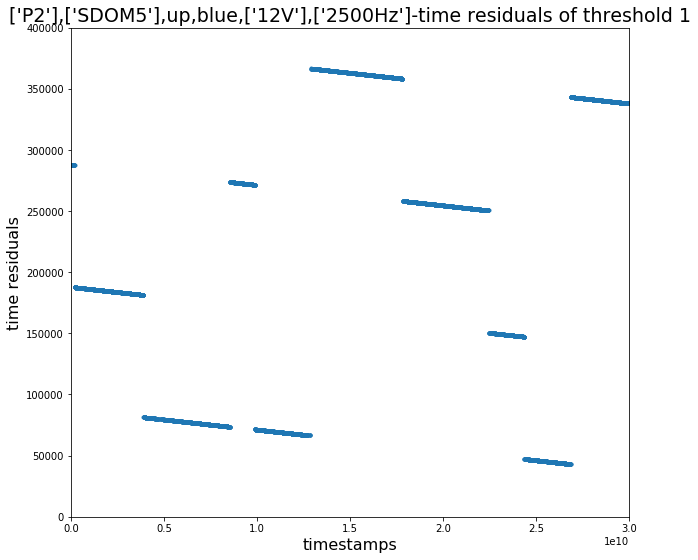

In [15]:
r2 = residual.residual(abs_elim_3,rising_1_elim_3,400080, 400120, 100, 
                                400095, 400105,
             .0e10,3.0e10,0, 400000, file_path, values, POCAM_num, rising_0_elim_3,falling_0_elim_3)

7894
jump_index [   0.   52. 1239. 2159. 2459. 3209. 4273. 5492. 5971. 6736.]
jump_index size 10
index_p 0
Jump Indices 0 53
53
400100.6621677273


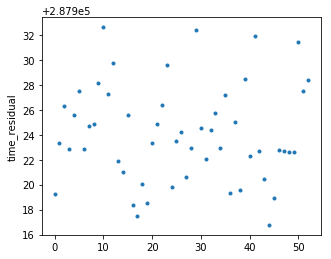

index_p 1
Jump Indices 53 1240
1187
400100.65913852386


/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:719: RuntimeWarning: divide by zero encountered in true_divide
  transform = 1.0 / sigma
/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:785: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


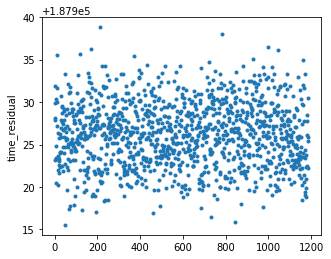

index_p 2
Jump Indices 1240 2160
920
400100.659121677


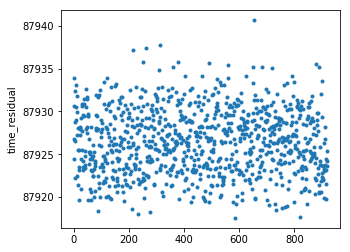

index_p 3
Jump Indices 2160 2460
300
400100.6588362714


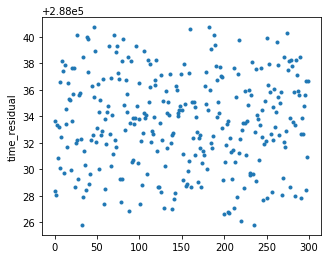

index_p 4
Jump Indices 2460 3210
750
400100.659005783


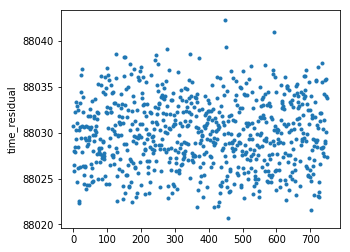

index_p 5
Jump Indices 3210 4274
1064
400100.65913979284


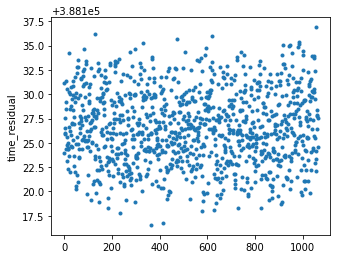

index_p 6
Jump Indices 4274 5493
1219
400100.65896306536


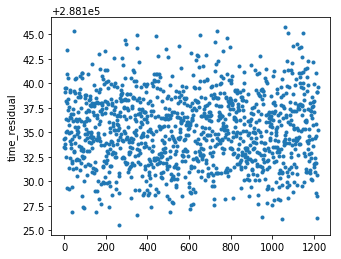

index_p 7
Jump Indices 5493 5972
479
400100.65912129893


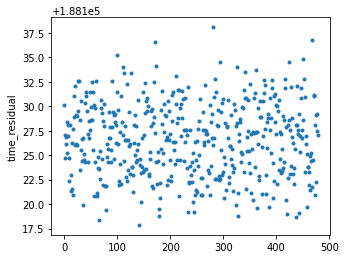

index_p 8
Jump Indices 5972 6737
765
400100.659220137


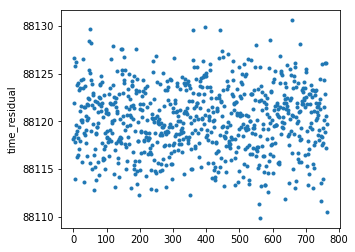

index_p 9
Jump Index size = 10 7893
[6737]
Jump Indices 6737 7893
400100.6589932654


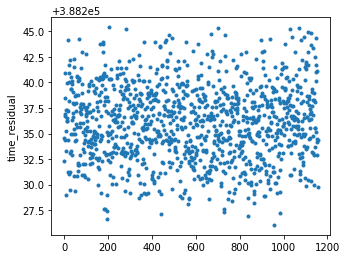

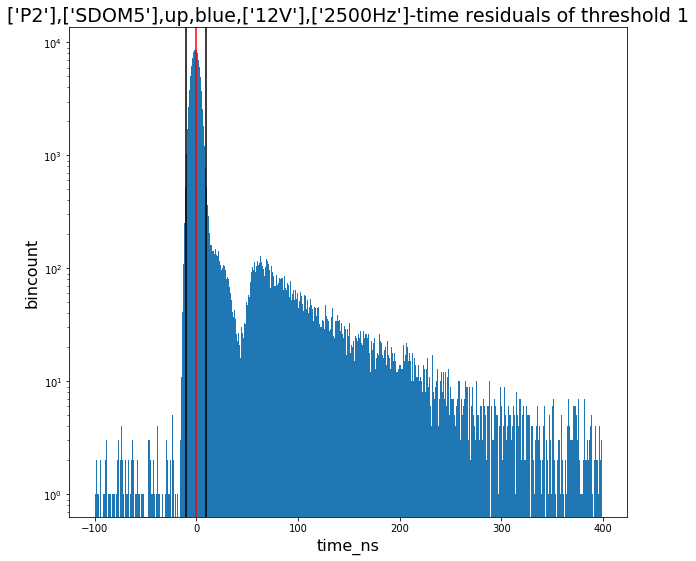

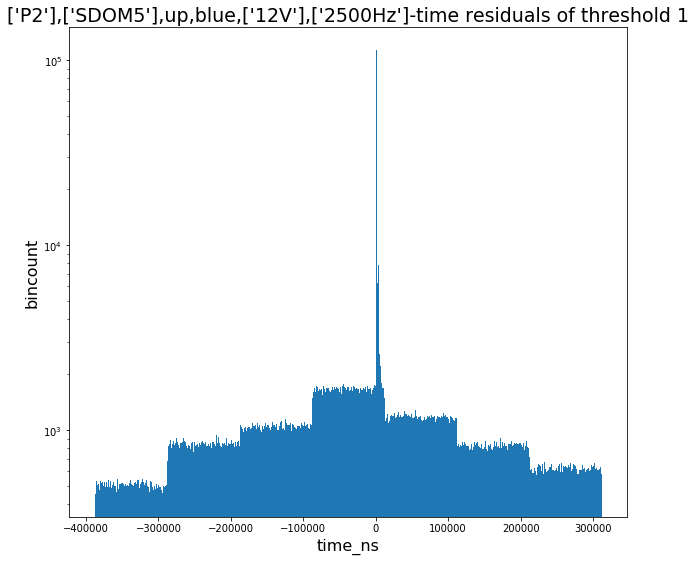

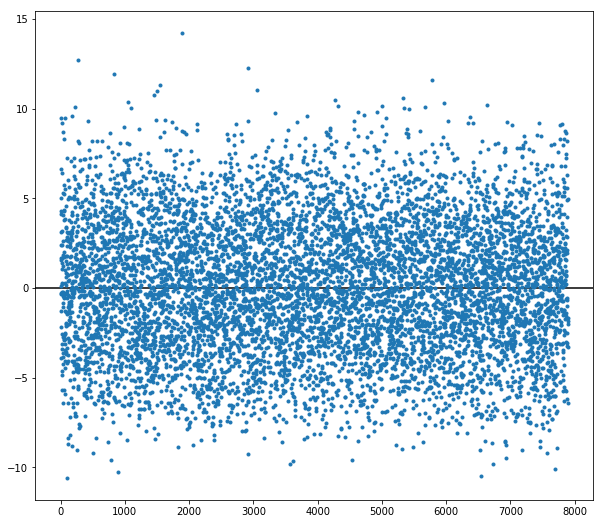

In [16]:
t_res_all2,  num_events2, noise_events2 = r2.res(gaus_peak, 250, 5)

In [17]:
sDOM5_MINOS_run = run.run()
run_time, err_run_time, dead_time_uncert = sDOM5_MINOS_run.run_time(atstamp, p_jumps, dt_mean, b.f_0,
                                                    b.f_1-b.r_1,
                                                    b.f_2-b.r_2,
                                                    b.f_3-b.r_3)

print('dead_time_uncert: ', dead_time_uncert, '%')

timestamp of the last event -  30859571424.642582
eliminating high jumps and summing -  30850491669.986332
run time -  30850491669.986332
dead_time_uncert:  0.0 %


# ---------------------------------------------------
# sDOM5 HERA 12V

In [160]:
b = clean.clean('20190607_151716_UTC_SDOM5_FLASH_HERA1_P2_blue_both_2500Hz_12V_60s_19158151726.hld_up.hdf5')

percentage of high jumps in the file - 0.3446327006462094


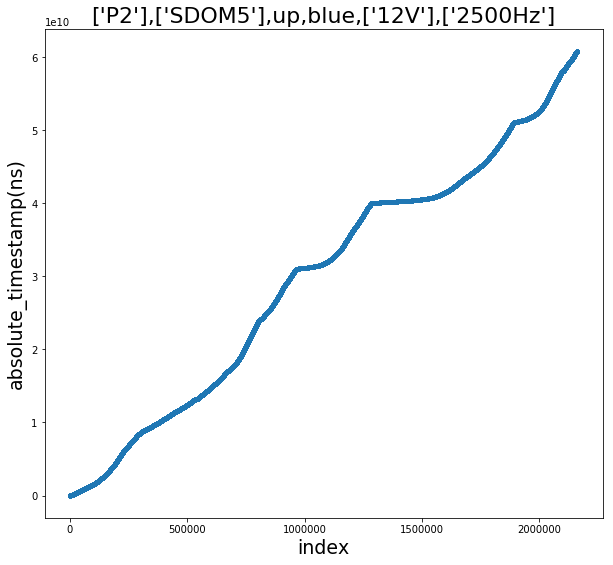

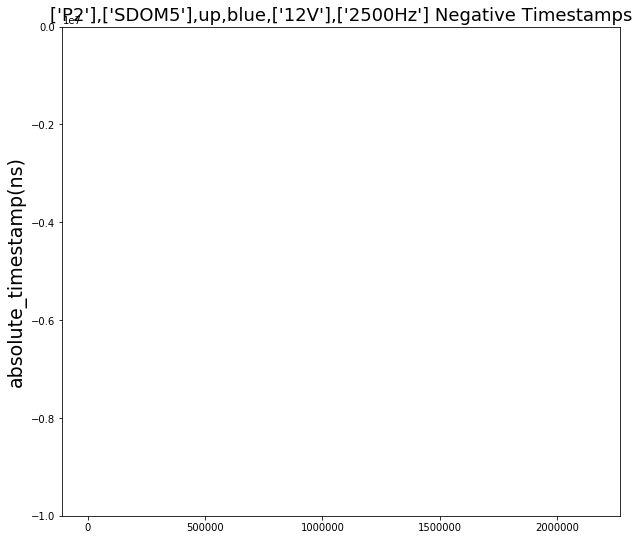

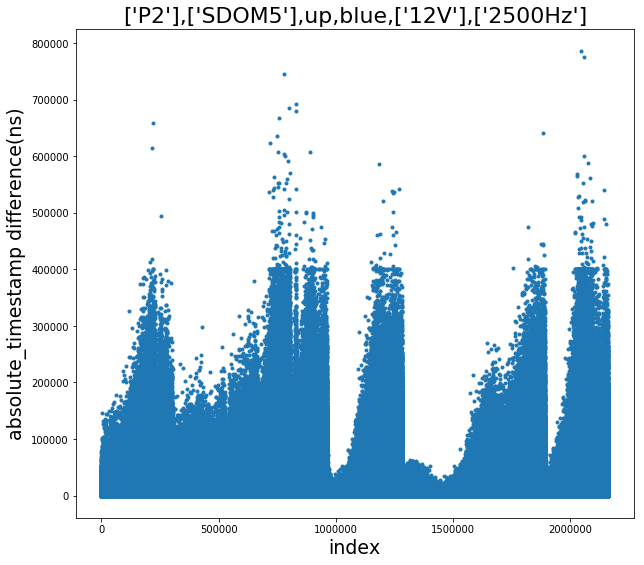

[]


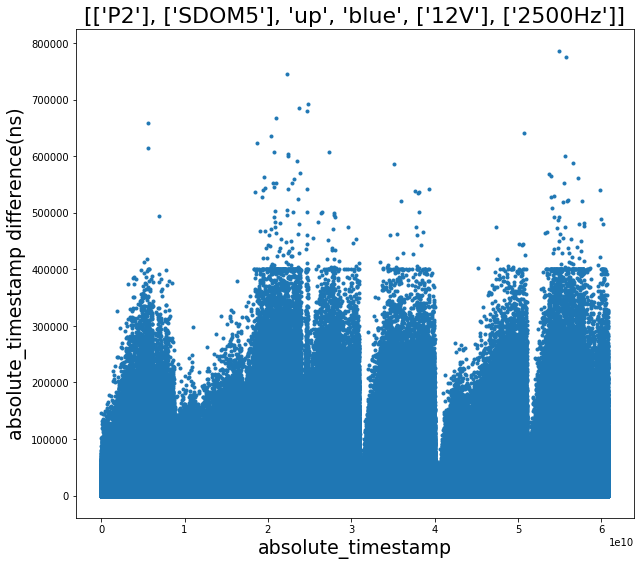

0.30372431149326945


In [153]:
(abs_elim_3, rising_0_elim_3, rising_1_elim_3, rising_2_elim_3, rising_3_elim_3,
 falling_0_elim_3, falling_1_elim_3, falling_2_elim_3, falling_3_elim_3, POCAM_num, values,
atstamp, p_jumps, dt_mean, f_r, file_path, SDOM_num, PMT,sub_time_elim_3,sub_id_elim_3) = b.P_S_used()

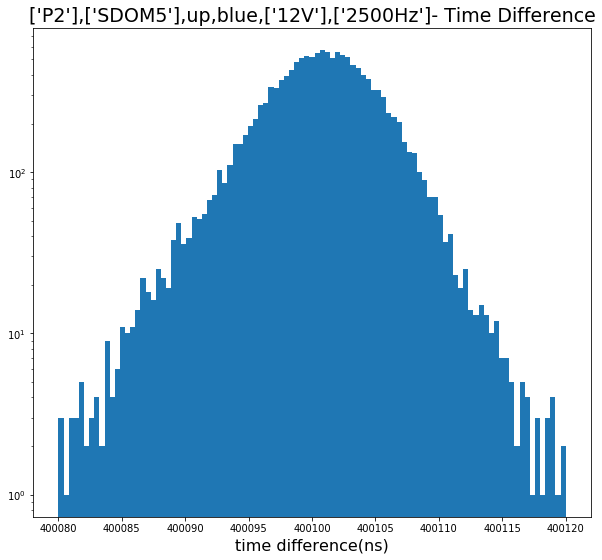

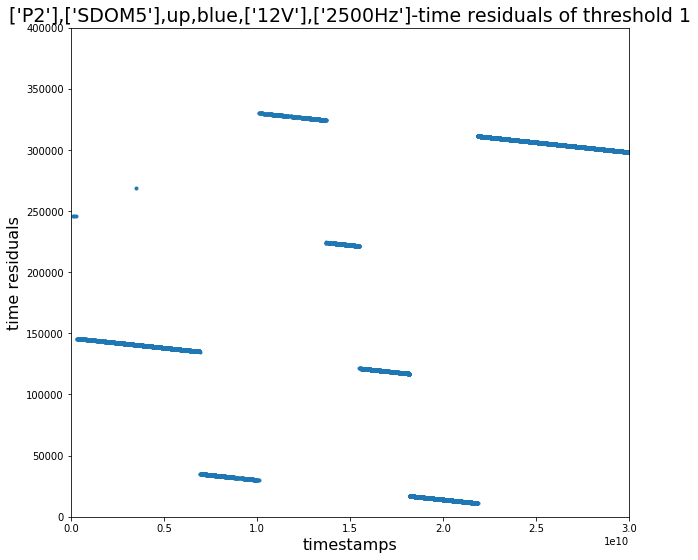

In [157]:
r2 = residual.residual(abs_elim_3,rising_1_elim_3,400080, 400120, 100, 
                                400095, 400105,
             .0e10,3.0e10,0, 400000, file_path, values, POCAM_num, rising_0_elim_3,falling_0_elim_3)

400100.684856576
10567
jump_index [0.0000e+00 2.0000e+00 3.0700e+02 3.0800e+02 9.7500e+02 1.3550e+03
 1.6090e+03 1.8290e+03 2.2220e+03 3.1760e+03 5.2880e+03 6.9360e+03
 6.9370e+03 6.9520e+03 6.9530e+03 8.2440e+03 8.5530e+03 8.5560e+03
 8.6860e+03 8.7210e+03 9.3930e+03 1.0061e+04]
jump_index size 22
index_p 0
Jump Indices 0 3
3
400100.70995739405


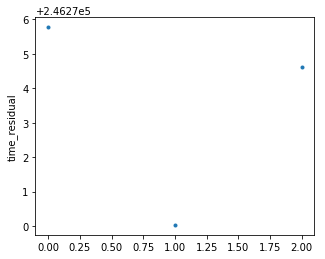

/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:719: RuntimeWarning: divide by zero encountered in true_divide
  transform = 1.0 / sigma
/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:785: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


index_p 1
Jump Indices 3 308
305
400100.6848822614


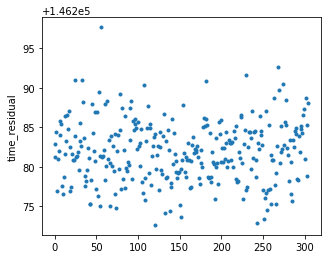

index_p 2
Jump Indices 308 309
1


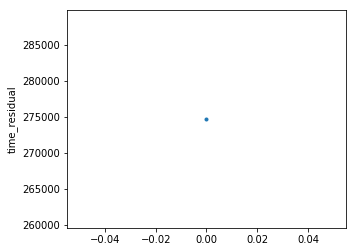

index_p 3
Jump Indices 309 976
667
400100.6848802498


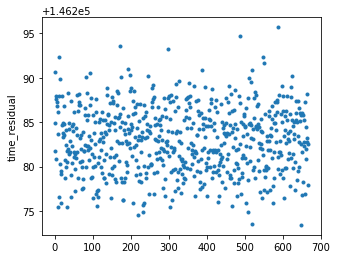

index_p 4
Jump Indices 976 1356
380
400100.6848696209


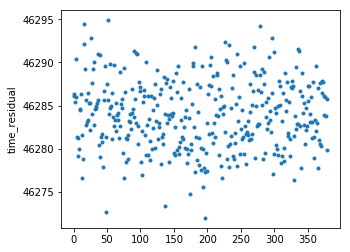

index_p 5
Jump Indices 1356 1610
254
400100.6848926764


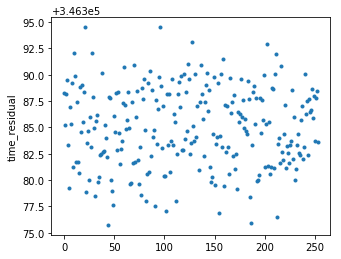

index_p 6
Jump Indices 1610 1830
220
400100.68449321267


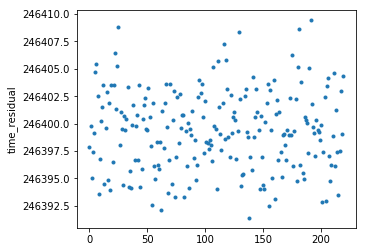

index_p 7
Jump Indices 1830 2223
393
400100.6847431795


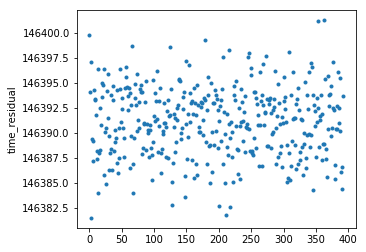

index_p 8
Jump Indices 2223 3177
954
400100.68492216524


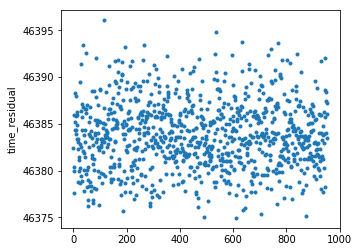

index_p 9
Jump Indices 3177 5289
2112
400100.68487142085


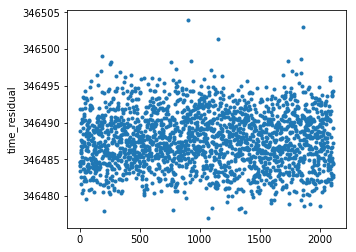

index_p 10
Jump Indices 5289 6937
1648
400100.6849007802


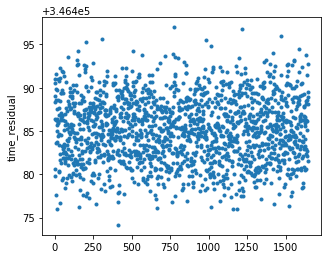

index_p 11
Jump Indices 6937 6938
1


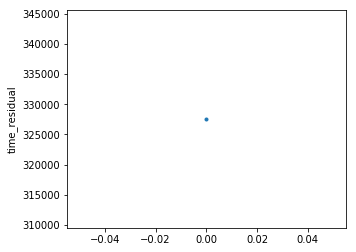

index_p 12
Jump Indices 6938 6953
15
400100.73457285814


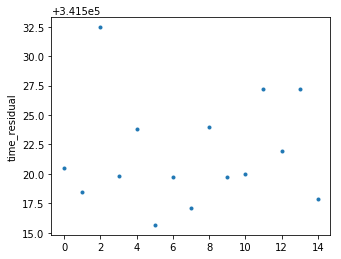

index_p 13
Jump Indices 6953 6954
1


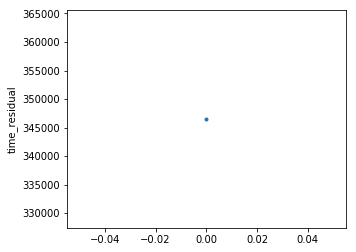

index_p 14
Jump Indices 6954 8245
1291
400100.6850530228


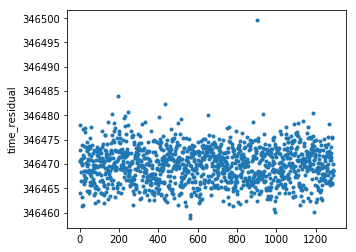

index_p 15
Jump Indices 8245 8554
309
400100.6852013035


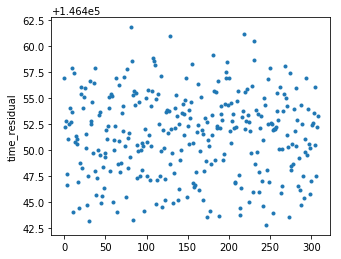

index_p 16
Jump Indices 8554 8557
3
400100.688434184


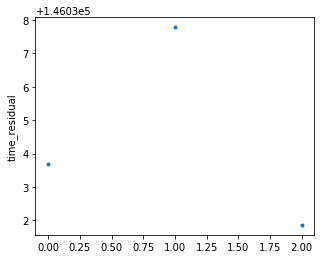

index_p 17
Jump Indices 8557 8687
130
400100.6849332075


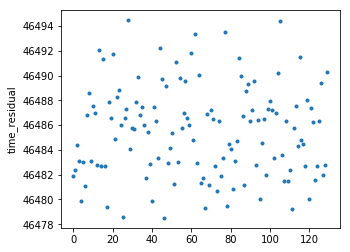

index_p 18
Jump Indices 8687 8722
35
400100.68887445005


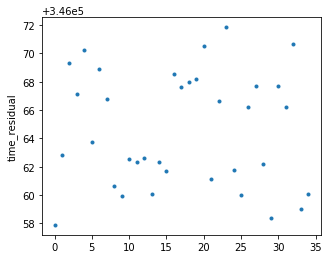

index_p 19
Jump Indices 8722 9394
672
400100.6849217974


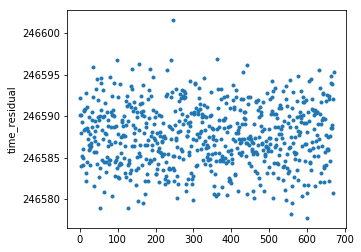

index_p 20
Jump Indices 9394 10062
668
400100.68510097096


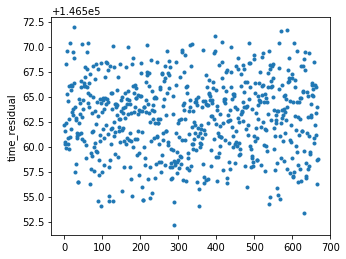

index_p 21
Jump Index size = 22 10566
[10062]
Jump Indices 10062 10566
400100.6850684825


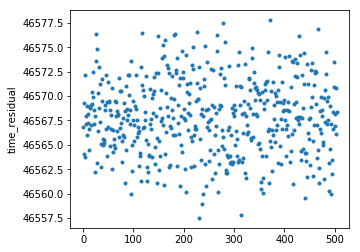

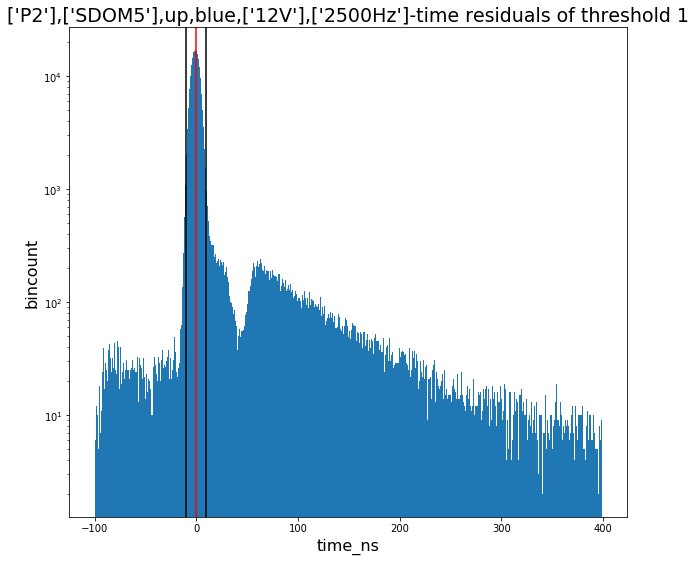

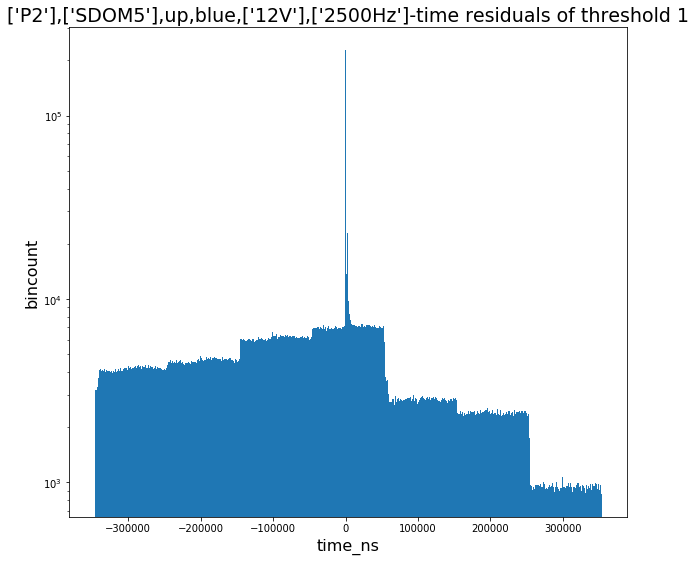

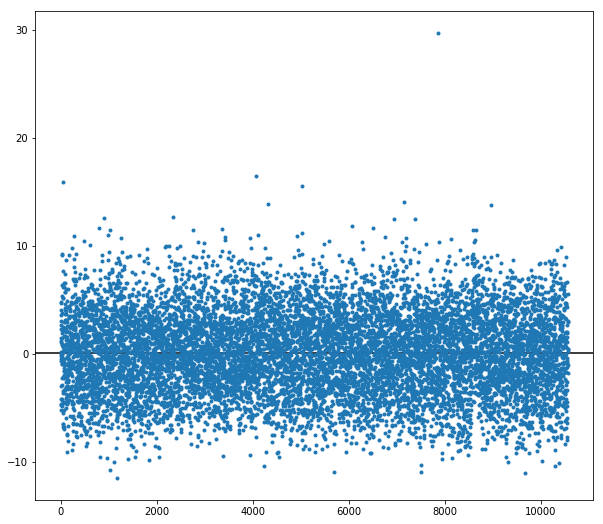

In [158]:
gaus_peak = r2.minimizer(2.25e10,3e10)
t_res_all2,  num_events2, noise_events2 = r2.res(gaus_peak, 250, 5)

In [159]:
sDOM5_HERA_run = run.run()
run_time, err_run_time, dead_time_uncert = sDOM5_HERA_run.run_time(atstamp, p_jumps, dt_mean, b.f_0,
                                                    b.f_1-b.r_1,
                                                    b.f_2-b.r_2,
                                                    b.f_3-b.r_3)

print('dead_time_uncert: ', dead_time_uncert, '%')

timestamp of the last event -  60857884054.35645
eliminating high jumps and summing -  60790788806.60183
run time -  60790788806.60183
dead_time_uncert:  0.08580605057250545 %


# ---------------------------------------------------
# sDOM2 POSEIDON 12V

In [165]:
c = clean.clean('20190426_081108_UTC_SDOM2_FLASH_POSEIDON1_P2_blue_both_2500Hz_12V_60s_19116081118.hld_up.hdf5')

percentage of high jumps in the file - 0.00023518184521585252


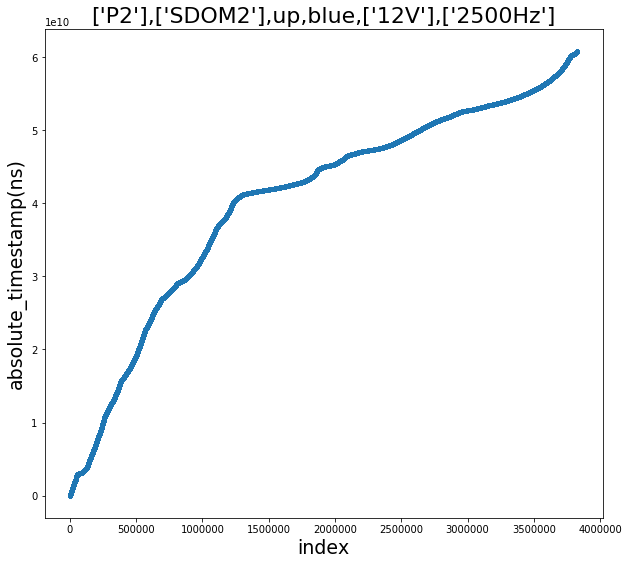

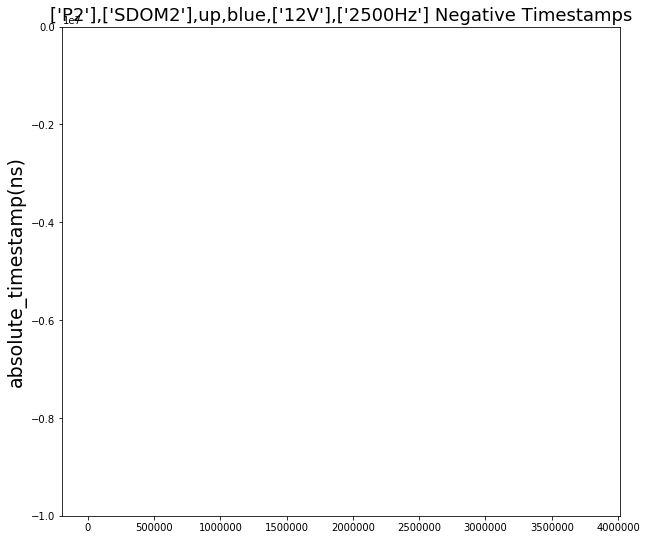

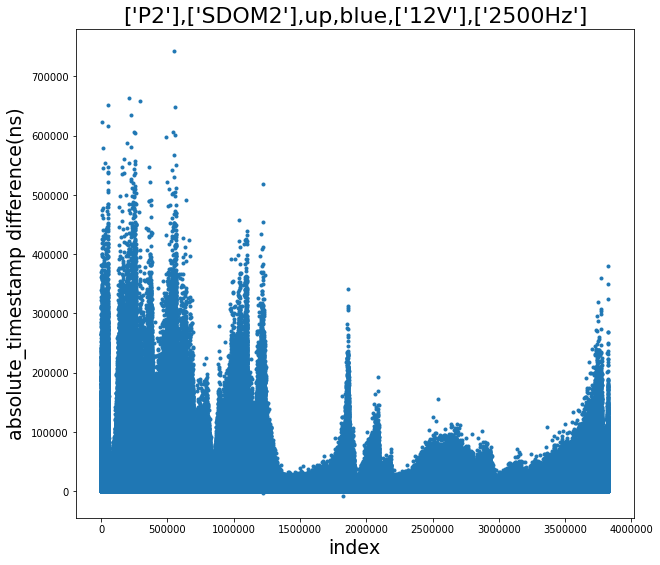

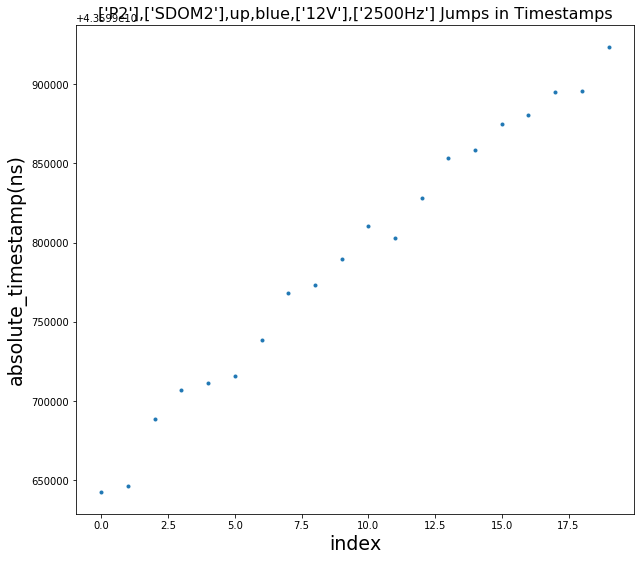

[1217459. 1217460. 1217461. 1217462. 1217463. 1217464. 1826209. 1826210.
 1826211.]


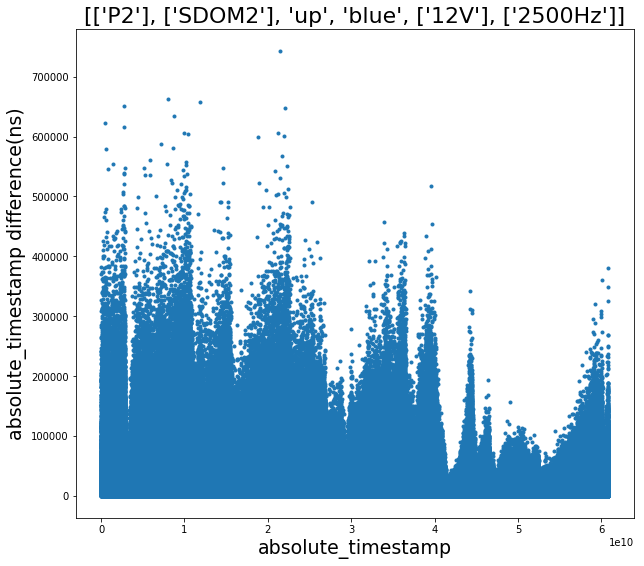

0.08892590066244566


In [166]:
(abs_elim_3, rising_0_elim_3, rising_1_elim_3, rising_2_elim_3, rising_3_elim_3,
 falling_0_elim_3, falling_1_elim_3, falling_2_elim_3, falling_3_elim_3, POCAM_num, values,
atstamp, p_jumps, dt_mean, f_r, file_path, SDOM_num, PMT,sub_time_elim_3,sub_id_elim_3) = c.P_S_used()

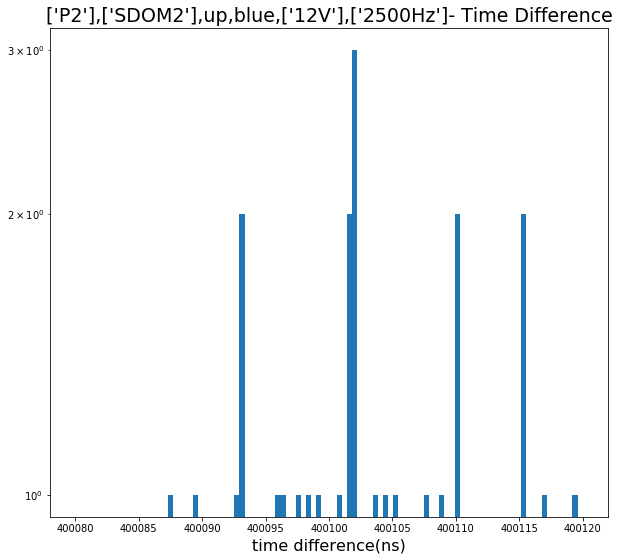

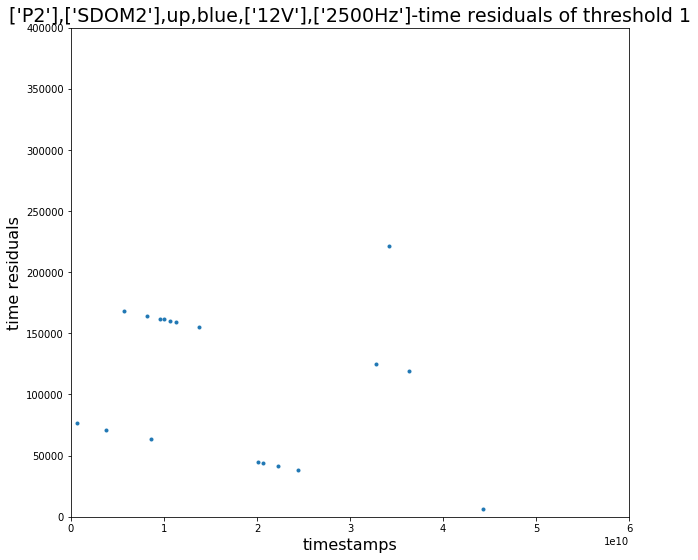

In [167]:
r3 = residual.residual(abs_elim_3,rising_1_elim_3,400080, 400120, 100, 
                                400095, 400115,
             0.0e10,6e10,0, 400000, file_path, values, POCAM_num, rising_0_elim_3,falling_0_elim_3)

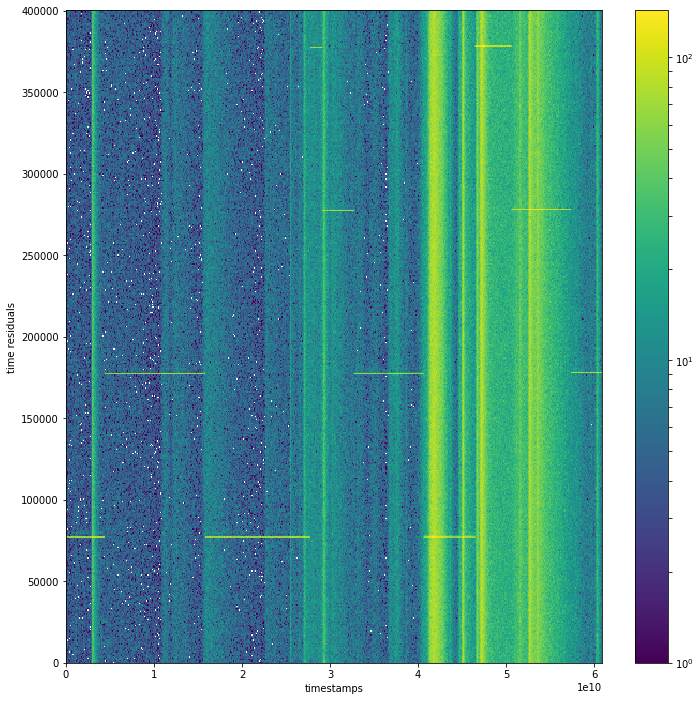

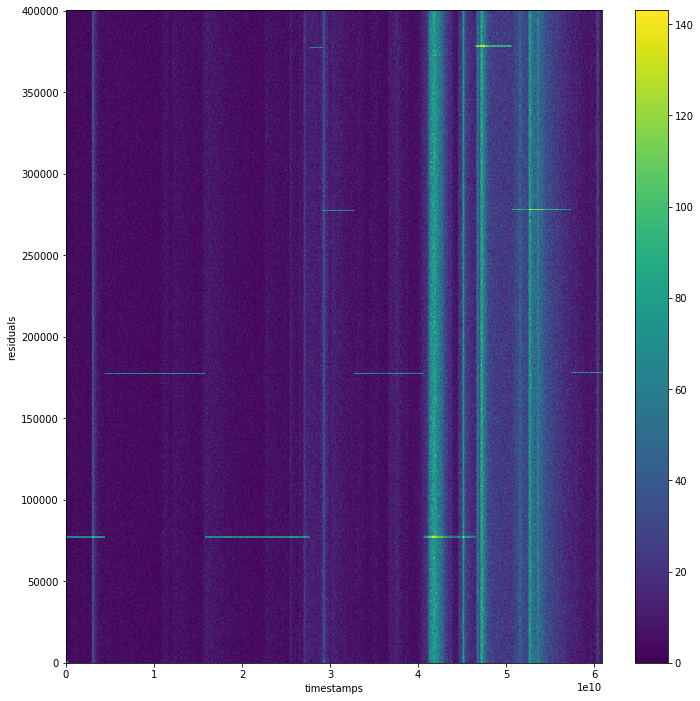

In [168]:
#gaus_peak = 400100.7106722718
abs_elim, BinsHist, JumpIndex, xedges, yedges, POCAM_bins, POCAM_diff = r3.HIST2D(500, gaus_peak, SDOM_num)

/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:719: RuntimeWarning: divide by zero encountered in true_divide
  transform = 1.0 / sigma
/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:785: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


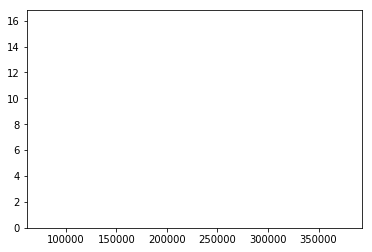

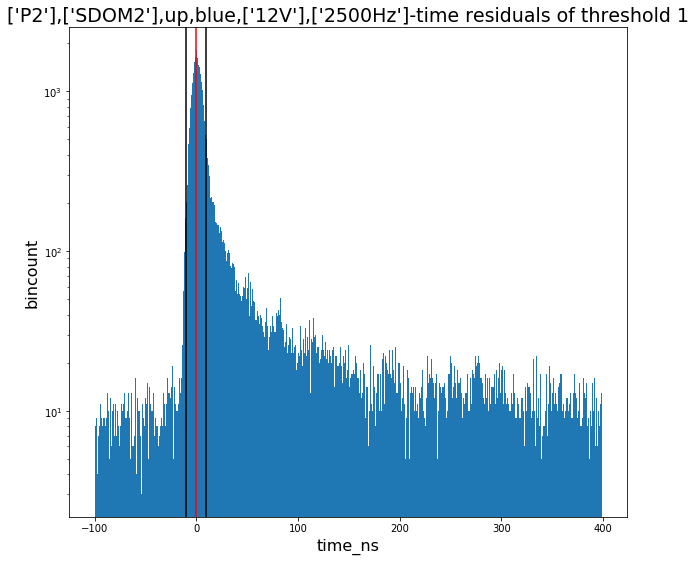

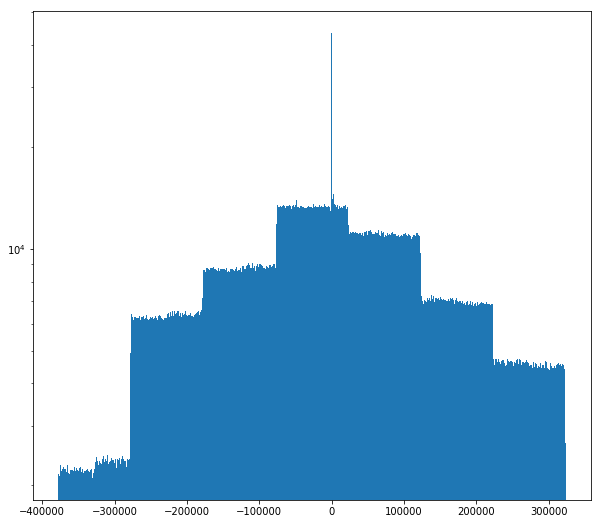

In [170]:
t_res_all1,num_events1, noise_events1 = r3.calc_res(BinsHist, 10, 2, 1,bin_size=1)

In [171]:
sDOM2_POSEIDON_run = run.run()
run_time, err_run_time, dead_time_uncert = sDOM2_POSEIDON_run.run_time(atstamp, p_jumps, dt_mean, c.f_0,
                                                    c.f_1-c.r_1,
                                                    c.f_2-c.r_2,
                                                    c.f_3-c.r_3)

print('dead_time_uncert: ', dead_time_uncert, '%')

time removed(small jumps) -  250360.9755935669
timestamp of the last event -  60860270680.28711
eliminating high jumps and summing -  60843228683.813576
run time -  60842978322.83798
dead_time_uncert:  0.008334891249822788 %


# ---------------------------------------------------
# sDOM2 MINOS 12V

In [18]:
c = clean.clean('20190313_153155_UTC_SDOM2_FLASH_MINOS1_P2_blue_both_2500Hz_12V_30s_19072153205.hld_up.hdf5')

percentage of high jumps in the file - 3.198474664577706


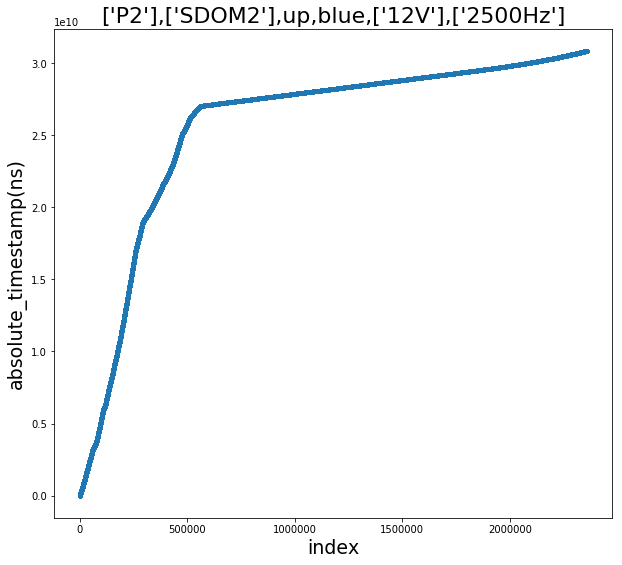

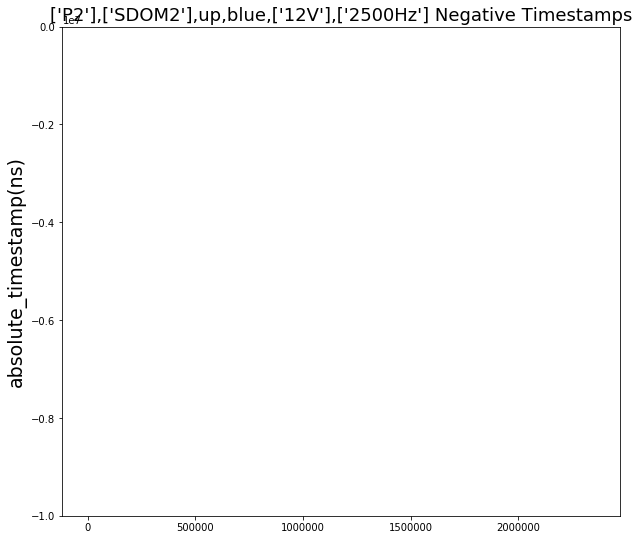

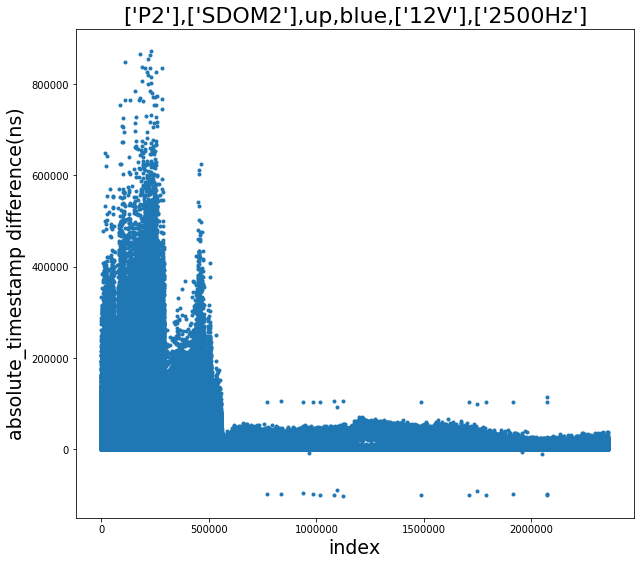

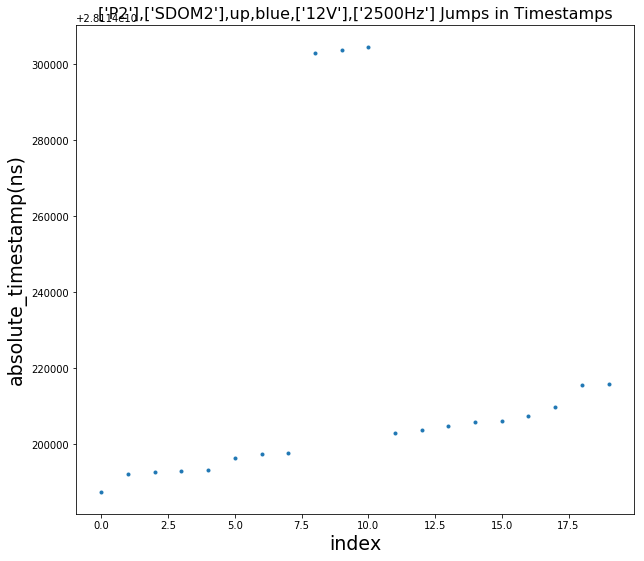

[ 769154.  834638.  834639.  834640.  834641.  938834.  938835.  938836.
  966725.  982815.  982816. 1017711. 1084253. 1084254. 1084255. 1084256.
 1097750. 1097751. 1097752. 1097753. 1097754. 1097755. 1125920. 1125921.
 1125922. 1487610. 1487611. 1487612. 1487613. 1487614. 1710177. 1710178.
 1745856. 1788718. 1911799. 1911800. 1911801. 1956433. 1956434. 1956435.
 1956436. 1956437. 1956438. 2050727. 2072756. 2072813. 2072814. 2072815.]


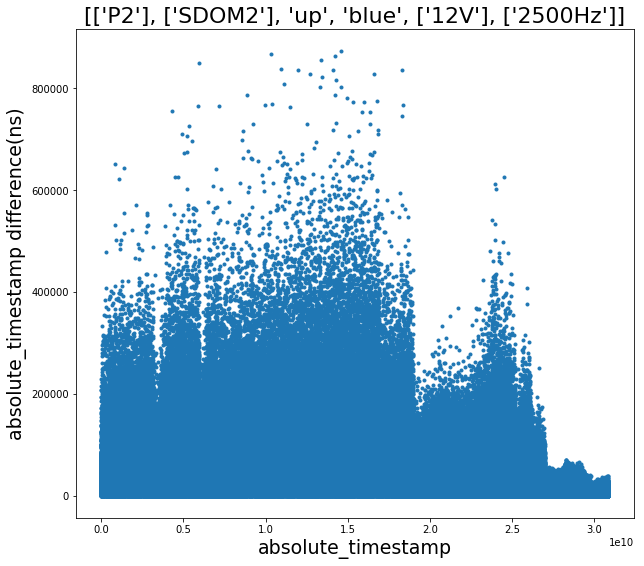

0.1295304330690771


In [19]:
(abs_elim_3, rising_0_elim_3, rising_1_elim_3, rising_2_elim_3, rising_3_elim_3,
 falling_0_elim_3, falling_1_elim_3, falling_2_elim_3, falling_3_elim_3, POCAM_num, values,
atstamp, p_jumps, dt_mean, f_r, file_path, SDOM_num, PMT,sub_time_elim_3,sub_id_elim_3) = c.P_S_used()

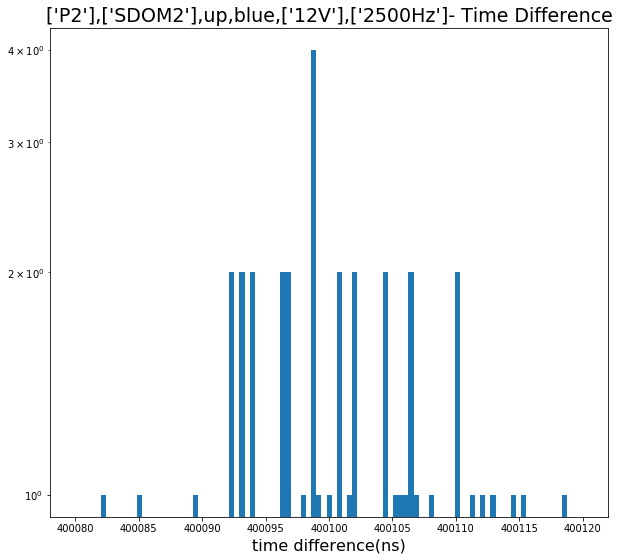

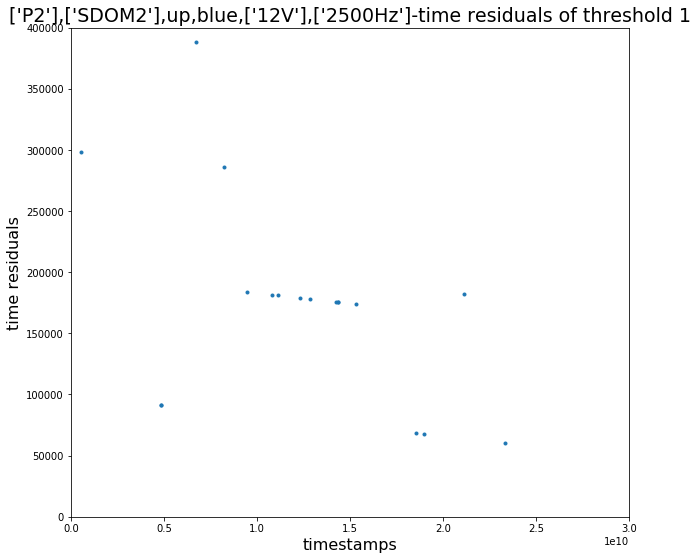

In [20]:
r3 = residual.residual(abs_elim_3,rising_1_elim_3,400080, 400120, 100, 
                                400095, 400105,
             0.0e10,3e10,0, 400000, file_path, values, POCAM_num, rising_0_elim_3,falling_0_elim_3)

400100.6654611892


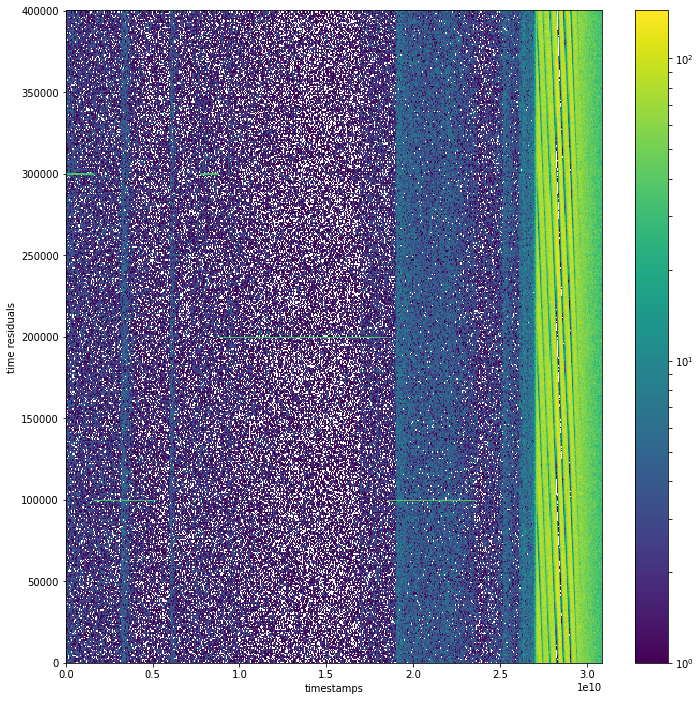

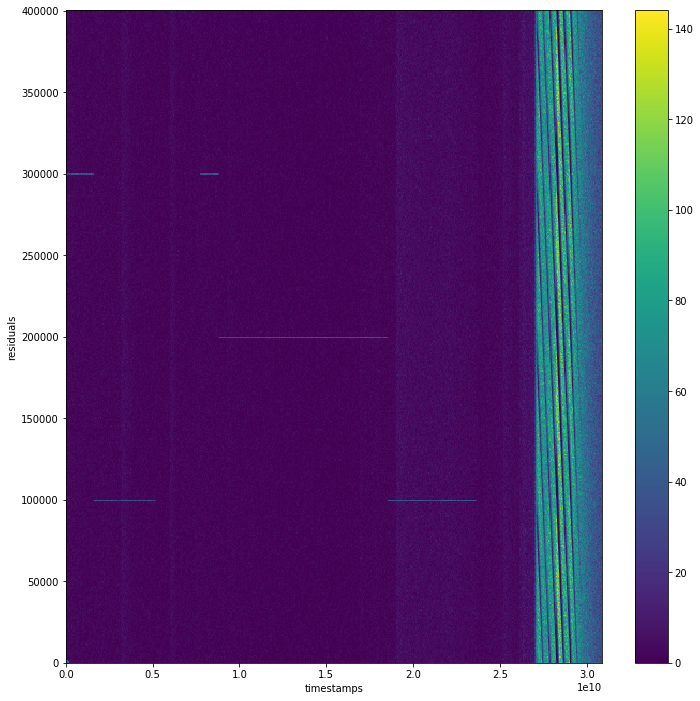

In [23]:
gaus_peak = r3.GetGausPeak([1e10,1.75e10])
abs_elim, BinsHist, JumpIndex, xedges, yedges, POCAM_bins, POCAM_diff = r3.HIST2D(500, gaus_peak, SDOM_num)

/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:719: RuntimeWarning: divide by zero encountered in true_divide
  transform = 1.0 / sigma
/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:785: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


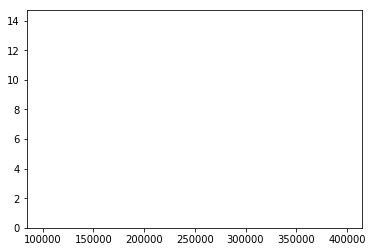

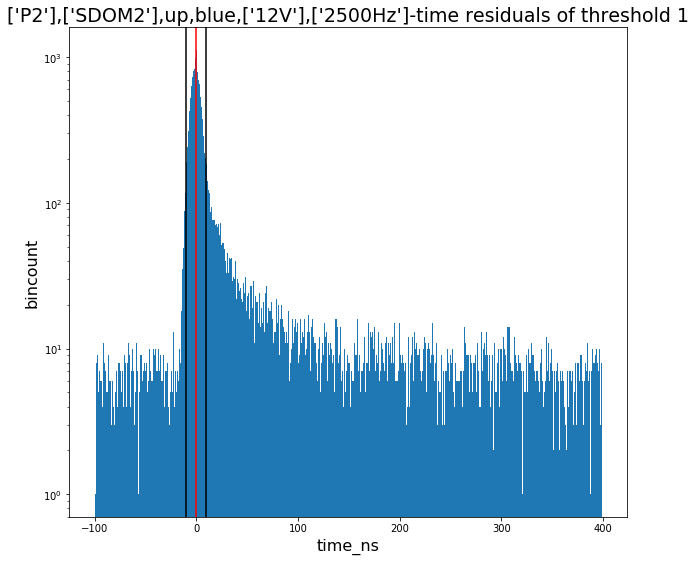

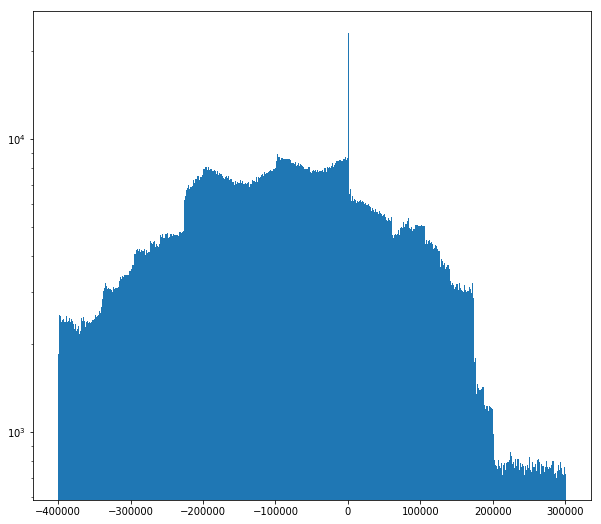

In [24]:
t_res_all1,num_events1, noise_events1 = r3.calc_res(BinsHist, 10, 2, 1,bin_size=1)

In [25]:
sDOM2_MINOS_run = run.run()
run_time, err_run_time, dead_time_uncert = sDOM2_MINOS_run.run_time(atstamp, p_jumps, dt_mean, c.f_0,
                                                    c.f_1-c.r_1,
                                                    c.f_2-c.r_2,
                                                    c.f_3-c.r_3)

print('dead_time_uncert: ', dead_time_uncert, '%')

time removed(small jumps) -  127198.11166000366
timestamp of the last event -  30860498458.48779
eliminating high jumps and summing -  30317368826.37329
run time -  30317241628.26163
dead_time_uncert:  0.7722014589578418 %


# ---------------------------------------------------
# sDOM2 HERA 12V

In [161]:
c = clean.clean('20190607_151714_UTC_SDOM2_FLASH_HERA1_P2_blue_both_2500Hz_12V_60s_19158151724.hld_up.hdf5')

percentage of high jumps in the file - 0.0


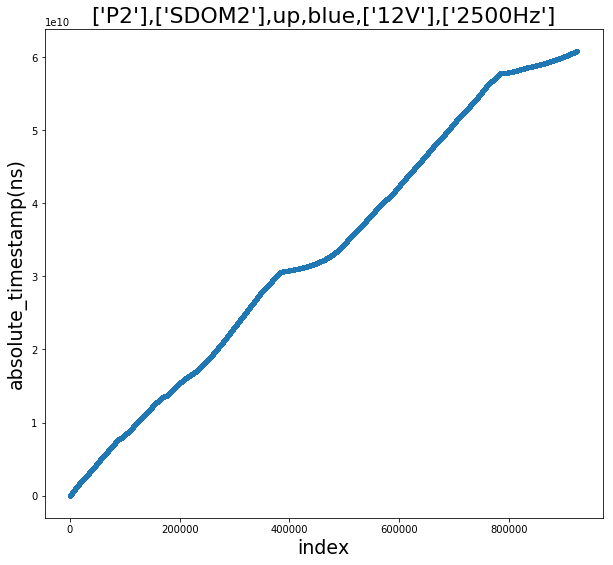

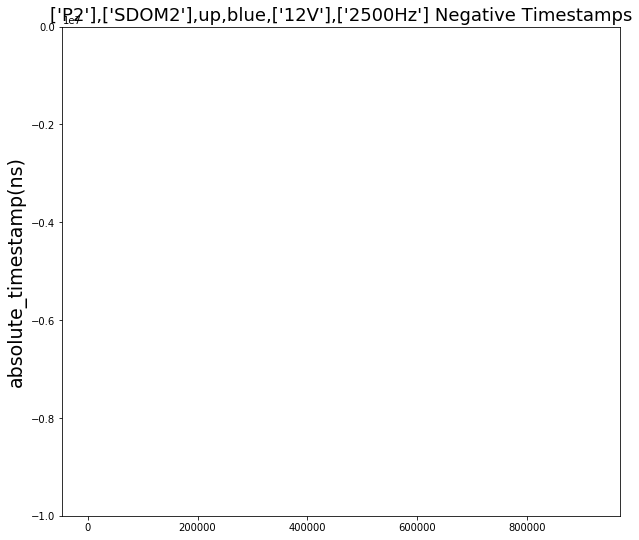

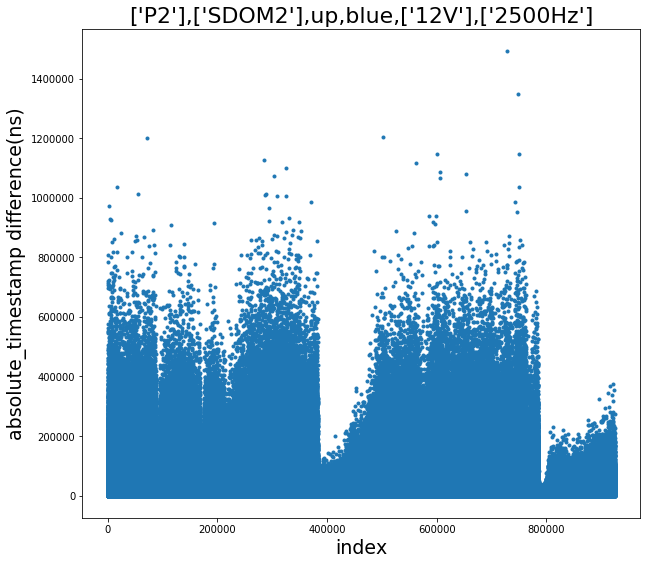

[]


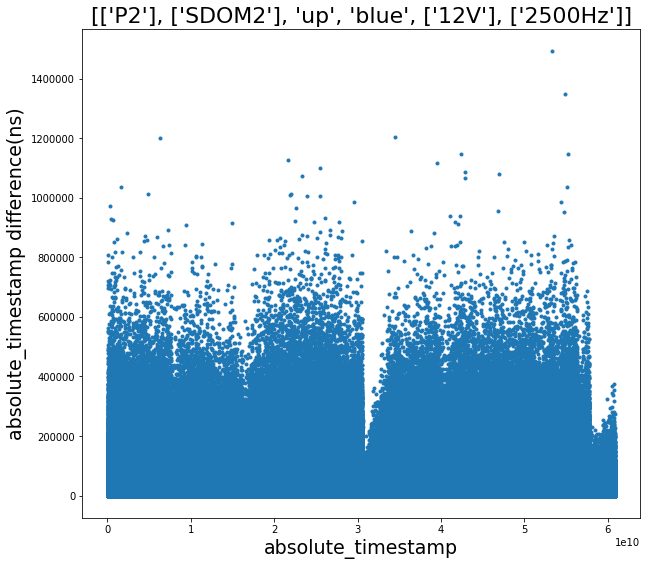

0.10380708984021934


In [162]:
(abs_elim_3, rising_0_elim_3, rising_1_elim_3, rising_2_elim_3, rising_3_elim_3,
 falling_0_elim_3, falling_1_elim_3, falling_2_elim_3, falling_3_elim_3, POCAM_num, values,
atstamp, p_jumps, dt_mean, f_r, file_path, SDOM_num, PMT,sub_time_elim_3,sub_id_elim_3) = c.P_S_used()

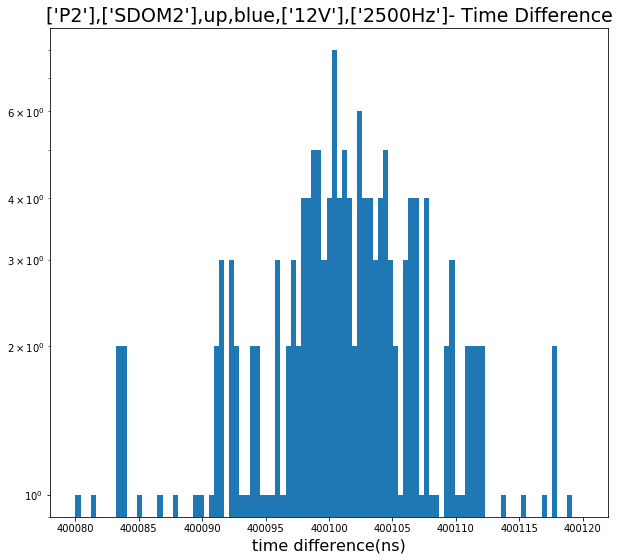

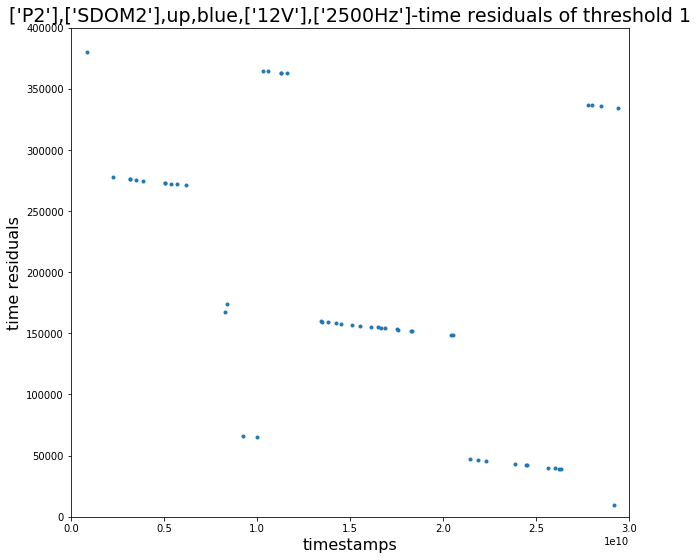

In [163]:
r3 = residual.residual(abs_elim_3,rising_1_elim_3,400080, 400120, 100, 
                                400095, 400105,
             0.0e10,3e10,0, 400000, file_path, values, POCAM_num, rising_0_elim_3,falling_0_elim_3)

400100.690908645


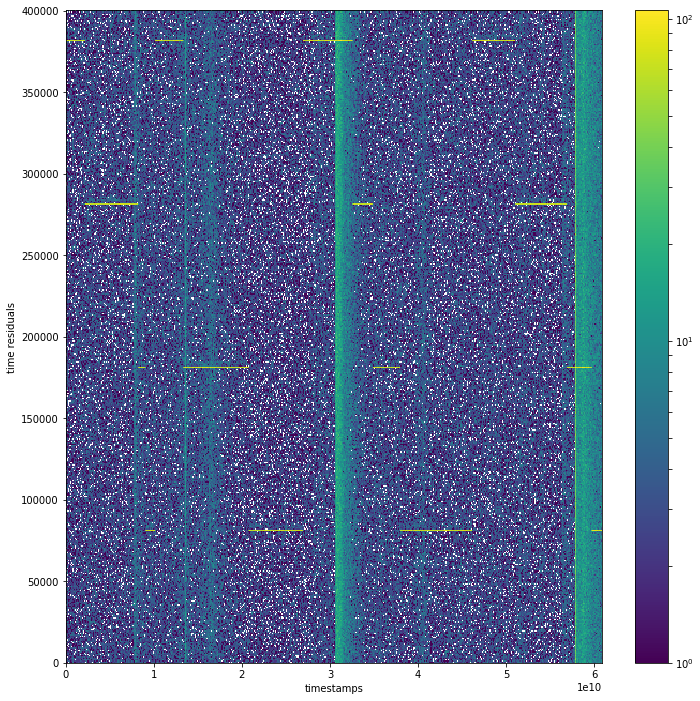

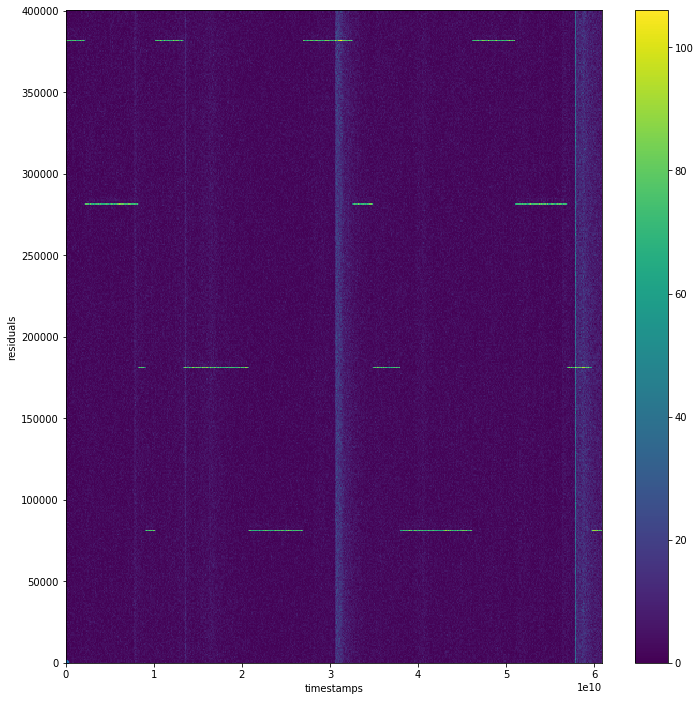

In [165]:
gaus_peak = r3.GetGausPeak([1.3e10,2e10])
abs_elim, BinsHist, JumpIndex, xedges, yedges, POCAM_bins, POCAM_diff = r3.HIST2D(500, gaus_peak, SDOM_num)

/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:719: RuntimeWarning: divide by zero encountered in true_divide
  transform = 1.0 / sigma
/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:785: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


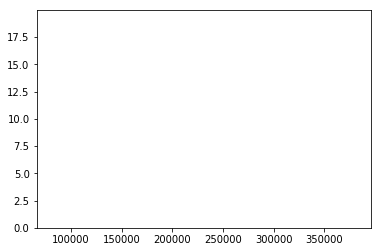

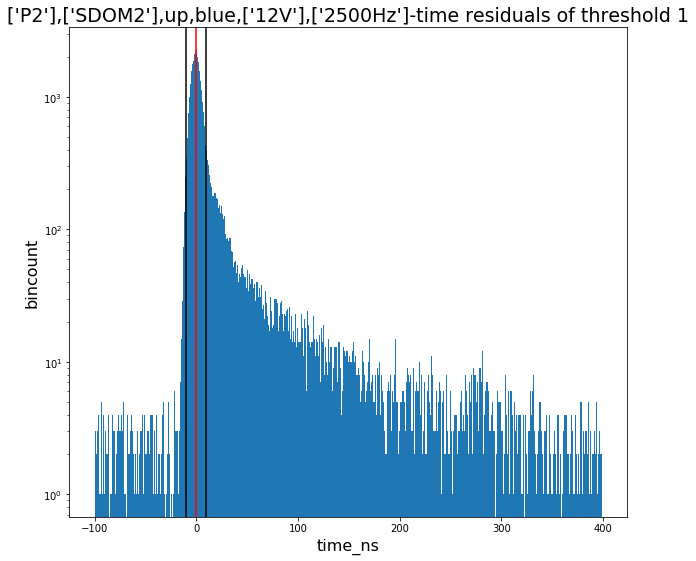

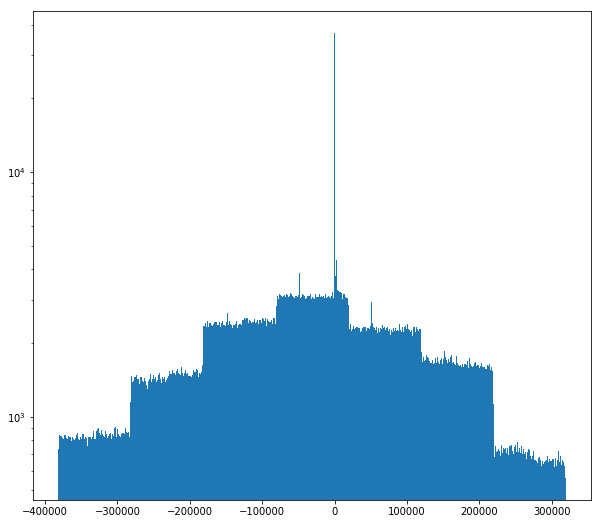

In [166]:
t_res_all1,num_events1, noise_events1 = r3.calc_res(BinsHist, 10, 2, 1,bin_size=1)

In [167]:
sDOM2_HERA_run = run.run()
run_time, err_run_time, dead_time_uncert = sDOM2_HERA_run.run_time(atstamp, p_jumps, dt_mean, c.f_0,
                                                    c.f_1-c.r_1,
                                                    c.f_2-c.r_2,
                                                    c.f_3-c.r_3)

print('dead_time_uncert: ', dead_time_uncert, '%')

timestamp of the last event -  60855497660.274414
eliminating high jumps and summing -  60844717012.00098
run time -  60844717012.00098
dead_time_uncert:  0.0 %


# ---------------------------------------------------
# sDOM3 POSEIDON 12V

In [113]:
d = clean.clean('20190426_081108_UTC_SDOM3_FLASH_POSEIDON1_P2_blue_both_2500Hz_12V_60s_19116081118.hld_up.hdf5')

percentage of high jumps in the file - 15.190855296186461


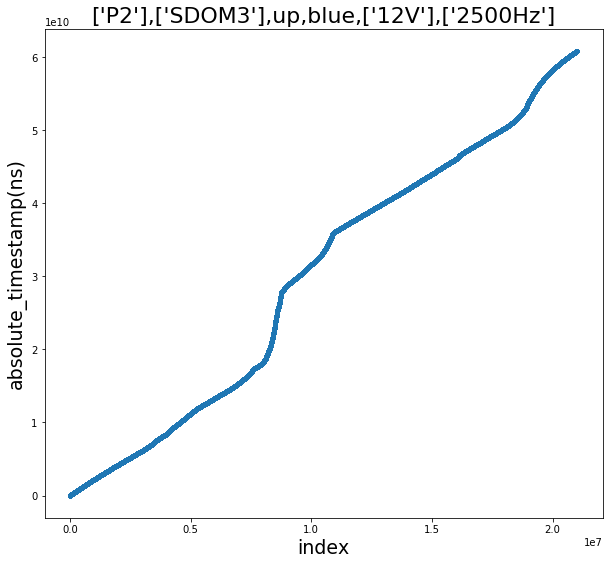

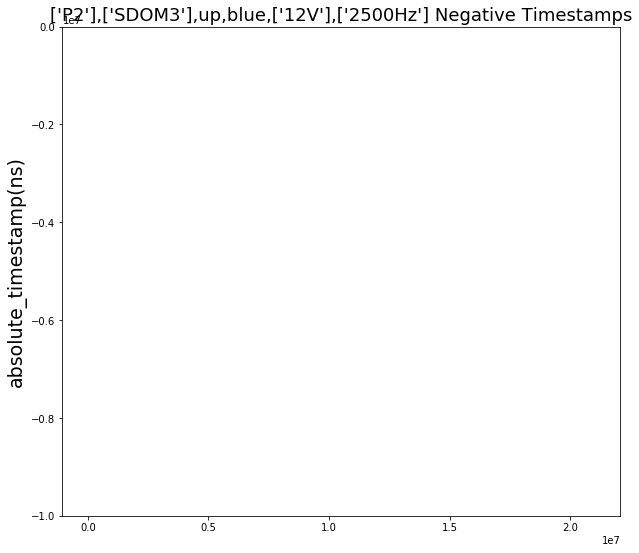

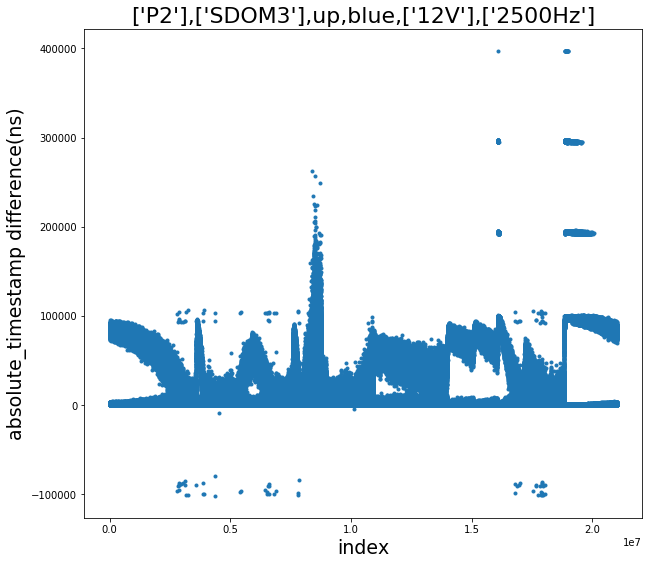

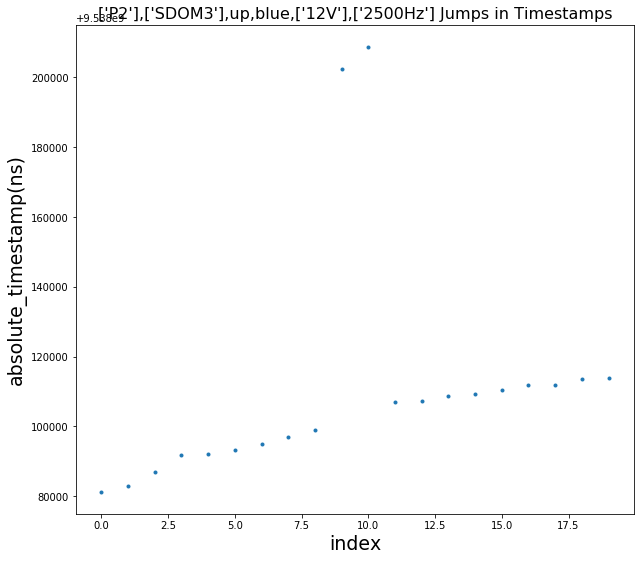

[ 2814287.  2814288.  2814289.  2825971.  2825972.  2825973.  2825974.
  2865339.  2865340.  2865341.  2865342.  2871688.  2871689.  2871690.
  2871691.  2871692.  2871693.  2872311.  2874593.  2874594.  2874595.
  2971882.  2971883.  2971884.  2971885.  3024174.  3024175.  3112297.
  3112298.  3112299.  3112300.  3112301.  3112302.  3112303.  3127000.
  3127001.  3127002.  3182372.  3182373.  3182374.  3182375.  3182376.
  3182377.  3262334.  3262335.  3262336.  3262337.  3262338.  3262339.
  3595856.  3595857.  3595858.  3595859.  3595860.  3595861.  3595862.
  3595863.  3858750.  3858751.  3858752.  3858753.  3877183.  3877184.
  3877185.  3918202.  4377287.  4377288.  4377344.  4550087.  5425167.
  5425168.  5425169.  5435225.  6449551.  6516704.  6516705.  6516706.
  6516707.  6516708.  6516709.  6532335.  6532336.  6532337.  6554278.
  6554279.  6554280.  6554281.  6554282.  6554283.  6554284.  6554285.
  6605399.  6605400.  6613940.  6613941.  6616645.  6616646.  6803586.
  6803

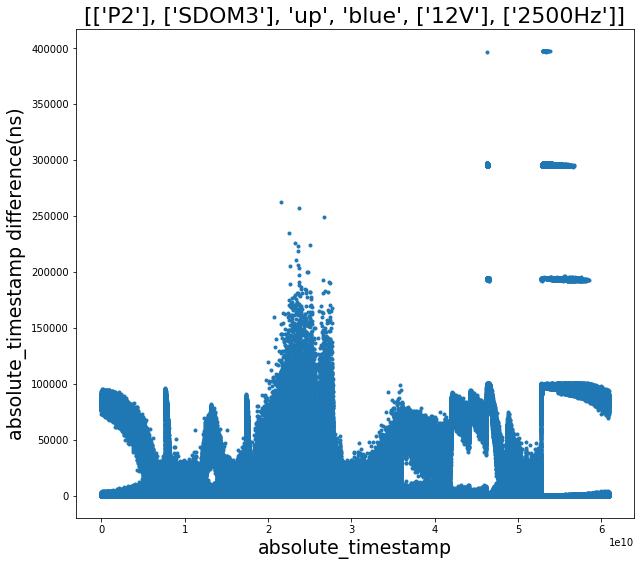

0.5134552432322381


In [114]:
(abs_elim_3, rising_0_elim_3, rising_1_elim_3, rising_2_elim_3, rising_3_elim_3,
 falling_0_elim_3, falling_1_elim_3, falling_2_elim_3, falling_3_elim_3, POCAM_num, values,
atstamp, p_jumps, dt_mean, f_r, file_path, SDOM_num, PMT,sub_time_elim_3,sub_id_elim_3) = d.P_S_used()

/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/matplotlib/ticker.py:2206: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  "Data has no positive values, and therefore cannot be "


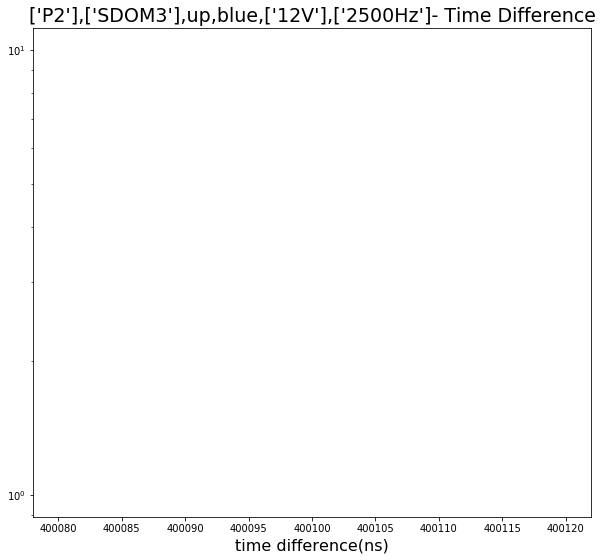

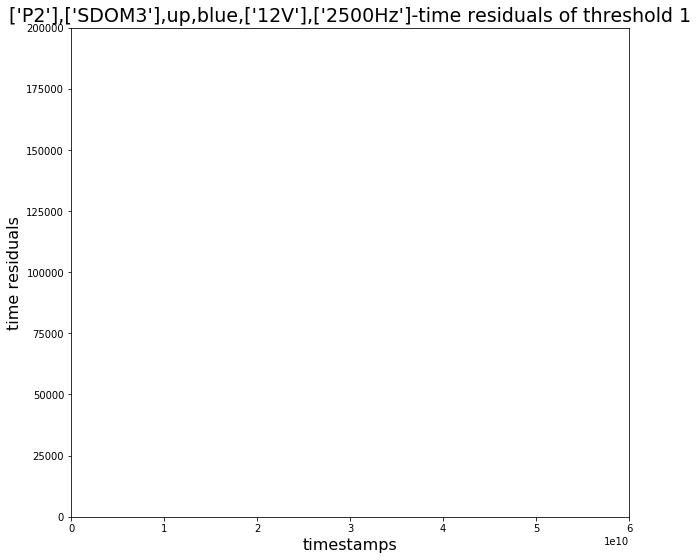

In [115]:
r4 = residual.residual(abs_elim_3,rising_1_elim_3,400080, 400120, 100, 
                                400095, 400105,
             .0e10,6e10,0, 200000, file_path, values, POCAM_num, rising_0_elim_3,falling_0_elim_3)

400100.6843978601


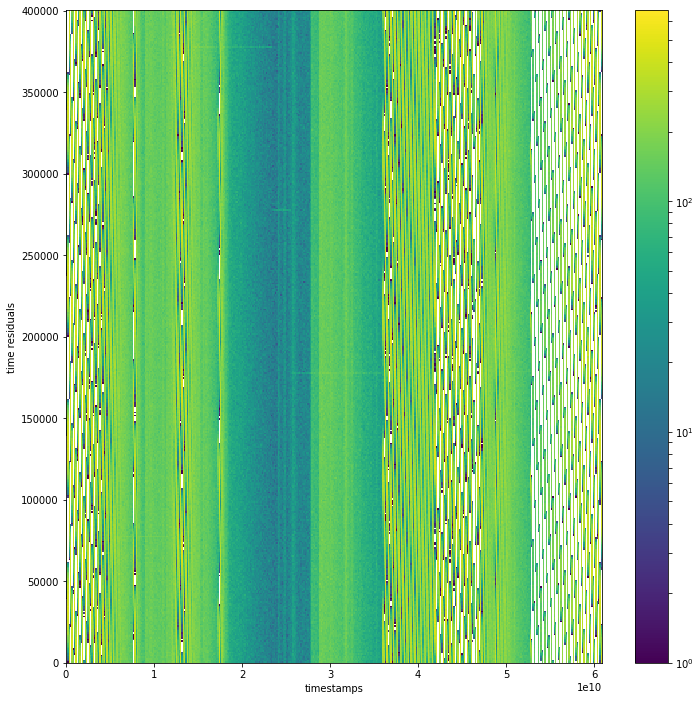

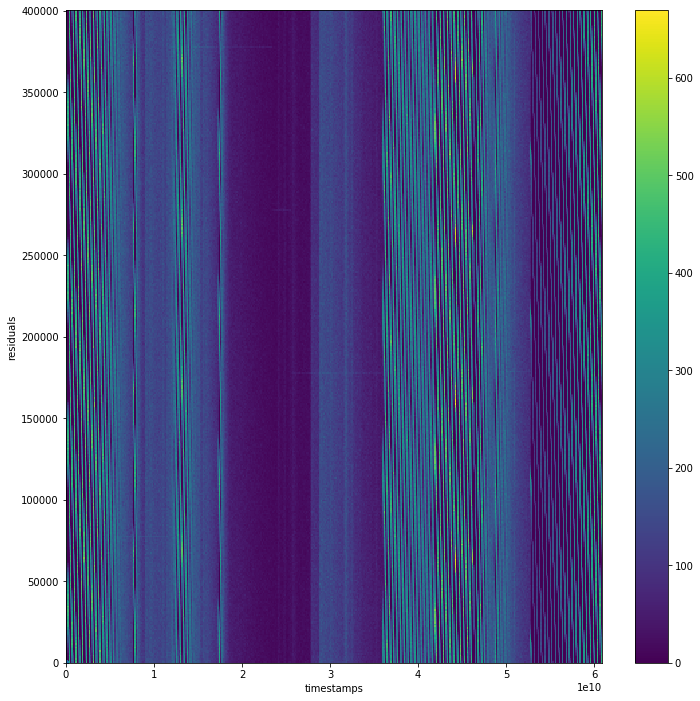

In [122]:
#gaus_peak = 400100.7106722718
gaus_peak = r4.GetGausPeak([1.9e10,2.2e10])
abs_elim, BinsHist, JumpIndex, xedges, yedges, POCAM_bins, POCAM_diff = r4.HIST2D(400, gaus_peak, SDOM_num)

0.3166666666666667


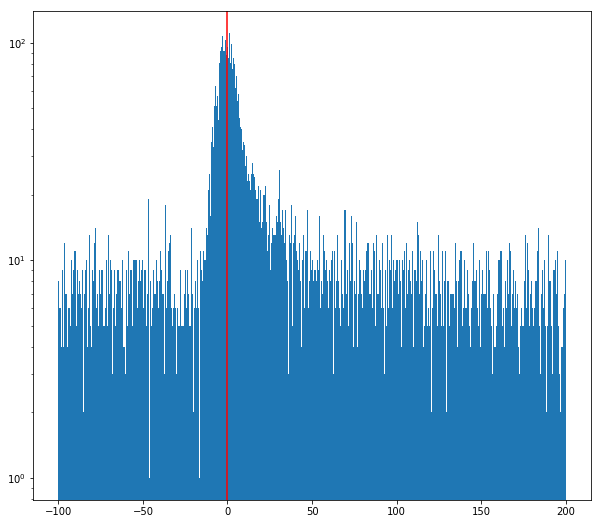

In [139]:
## POCAM signal (plot by eye)

time_window1 = (abs_elim_3<1.1e10)
time_window2 = (abs_elim_3>1.3e10) & (abs_elim_3<2.2e10)
time_window3 = (abs_elim_3>2.6e10) & (abs_elim_3<3.6e10)
#time_window4 = ((abs_elim_3>0.336e10) & (abs_elim_3<1.764e10)) 
#time_window5 = ((abs_elim_3>2.772e10) & (abs_elim_3<3.372e10))
#time_window6 = ((abs_elim_3>3.372e10) & (abs_elim_3<4.284e10))

my_data_all = np.array([])
weights_all = np.array([])

my_slice = (abs_elim_3+rising_1_elim_3)[time_window1] 
weights = r4.weights[time_window1]
my_res = (my_slice%gaus_peak) - 223260 + 145000+1000+72-700+6
#my_data_all = np.append(my_data_all, my_res)
#weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window2]
weights = r4.weights[time_window2]
my_res = (my_slice%gaus_peak) - 223260-100000+89-500-15+148000-1500-175+46-200000-1000+322-5.5
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window3]
weights = r4.weights[time_window3]
my_res = (my_slice%gaus_peak) - 223260+89-500-15-123+48000-1700+200-2-1000+250+51.5
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)


fig, ax = plt.subplots(figsize=(10,9))
n,bins,patches = ax.hist(my_data_all,bins=500,log=True, weights=weights_all, range=(-100,200))
ax.axvline(color='r')
#ax.axvline(10,color='k')
#ax.axvline(-10,color='k')

# save to csv
path = 'Data/POSEIDON1/blue/Measured_arrival_times/'
filename = "['P2'],['SDOM3'],up,blue,['12V'],['2500Hz'].csv"
with open(path+filename, 'w') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(bins[:-1])
    writer.writerow(n)
csvfile.close()

time_correction_4 = ( (2.2-1.3) + (3.6-2.6))/6
print(time_correction_4)


In [202]:
sDOM3_POSEIDON_run = run.run()
run_time, err_run_time, dead_time_uncert = sDOM3_POSEIDON_run.run_time(atstamp, p_jumps, dt_mean, d.f_0,
                                                    d.f_1-d.r_1,
                                                    d.f_2-d.r_2,
                                                    d.f_3-d.r_3)

print('dead_time_uncert: ', dead_time_uncert, '%')

time removed(small jumps) -  534851.0565404892
timestamp of the last event -  60858999379.0932
eliminating high jumps and summing -  41666090349.17998
run time -  41665555498.123436
dead_time_uncert:  1.303564237783164 %


# ---------------------------------------------------
# sDOM3 MINOS 12V

percentage of high jumps in the file - 2.7059210586439777


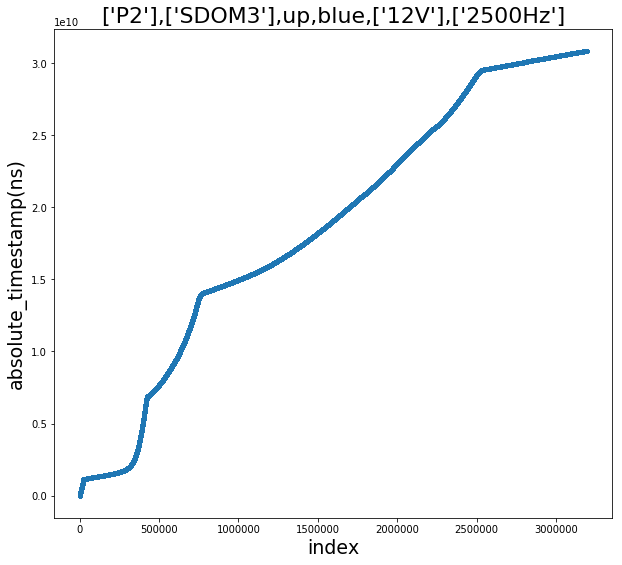

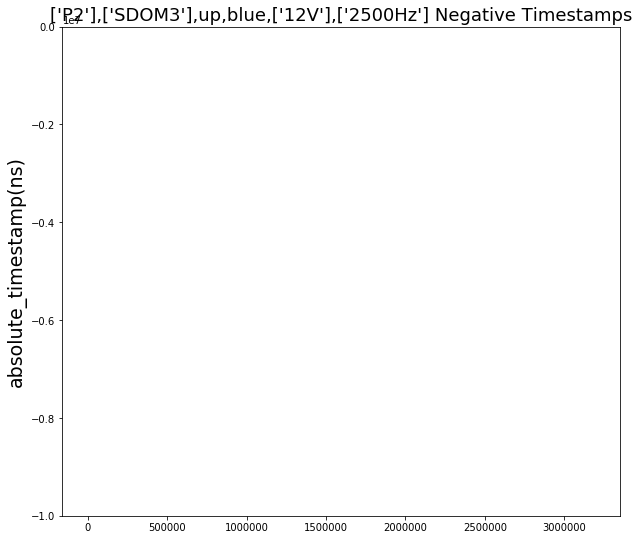

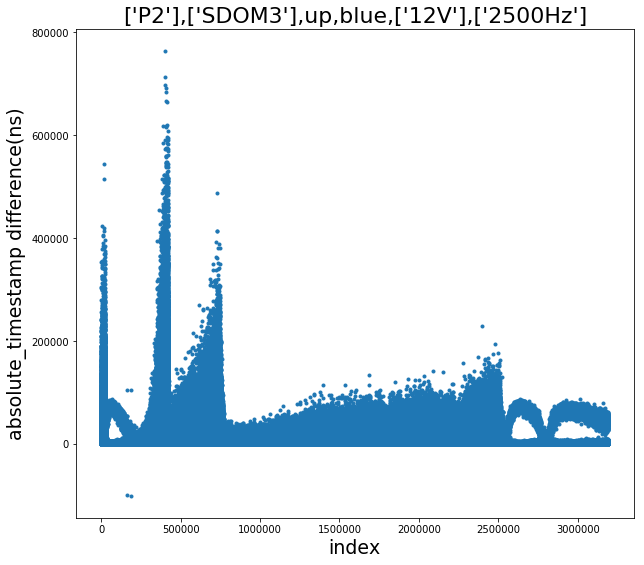

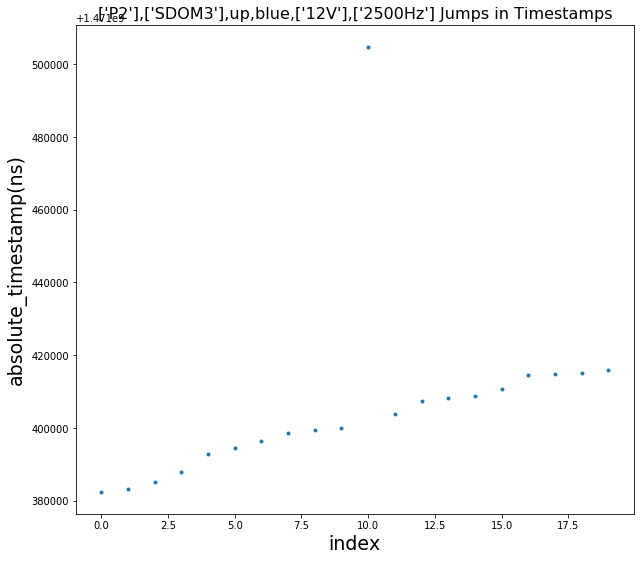

[161448. 161449. 190060.]


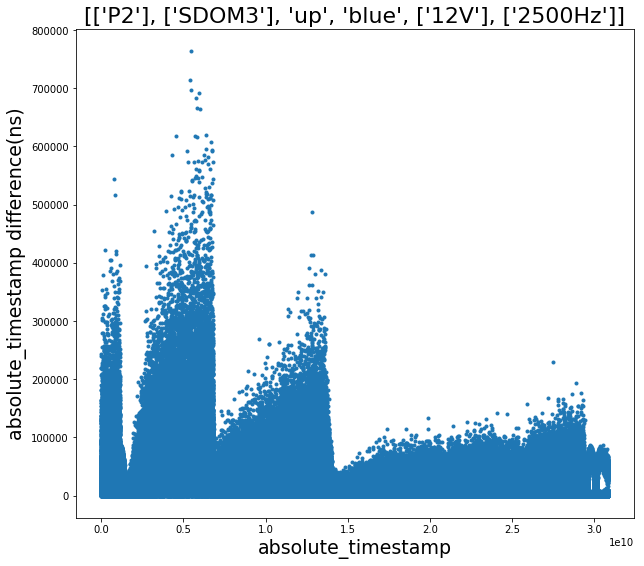

0.17511025547654735


In [26]:
d = clean.clean('20190313_153156_UTC_SDOM3_FLASH_MINOS1_P2_blue_both_2500Hz_12V_30s_19072153206.hld_up.hdf5')

(abs_elim_3, rising_0_elim_3, rising_1_elim_3, rising_2_elim_3, rising_3_elim_3,
 falling_0_elim_3, falling_1_elim_3, falling_2_elim_3, falling_3_elim_3, POCAM_num, values,
atstamp, p_jumps, dt_mean, f_r, file_path, SDOM_num, PMT,sub_time_elim_3,sub_id_elim_3) = d.P_S_used()

/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/matplotlib/ticker.py:2206: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  "Data has no positive values, and therefore cannot be "


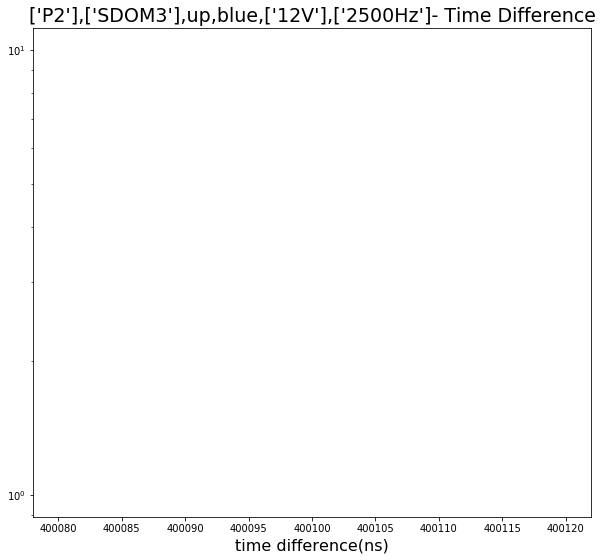

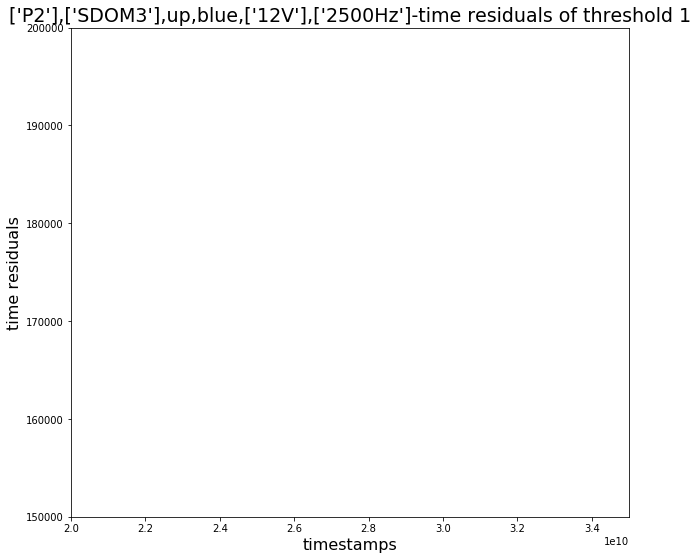

In [27]:
r4 = residual.residual(abs_elim_3,rising_1_elim_3,400080, 400120, 100, 
                                400095, 400105,
             2.0e10,3.5e10,150000, 200000, file_path, values, POCAM_num, rising_0_elim_3,falling_0_elim_3)

400100.6654873659


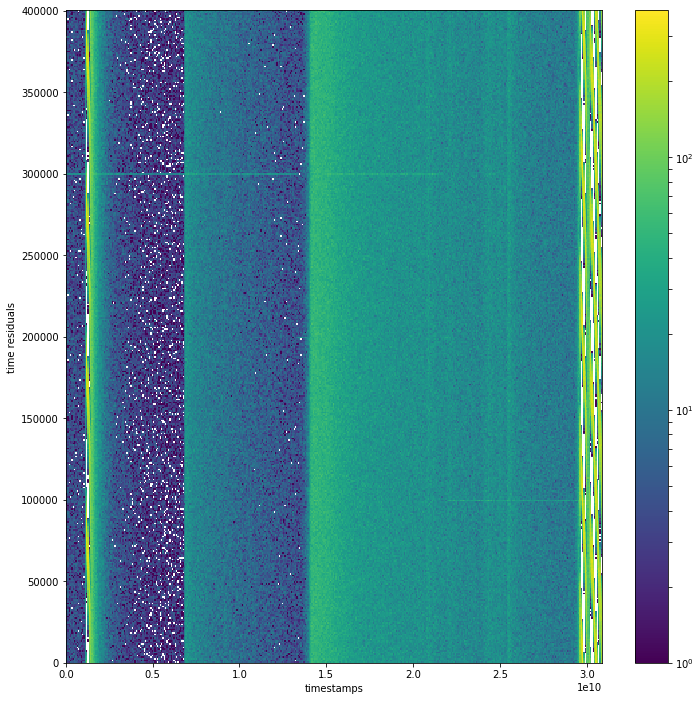

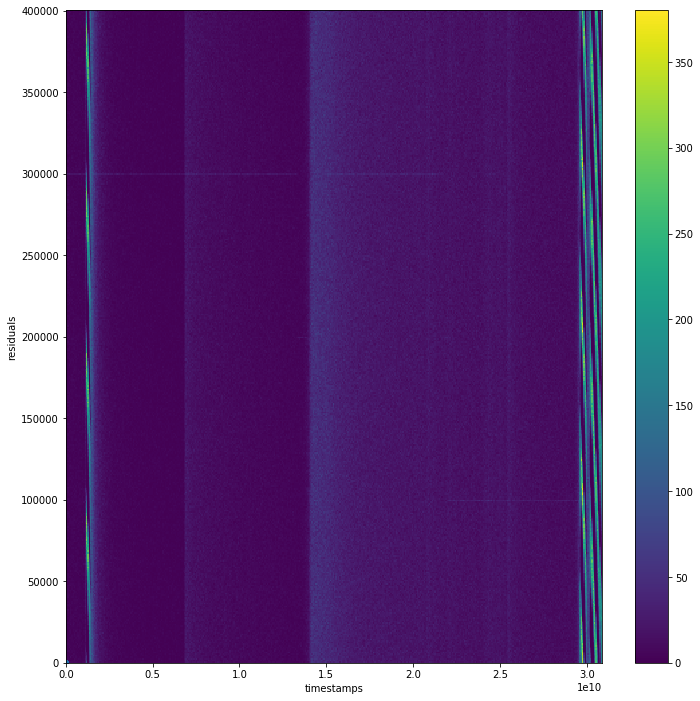

In [29]:
gaus_peak = r4.GetGausPeak([0.0e10,1.3e10])
abs_elim, BinsHist, JumpIndex, xedges, yedges, POCAM_bins, POCAM_diff = r4.HIST2D(400, gaus_peak, SDOM_num)

2.836059986774133


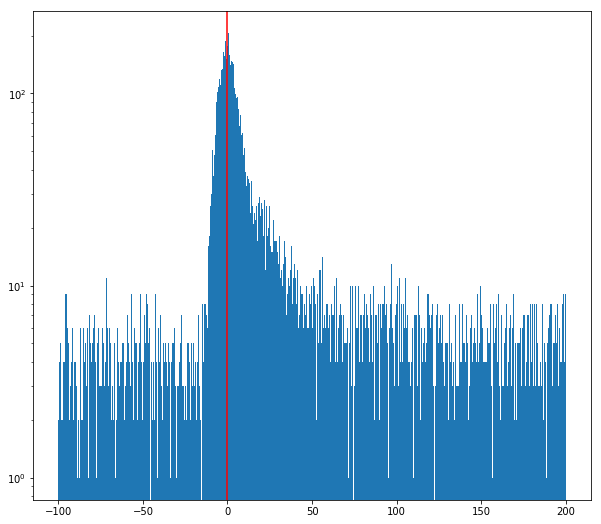

In [56]:
## POCAM signal (plot by eye)

time_window1 = (abs_elim_3<1.25e10)
time_window2 = (abs_elim_3>1.5e10) & (abs_elim_3<2.15e10)
time_window3 = (abs_elim_3>2.15e10)

my_data_all = np.array([])
weights_all = np.array([])

my_slice = (abs_elim_3+rising_1_elim_3)[time_window1] 
weights = r4.weights[time_window1]
my_res = (my_slice%gaus_peak) - 300000+369.5
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window2]
weights = r4.weights[time_window2]
my_res = (my_slice%gaus_peak) - 300000+272.5
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window3]
weights = r4.weights[time_window3]
my_res = (my_slice%gaus_peak) - 100000+274.5
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)


fig, ax = plt.subplots(figsize=(10,9))
n,bins,patches = ax.hist(my_data_all,bins=500,log=True, weights=weights_all, range=(-100,200))
ax.axvline(color='r')
#ax.axvline(10,color='k')
#ax.axvline(-10,color='k')

# save to csv
path = 'Data/MINOS1/blue/Measured_arrival_times/'
filename = "['P2'],['SDOM3'],up,blue,['12V'],['2500Hz'].csv"
with open(path+filename, 'w') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(bins[:-1])
    writer.writerow(n)
csvfile.close()

time_correction_4 = (1.25 + (2.15-1.5) + (abs_elim_3[-1]/1e10-2.15))*1e10/(abs_elim_3[-1]-abs_elim_3[0])
print(time_correction_4)


In [31]:
sDOM3_POSEIDON_run = run.run()
run_time, err_run_time, dead_time_uncert = sDOM3_POSEIDON_run.run_time(atstamp, p_jumps, dt_mean, d.f_0,
                                                    d.f_1-d.r_1,
                                                    d.f_2-d.r_2,
                                                    d.f_3-d.r_3)

print('dead_time_uncert: ', dead_time_uncert, '%')

time removed(small jumps) -  8764.399120092392
timestamp of the last event -  30860599867.741333
eliminating high jumps and summing -  30106431897.21157
run time -  30106423132.81245
dead_time_uncert:  0.4287918613237877 %


# ---------------------------------------------------
# sDOM3 HERA 12V

percentage of high jumps in the file - 3.234621487609916


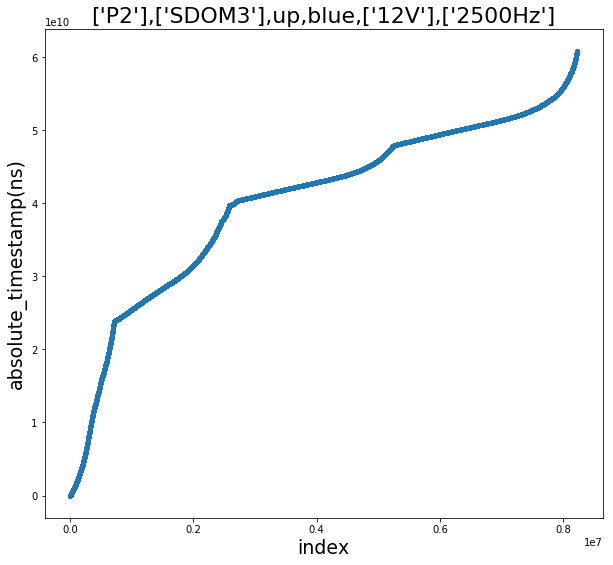

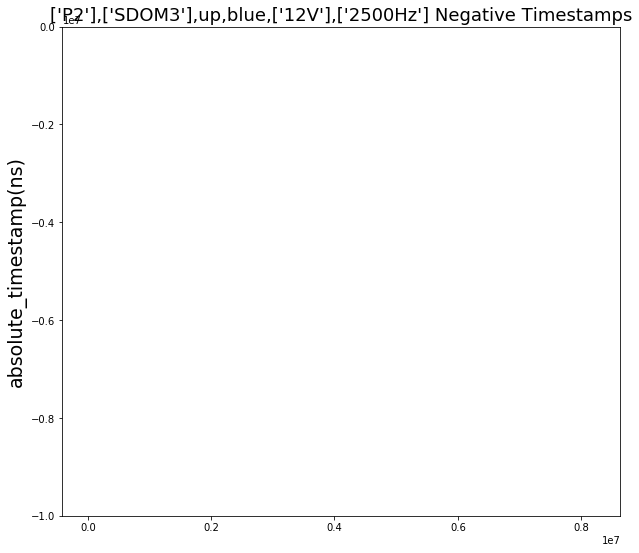

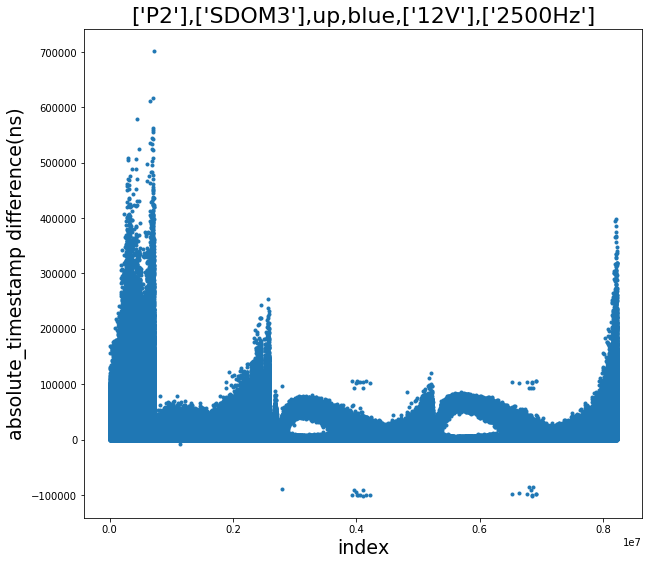

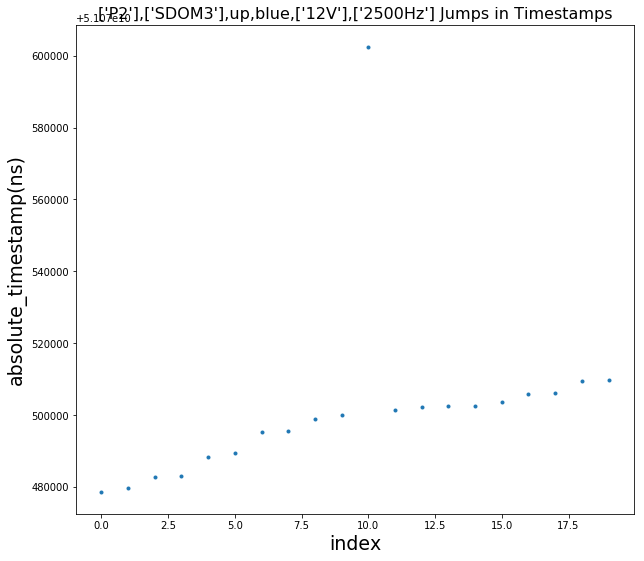

[1141431. 1141432. 1141433. 1141434. 1141435. 2796465. 2796466. 2796467.
 3935090. 3935091. 3958668. 3958669. 3958670. 3958671. 3958672. 3993629.
 3993630. 3993631. 3993632. 3993633. 3993634. 3993635. 4017486. 4017487.
 4022224. 4022225. 4022226. 4022227. 4022228. 4022229. 4061165. 4061166.
 4061167. 4104242. 4106614. 4106615. 4106616. 4106617. 4106618. 4106619.
 4106620. 4106621. 4106622. 4156174. 4156175. 4223993. 6519108. 6641177.
 6775538. 6775539. 6775540. 6800528. 6800529. 6800530. 6800531. 6837351.
 6837352. 6837353. 6837354. 6837355. 6837356. 6837357. 6837358. 6837359.
 6848706. 6851042. 6874168. 6874169. 6874170. 6874171. 6874172. 6920405.
 6920462.]


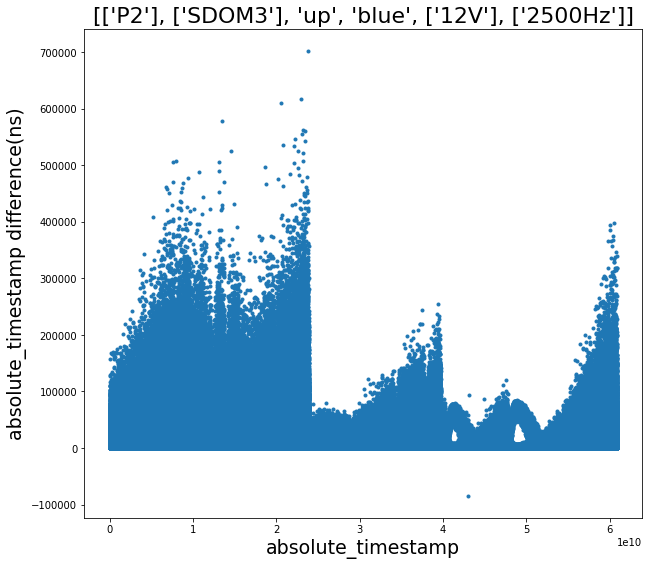

0.19514468429582865


In [168]:
d = clean.clean('20190607_151715_UTC_SDOM3_FLASH_HERA1_P2_blue_both_2500Hz_12V_60s_19158151725.hld_up.hdf5')

(abs_elim_3, rising_0_elim_3, rising_1_elim_3, rising_2_elim_3, rising_3_elim_3,
 falling_0_elim_3, falling_1_elim_3, falling_2_elim_3, falling_3_elim_3, POCAM_num, values,
atstamp, p_jumps, dt_mean, f_r, file_path, SDOM_num, PMT,sub_time_elim_3,sub_id_elim_3) = d.P_S_used()

/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_base.py:3285: UserWarning: Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=1.0, top=1.0
  'bottom=%s, top=%s') % (bottom, top))


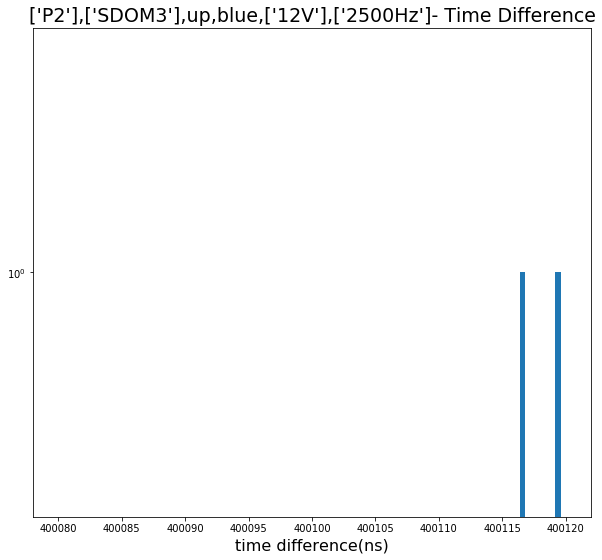

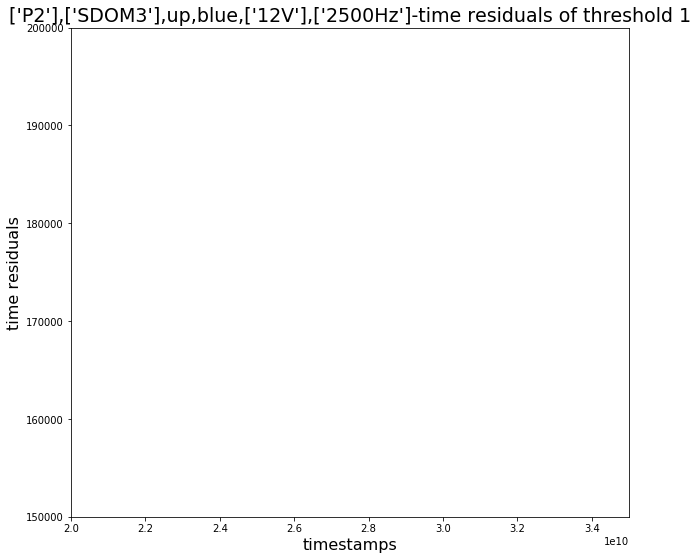

In [169]:
r4 = residual.residual(abs_elim_3,rising_1_elim_3,400080, 400120, 100, 
                                400095, 400105,
             2.0e10,3.5e10,150000, 200000, file_path, values, POCAM_num, rising_0_elim_3,falling_0_elim_3)

400100.69121085905


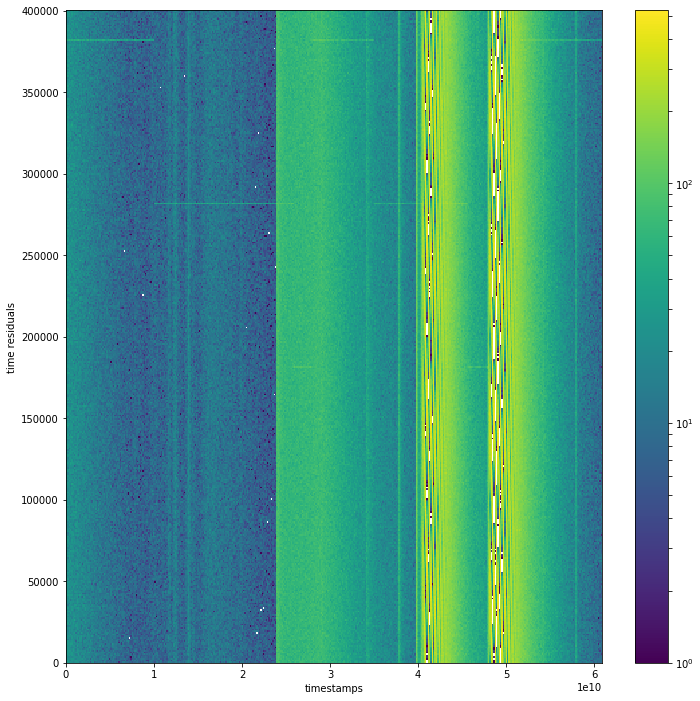

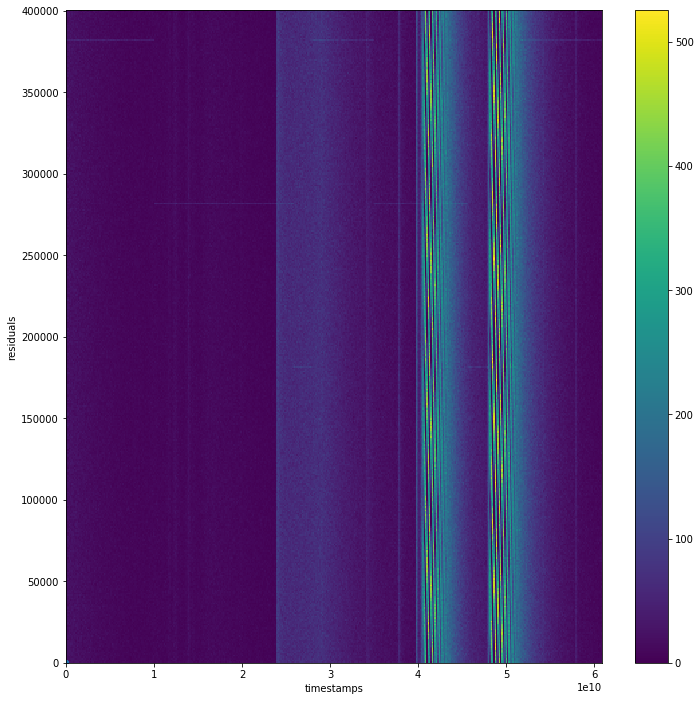

In [174]:
gaus_peak = r4.GetGausPeak([1.1e10,2.2e10])
abs_elim, BinsHist, JumpIndex, xedges, yedges, POCAM_bins, POCAM_diff = r4.HIST2D(400, gaus_peak, SDOM_num)

0.8642697673644203


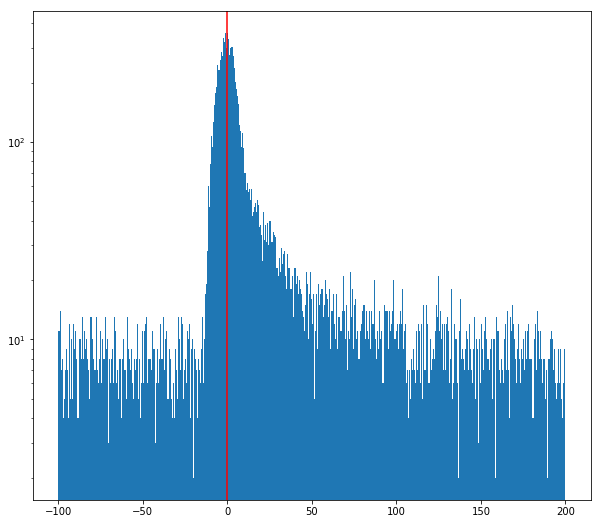

In [197]:
## POCAM signal (plot by eye)

time_window1 = (abs_elim_3<1.0e10)
time_window2 = (abs_elim_3>1.0e10) & (abs_elim_3<2.6e10)
time_window3 = (abs_elim_3>2.9e10) & (abs_elim_3<3.4e10)
time_window4 = (abs_elim_3>3.4e10) & (abs_elim_3<4.6e10)
time_window5 = (abs_elim_3>5.2e10)

my_data_all = np.array([])
weights_all = np.array([])

my_slice = (abs_elim_3+rising_1_elim_3)[time_window1] 
weights = r4.weights[time_window1]
my_res = (my_slice%gaus_peak) - 381250.5
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window2]
weights = r4.weights[time_window2]
my_res = (my_slice%gaus_peak) - 281251
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window3]
weights = r4.weights[time_window3]
my_res = (my_slice%gaus_peak) - 381350.5
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window4]
weights = r4.weights[time_window4]
my_res = (my_slice%gaus_peak) - 281351
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window5]
weights = r4.weights[time_window5]
my_res = (my_slice%gaus_peak) - 381460+4.5
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)


fig, ax = plt.subplots(figsize=(10,9))
n,bins,patches = ax.hist(my_data_all,bins=500,log=True, weights=weights_all, range=(-100,200))
ax.axvline(color='r')
#ax.axvline(10,color='k')
#ax.axvline(-10,color='k')

# save to csv
path = 'Data/HERA1/blue/Measured_arrival_times/'
filename = "['P2'],['SDOM3'],up,blue,['12V'],['2500Hz'].csv"
with open(path+filename, 'w') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(bins[:-1])
    writer.writerow(n)
csvfile.close()

time_correction_4 = (4.3 + (abs_elim_3[-1]/1e10-5.2))/6
print(time_correction_4)


In [176]:
sDOM3_HERA_run = run.run()
run_time, err_run_time, dead_time_uncert = sDOM3_HERA_run.run_time(atstamp, p_jumps, dt_mean, d.f_0,
                                                    d.f_1-d.r_1,
                                                    d.f_2-d.r_2,
                                                    d.f_3-d.r_3)

print('dead_time_uncert: ', dead_time_uncert, '%')

time removed(small jumps) -  77990.9900932312
timestamp of the last event -  60856186041.86523
eliminating high jumps and summing -  58582880508.56173
run time -  58582802517.57164
dead_time_uncert:  0.5964338558812285 %


# ---------------------------------------------------
# sDOM3 POSEIDON 14V

In [172]:
d = clean.clean('20190426_082357_UTC_SDOM3_FLASH_POSEIDON1_P2_blue_both_2500Hz_14V_60s_19116082407.hld_up.hdf5')

percentage of high jumps in the file - 1.7320072426887791


In [ ]:
(abs_elim_3, rising_0_elim_3, rising_1_elim_3, rising_2_elim_3, rising_3_elim_3,
 falling_0_elim_3, falling_1_elim_3, falling_2_elim_3, falling_3_elim_3, POCAM_num, values,
atstamp, p_jumps, dt_mean, f_r, file_path, SDOM_num, PMT,sub_time_elim_3,sub_id_elim_3) = d.P_S_used()

/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/matplotlib/ticker.py:2206: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  "Data has no positive values, and therefore cannot be "


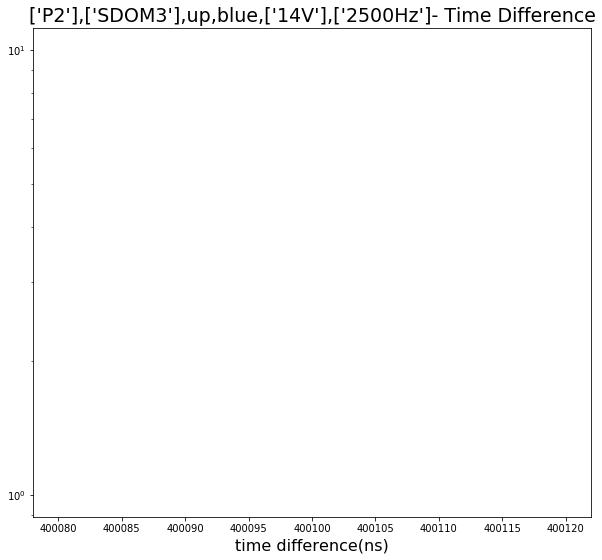

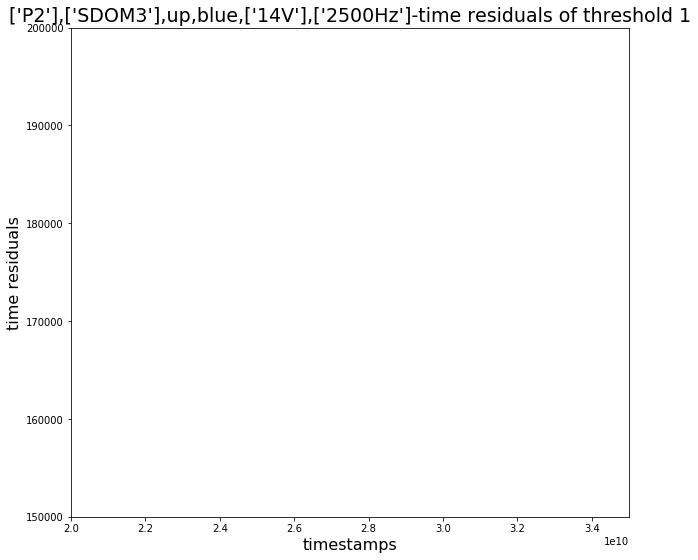

In [60]:
r4 = residual.residual(abs_elim_3,rising_1_elim_3,400080, 400120, 100, 
                                400095, 400115,
             2.0e10,3.5e10,150000, 200000, file_path, values, POCAM_num, rising_0_elim_3,falling_0_elim_3)

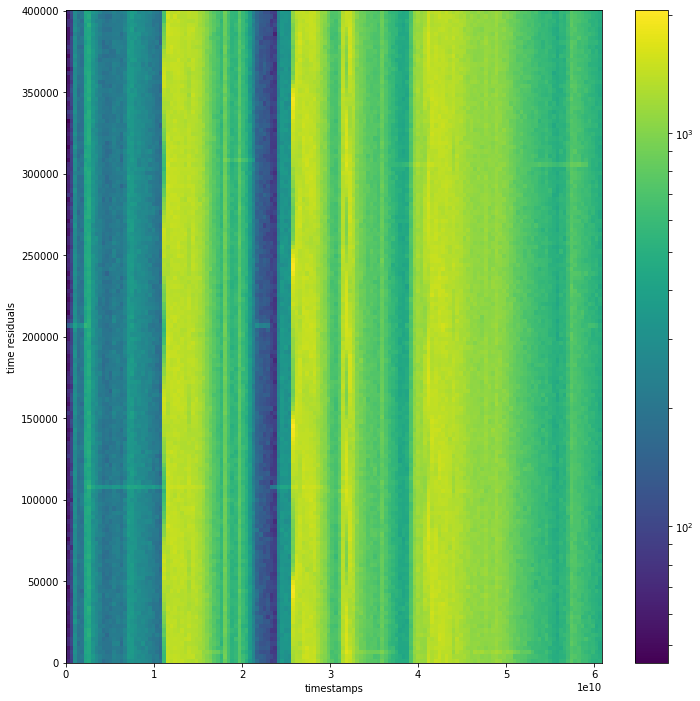

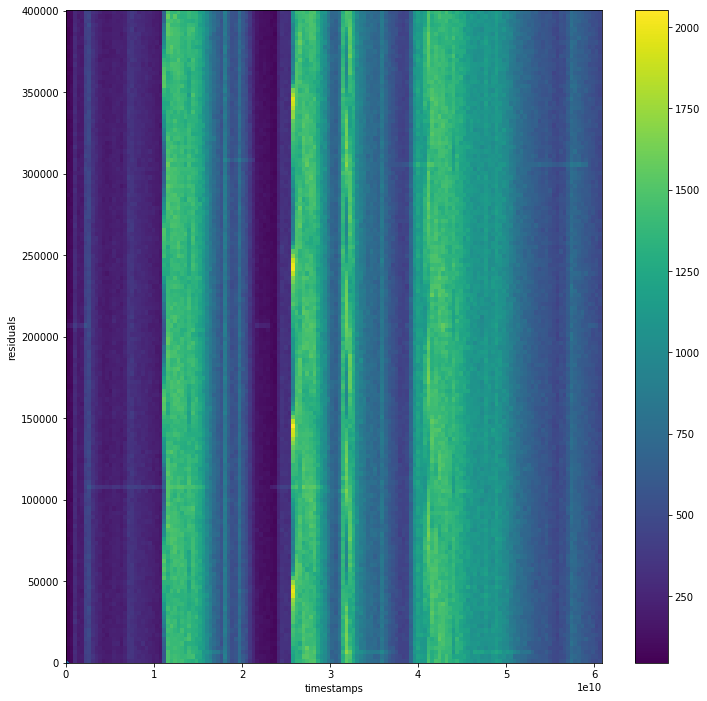

In [80]:
gaus_peak = 400100.70497649505#400100.7195540985#400100.7156722718#400100.7106722718
abs_elim, BinsHist, JumpIndex, xedges, yedges, POCAM_bins, POCAM_diff = r4.HIST2D(150, gaus_peak, SDOM_num)

/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:719: RuntimeWarning: divide by zero encountered in true_divide
  transform = 1.0 / sigma
/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:785: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


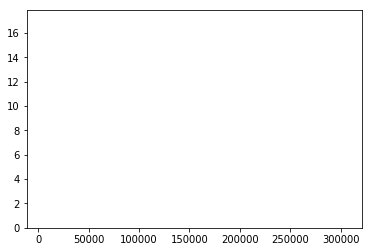

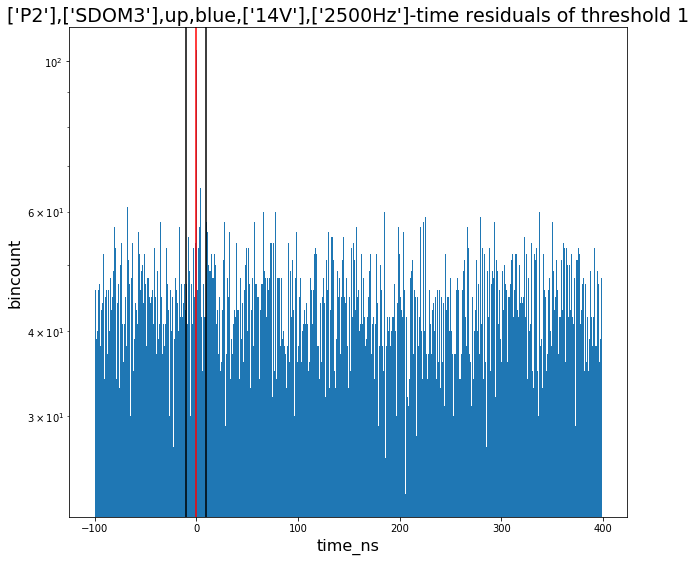

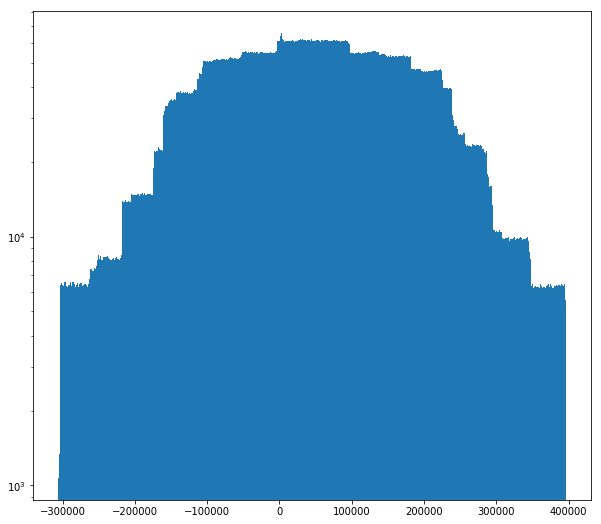

In [82]:
t_res_all1,num_events1, noise_events1 = r4.calc_res(BinsHist, 10, 2, 1,bin_size=1)

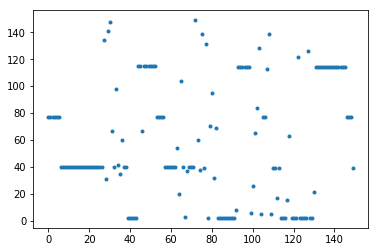

In [81]:
plt.plot(POCAM_bins,'.')